In [3]:
# compare WRF simulations using different physics options
# source activate python2
#sshfs ascott47@jhu.edu@gateway2.marcc.jhu.edu:/scratch/groups/bzaitch1/badr/ mountpoint/
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import glob
import matplotlib.cm as cm
import scipy.spatial
import os 

from netCDF4 import Dataset
from wrf import getvar
import wrf
from wrf import ALL_TIMES
#### 

import scipy.stats
# define plots
def easy_scatter(x,y,title='', xlabel='', ylabel='') : 
# plots x,y (need to be np array) and calculates and prints their best fit line
    ind = ~np.isnan(y) & ~np.isnan(x) # subset values that aren't NaNs
    m,b = np.polyfit(x[ind],y[ind],1)
    r, p = scipy.stats.pearsonr(x[ind], y[ind]) #np.corrcoef(x[ind],y[ind])[0,1]
    plt.scatter(x,y, color = 'grey')
    plt.plot(x, m*x+b, color = 'black')
    plt.title(title)
    plt.ylabel(ylabel)
    plt.xlabel(xlabel)
    # annotate the linear reqression, y = mx+b
    plt.annotate('y = %.2f x + %.2f'%(m,b), xy=(.5, .9), xycoords='axes fraction',  horizontalalignment='left', verticalalignment='bottom')
    plt.annotate('r = %.2f'%(r), xy=(.5, .85), xycoords='axes fraction',  horizontalalignment='left', verticalalignment='bottom')
    plt.annotate('p = %.2f'%(p), xy=(.5, .8), xycoords='axes fraction',  horizontalalignment='left', verticalalignment='bottom')
    plt.annotate('N = %i'%(ind[ind].shape), xy=(.5, .75), xycoords='axes fraction',  horizontalalignment='left', verticalalignment='bottom')
    return m, r, p

from scipy.odr import Model, Data, ODR
from scipy.stats import linregress
def f(B, x):
    '''Linear function y = m*x + b'''
    # B is a vector of the parameters.
    # x is an array of the current x values.
    # x is in the same format as the x passed to Data or RealData.
    #
    # Return an array in the same format as y passed to Data or RealData.
    return B[0]*x + B[1]

def easy_scatter_tls(x,y,title='', xlabel='', ylabel='', text_y_loc = .9 , text_x_loc = .5) : 
        linear = Model(f)
        ind = ~np.isnan(y) & ~np.isnan(x)
        linreg = scipy.stats.linregress(x[ind], y[ind])
        mydata = Data(x[ind], y[ind])
        myodr = ODR(mydata, linear, beta0=linreg[0:2]) # beta0 are initial guesses for paremeter values, ie, intercept and slope
        myoutput = myodr.run()
        # t-test for tls regression coeff
        DF = y[ind].shape[0] -2 # for a linear model
        b1 = myoutput.beta[0] # slope
        H0 = 1 # null hypothesis
        SE = myoutput.sd_beta[0]
        t = (b1-H0)/SE
        p = scipy.stats.t.cdf(t,df=DF)
        # plot it  
        plt.plot(x, f(myoutput.beta, x), 'k')
        plt.plot(np.linspace(x.min(), x.max(), 20),np.linspace(x.min(), x.max(), 20), '--k' )
        plt.scatter(x,y,color = 'grey', alpha =.5)
        plt.xlabel(xlabel)
        plt.ylabel(ylabel)
        plt.legend(['y = %.2f x + %.2f'%(myoutput.beta[0], myoutput.beta[1]),
                    '1-1 line', 'Data'], loc=2, frameon =False)
        plt.title(title)
        return myoutput.beta[0], myoutput.beta[1],linreg.rvalue, p

plt.style.use('ggplot')
# read in temp data 
filepath = '../cityheat/Bmore/2016/'

meta = pd.DataFrame(pd.read_csv(filepath + 'data/CleanedMeta2016.csv', sep = ','))
meta = meta.set_index('sensornumber', drop = False)
meta = meta.set_index(meta.index.astype('float64'), drop = False)
#mean_temp = pd.read_csv('meantemp.csv', header=-1).rename(columns = {0: 'SensorNumber', 1:'MeanTemp'}).set_index('SensorNumber')
tempDF = pd.read_csv(filepath + 'data/CleanedTemp2016.csv', parse_dates = [0]).set_index('Date').resample('H', how = 'first')#.first()
tempDF.columns = tempDF.columns.astype('int')

rhDF = pd.read_csv(filepath + 'data/CleanedRH2016.csv', parse_dates = [0]).set_index('Date').resample('H', how = 'first')
rhDF.columns = rhDF.columns.astype('int')

urban = 86 #97 # science center
rural = 4 #68 # darryn's house

analysis_points = meta.loc[[urban,rural]][['location:Longitude', 'location:Latitude']]
analysis_points = meta.loc[[urban,rural]][['location:Longitude', 'location:Latitude']]
analysis_points.index = ['urban', 'rural']
# pick a random rural point for analysis
analysis_points.loc['rural', 'location:Longitude'] = -76.752754
analysis_points.loc['rural', 'location:Latitude']  = 39.637964

# classify dry days and wet days and do again 
file = '/Users/ascott47/blausteinmount/heat/data/synopticclassification/' + 'BWI'+ '.dbdmt'
synopticDF =  pd.read_table(file, sep = ' ', header =  None, parse_dates = [1])
synopticDF.columns = ['id','date', 'ssc']
synopticDF = synopticDF.set_index(synopticDF['date'])
synopticDF['ssc'].loc[synopticDF['ssc']> 60] =6.5
syn = synopticDF['ssc']['2016-06-01': '2016-09-15'].resample('D').mean()#[pd.PeriodIndex(UHI.index, freq = 'D')[0]:pd.PeriodIndex(UHI.index, freq = 'D')[-1]]

/Users/ascott47/anaconda/envs/python2/lib/python2.7/site-packages/ipykernel/__main__.py:83: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).first()
/Users/ascott47/anaconda/envs/python2/lib/python2.7/site-packages/ipykernel/__main__.py:86: FutureWarning: how in .resample() is deprecated
the new syntax is .resample(...).first()


In [4]:
# pull in UCM 1km runs
fpath = '/Users/ascott47/mountpoint/wrf/out/'
variables = ['T2', 'SWDNB', 'SWUPB', 'LWDNB', 'LWUPB', 'LH', 'HFX',]# 'GRDFLX', 'TSK','QVAPOR',] # keep 3-d variables at the end
urbanDF = pd.DataFrame([], columns=variables) 
ruralDF = pd.DataFrame([], columns=variables) 

exp = 'UCM'
dom = 'd03'
files = list(np.sort(glob.glob(fpath + '%s/%s/wrfout_d01*'%(exp,dom))))
test_list = []
times = []
for file in files[48:]:
    test_list.append(Dataset(file))
points = wrf.ll_to_xy(Dataset(file), analysis_points['location:Latitude'], analysis_points['location:Longitude'])
pts = wrf.ll_to_xy(test_list[-1],analysis_points['location:Latitude'], analysis_points['location:Longitude'])
    
for varname in variables: 
    df = getvar(test_list, varname = varname,#"T2", 
              timeidx = wrf.ALL_TIMES, 
              method = 'cat'
              )
    # convert to local time
    df['Time'] = df['Time'] - pd.Timedelta('04:00:00')
    # select analysis points
    urban_data = df.isel(west_east = pts.values[0], south_north = pts.values[1])[:,0,0]
    rural_data = df.isel(west_east = pts.values[0], south_north = pts.values[1])[:,1,1]

    urbanDF[varname] = urban_data.to_pandas()
    ruralDF[varname] = rural_data.to_pandas()
    df.close()
    
urbanDF['T2'] = urbanDF['T2'] - 273.15
ruralDF['T2'] = ruralDF['T2'] - 273.15

del test_list
urbanDF.to_csv('data/urban_%s_%s.csv'%(exp, dom))
ruralDF.to_csv('data/rural_%s_%s.csv'%(exp, dom))
# for df in [urbanDF, ruralDF] : 
#     df['net_lw'] = df['LWDNB'] - df['LWUPB']
#     df['r_net'] = df['net_lw'] + df['SWDNB'] - df['SWUPB']
    
# urbanDF.to_csv('urban_%s_%s.csv'%(exp, dom))
# ruralDF.to_csv('rural_%s_%s.csv'%(exp, dom))

In [24]:
len(files)

196

In [14]:
exp = 'UCM'
dom = 'd03'
# example
date_parser = pd.core.tools.datetimes.to_datetime # pd.datetools.to_datetime
# asos = pd.read_csv('data/mdASOS_summer_2016.csv', parse_dates = ['valid'], date_parser = date_parser).set_index('valid')

urbanDF = pd.read_csv('data/urban_%s_%s.csv'%(exp, dom), parse_dates = ['Time'], date_parser = date_parser).set_index('Time')
ruralDF = pd.read_csv('data/rural_%s_%s.csv'%(exp, dom), parse_dates = ['Time'], date_parser = date_parser).set_index('Time')

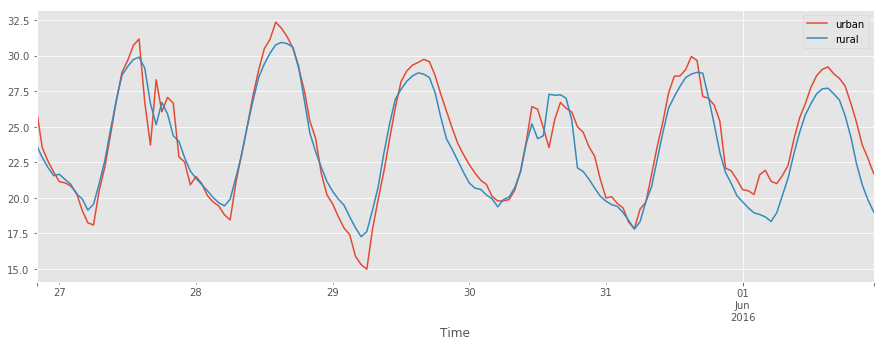

In [5]:
urbanDF['T2'].plot(figsize = [15,5])#.subtract(ruralDF['T2']).plot()
ruralDF['T2'].plot()
plt.legend(['urban', 'rural'])

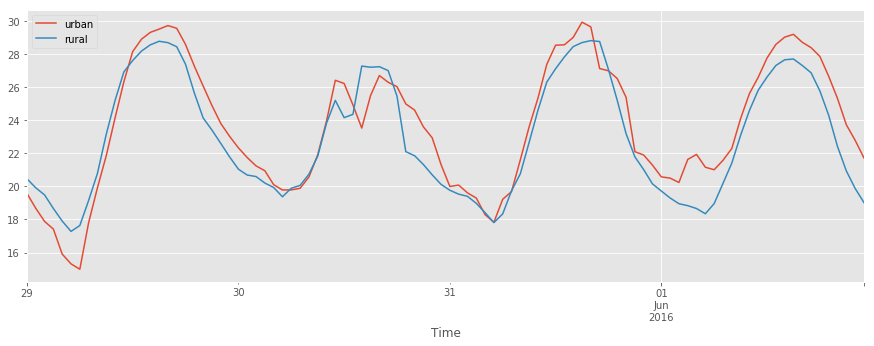

In [23]:
urbanDF['T2'].plot(figsize = [15,5])#.subtract(ruralDF['T2']).plot()
ruralDF['T2'].plot()
plt.legend(['urban', 'rural'])

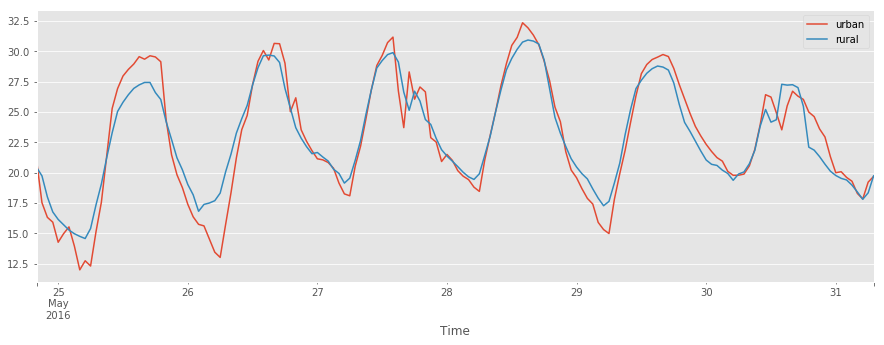

In [18]:
urbanDF['T2'].plot(figsize = [15,5])#.subtract(ruralDF['T2']).plot()
ruralDF['T2'].plot()
plt.legend(['urban', 'rural'])

(3.571117906872245,
 -49.423753030885607,
 0.54114284968162318,
 0.82528037724778902)

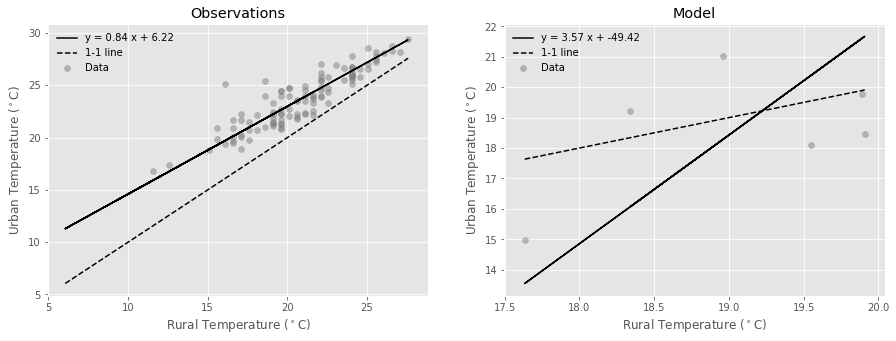

In [6]:
urban = 86 #97 # science center
rural = 4 #68 # darryn's house

plt.figure(figsize = [15,5])
ax = plt.subplot(1,2,1)
hour = 6
easy_scatter_tls(tempDF[rural][tempDF.index.hour ==hour ] , tempDF[urban][tempDF.index.hour ==hour ],
             'Observations', 
             'Rural Temperature ($^\circ $C)', 'Urban Temperature ($^\circ $C)')
#plt.plot(tempDF[rural][tempDF.index.hour ==hour ], tempDF[rural][tempDF.index.hour ==hour ], color = 'blue', zorder =0)
#plt.legend(['Linear Fit', 'x=y', 'obs.'])


ax=plt.subplot(1,2,2)
easy_scatter_tls(ruralDF[ruralDF.index.hour ==6 ]['T2'],
             urbanDF[urbanDF.index.hour ==6 ]['T2'], 'Model', 
             'Rural Temperature ($^\circ $C)', 'Urban Temperature ($^\circ $C)')
#plt.plot(ruralDF[ruralDF.index.hour ==6 ]['T2'],ruralDF[ruralDF.index.hour ==6 ]['T2'], color = 'blue', zorder =0)

In [2]:
# import data
# observations
# urban = 108
# rural = 68

# model 
# located on MARCC at : /scratch/groups/bzaitch1/badr/wrf/out/UCM+SST/d03
dom = 'd03'
exp = 'UCM+SST'
#files = list(np.sort(glob.glob('/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_*')))
# # files = list(np.sort(glob.glob(fpath+'%s/%s/wrfout_*'%(exp, dom))))

# variables = ['T2', 'SWDNB', 'SWUPB', 'LWDNB', 'LWUPB', 'LH', 'HFX', 'GRDFLX', 'TSK','QVAPOR',] # keep 3-d variables at the end
# urban_df = np.ones([len(files), len(variables)])
# rural_df = np.ones([len(files), len(variables)])
# i = 0
# times = []

# # # define pts to extract 
# # pts = wrf.ll_to_xy(Dataset(files[0]),
# #                    analysis_points['location:Latitude'], 
# #                    analysis_points['location:Longitude'])
# pts =pd.DataFrame([ [85,87],#west_east
#                    [140, 109] ]) # south_north
# for file in files: 
#     ncfile = Dataset(file, 'r')
#     # This only works for 1d variables
#     urban_df[i,:-1] = [ncfile.variables[x][:,pts.values[0][0], pts.values[0][1] ] for x in variables[:-1]]
#     rural_df[i,:-1] = [ncfile.variables[x][:,pts.values[1][0], pts.values[1][1] ] for x in variables[:-1]] 
#     # For 3-d variables, take the surface component
#     urban_df[i,-1] = [ncfile.variables[variables[-1]][:,0,pts.values[0][0], pts.values[0][1] ]][0]
#     rural_df[i,-1] = [ncfile.variables[variables[-1]][:,0,pts.values[1][0], pts.values[1][1] ]][0]      
#     ncfile.close()
#     times.append(file[-19:])
#     i = i+1
# urbanDF = pd.DataFrame(urban_df[:i,:], columns=variables, 
#              index = pd.to_datetime(times, format = '%Y-%m-%d_%H:%M:%S') - pd.Timedelta('04:00:00'))
# ruralDF = pd.DataFrame(rural_df[:i,:], columns=variables, 
#              index = pd.to_datetime(times, format = '%Y-%m-%d_%H:%M:%S') - pd.Timedelta('04:00:00'))

# urbanDF['T2'] = urbanDF['T2'] - 273.15
# ruralDF['T2'] = ruralDF['T2'] - 273.15
# for df in [urbanDF, ruralDF] : 
#     df['net_lw'] = df['LWDNB'] - df['LWUPB']
#     df['r_net'] = df['net_lw'] + df['SWDNB'] - df['SWUPB']
    
# urbanDF.to_csv('urban_%s_%s.csv'%(exp, dom))
# ruralDF.to_csv('rural_%s_%s.csv'%(exp, dom))

exp = 'wrfanalysis'
dom = '3km'
urbanDF = pd.read_csv('urban_%s_%s.csv'%(exp, dom), parse_dates = ['Unnamed: 0']).set_index('Unnamed: 0').resample('H').mean()
ruralDF = pd.read_csv('rural_%s_%s.csv'%(exp, dom), parse_dates = ['Unnamed: 0']).set_index('Unnamed: 0').resample('H').mean()
urbanDF.index = urbanDF.index - pd.Timedelta('04:00:00')
ruralDF.index = ruralDF.index - pd.Timedelta('04:00:00')
for df in [urbanDF, ruralDF] : 
    df['net_lw'] = df['LWDNB'] - df['LWUPB']
    df['r_net'] = df['net_lw'] + df['SWDNB'] - df['SWUPB']

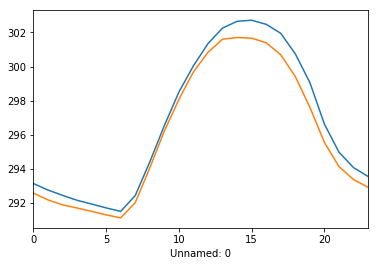

In [3]:
urbanDF.T2.groupby(urbanDF.index.hour).mean().plot()
ruralDF.T2.groupby(urbanDF.index.hour).mean().plot()

In [15]:
files

['/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_d01_2016-05-25_00:00:00',
 '/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_d01_2016-05-25_01:00:00',
 '/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_d01_2016-05-25_02:00:00',
 '/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_d01_2016-05-25_03:00:00',
 '/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_d01_2016-05-25_04:00:00',
 '/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_d01_2016-05-25_05:00:00',
 '/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_d01_2016-05-25_06:00:00',
 '/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_d01_2016-05-25_07:00:00',
 '/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_d01_2016-05-25_08:00:00',
 '/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_d01_2016-05-25_09:00:00',
 '/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_d01_2016-05-25_10:00:00',
 '/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_d01_2016-05-25_11:00:00',
 '/Users/ascott4

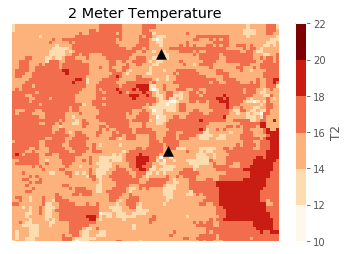

In [39]:
# add a map slide
#ncfile = Dataset(files[6], 'r')
#plt.figure(figsize = [10,10])
#ncfile = Dataset('/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_d01_2016-05-25_06:00:00', 'r')
#t2 = getvar(ncfile, varname = "T2") 
(t2-273.15).plot(levels = 6, cmap = cm.OrRd)
pts =pd.DataFrame([ [85,87],#west_east
                   [140, 109] ]) # south_north
plt.scatter(pts.values[0], pts.values[1], marker = '^', s = 100,color = 'k')
plt.xlim([40,120])
plt.ylim([80,150])
plt.xticks([])
plt.yticks([])
plt.ylabel('')
plt.xlabel('')

plt.title('2 Meter Temperature')
plt.savefig('plots/agu/map.pdf')
# add urban-rural points 

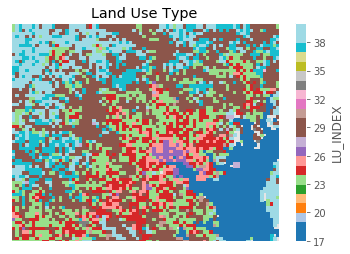

In [40]:
lc = getvar(ncfile, "LU_INDEX")
lc.plot(levels = 24, cmap  = cm.tab20)
plt.xlim([40,120])
plt.ylim([80,150])
plt.xticks([])
plt.yticks([])
plt.ylabel('')
plt.xlabel('')
plt.title('Land Use Type')
plt.savefig('plots/agu/landuse.pdf')

In [ ]:
pts =pd.DataFrame([ [85,87],#west_east
                   [140, 109] ]) # south_north

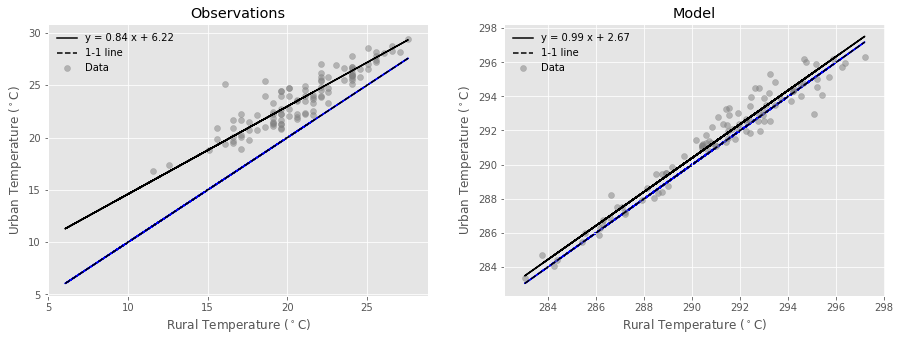

In [48]:
#easy_scatter_tls(x,y,title='', xlabel='', ylabel='', text_y_loc = .9 , text_x_loc = .5)
plt.figure(figsize = [15,5])
ax = plt.subplot(1,2,1)
hour = 6
easy_scatter_tls(tempDF[rural][tempDF.index.hour ==hour ] , tempDF[urban][tempDF.index.hour ==hour ],
             'Observations', 
             'Rural Temperature ($^\circ $C)', 'Urban Temperature ($^\circ $C)')
plt.plot(tempDF[rural][tempDF.index.hour ==hour ], tempDF[rural][tempDF.index.hour ==hour ], color = 'blue', zorder =0)
#plt.legend(['Linear Fit', 'x=y', 'obs.'])


ax=plt.subplot(1,2,2)
easy_scatter_tls(ruralDF[ruralDF.index.hour ==6 ]['T2'],
             urbanDF[urbanDF.index.hour ==6 ]['T2'], 'Model', 
             'Rural Temperature ($^\circ $C)', 'Urban Temperature ($^\circ $C)')
plt.plot(ruralDF[ruralDF.index.hour ==6 ]['T2'],ruralDF[ruralDF.index.hour ==6 ]['T2'], color = 'blue', zorder =0)
#plt.legend(['Linear Fit', 'x=y', 'obs.'], loc =4)

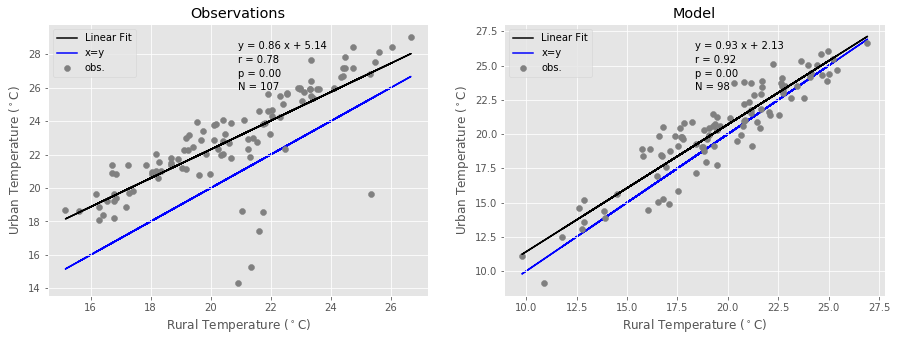

In [181]:
# Both model and observations show that nighttime urban-rural differences decrease during warmer conditions. 

plt.figure(figsize = [15,5])
ax = plt.subplot(1,2,1)
hour = 6
easy_scatter(tempDF[rural][tempDF.index.hour ==hour ] , tempDF[urban][tempDF.index.hour ==hour ],
             'Observations', 
             'Rural Temperature ($^\circ $C)', 'Urban Temperature ($^\circ $C)')
plt.plot(tempDF[rural][tempDF.index.hour ==hour ], tempDF[rural][tempDF.index.hour ==hour ], color = 'blue', zorder =0)
plt.legend(['Linear Fit', 'x=y', 'obs.'])


ax=plt.subplot(1,2,2)
easy_scatter(ruralDF[ruralDF.index.hour ==6 ]['T2'],
             urbanDF[urbanDF.index.hour ==6 ]['T2'], 'Model', 
             'Rural Temperature ($^\circ $C)', 'Urban Temperature ($^\circ $C)')
plt.plot(ruralDF[ruralDF.index.hour ==6 ]['T2'],ruralDF[ruralDF.index.hour ==6 ]['T2'], color = 'blue', zorder =0)
plt.legend(['Linear Fit', 'x=y', 'obs.'])
plt.savefig('plots/agu/fig1.pdf')

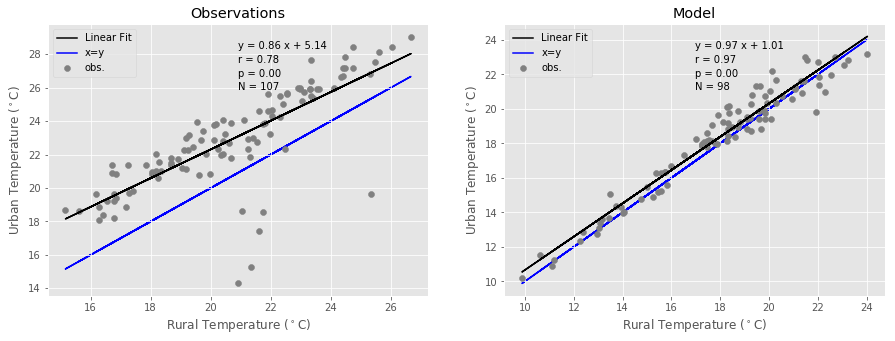

In [79]:
# Both model and observations show that nighttime urban-rural differences decrease during warmer conditions. 

plt.figure(figsize = [15,5])
ax = plt.subplot(1,2,1)
hour = 6
easy_scatter(tempDF[rural][tempDF.index.hour ==hour ] , tempDF[urban][tempDF.index.hour ==hour ],
             'Observations', 
             'Rural Temperature ($^\circ $C)', 'Urban Temperature ($^\circ $C)')
plt.plot(tempDF[rural][tempDF.index.hour ==hour ], tempDF[rural][tempDF.index.hour ==hour ], color = 'blue', zorder =0)
plt.legend(['Linear Fit', 'x=y', 'obs.'])


ax=plt.subplot(1,2,2)
easy_scatter(ruralDF[ruralDF.index.hour ==6 ]['T2'],
             urbanDF[urbanDF.index.hour ==6 ]['T2'], 'Model', 
             'Rural Temperature ($^\circ $C)', 'Urban Temperature ($^\circ $C)')
plt.plot(ruralDF[ruralDF.index.hour ==6 ]['T2'],ruralDF[ruralDF.index.hour ==6 ]['T2'], color = 'blue', zorder =0)
plt.legend(['Linear Fit', 'x=y', 'obs.'])
plt.savefig('plots/agu/fig1.pdf')

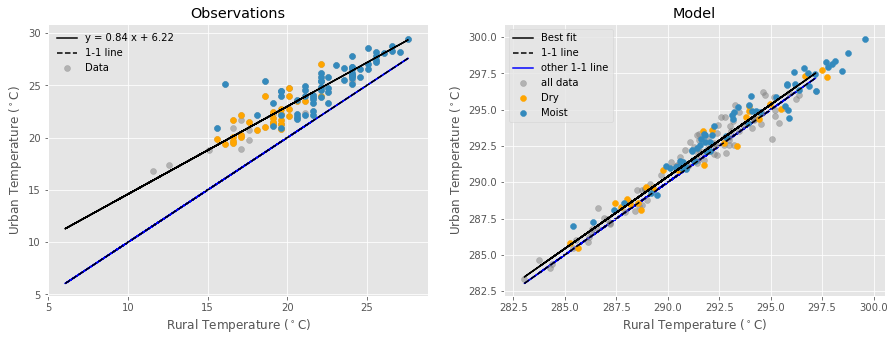

In [51]:
dry_temp = tempDF[rural][syn[syn <=3].index].dropna()
moist_temp = tempDF[rural][syn[syn > 3].index].dropna()

plt.figure(figsize = [15,5])
ax = plt.subplot(1,2,1)
hour = 6
easy_scatter_tls(tempDF[rural][tempDF.index.hour ==hour ] , tempDF[urban][tempDF.index.hour ==hour ],
             'Observations', 
             'Rural Temperature ($^\circ $C)', 'Urban Temperature ($^\circ $C)')
plt.plot(tempDF[rural][tempDF.index.hour ==hour ], tempDF[rural][tempDF.index.hour ==hour ], color = 'blue', zorder =0)
# plot dry 
plt.scatter(tempDF[rural].loc[syn[syn <=3].index + pd.Timedelta('06:00:00')], 
           tempDF[urban].loc[syn[syn <=3].index + pd.Timedelta('06:00:00')], color = 'orange')
# plot moist
plt.scatter(tempDF[rural].loc[syn[syn >3].index + pd.Timedelta('06:00:00')], 
          tempDF[urban].loc[syn[syn >3].index + pd.Timedelta('06:00:00')], color = u'#348ABD')

#plt.legend(['Linear Fit', 'x=y', 'obs.'])
ax=plt.subplot(1,2,2)
easy_scatter_tls(ruralDF[ruralDF.index.hour ==6 ]['T2'],
             urbanDF[urbanDF.index.hour ==6 ]['T2'], 'Model', 
             'Rural Temperature ($^\circ $C)', 'Urban Temperature ($^\circ $C)')
plt.plot(ruralDF[ruralDF.index.hour ==6 ]['T2'],ruralDF[ruralDF.index.hour ==6 ]['T2'], 'blue', zorder = 0)
plt.legend(['Linear Fit', 'x=y', 'obs.'])

# plot dry
plt.scatter(ruralDF.loc[syn[syn<=3].index]['T2'].dropna(),
           urbanDF.loc[syn[syn<=3].index]['T2'].dropna(), 
            color = 'orange')
#plot moist
plt.scatter(ruralDF.loc[syn[syn>3].index]['T2'].dropna(),
           urbanDF.loc[syn[syn>3].index]['T2'].dropna(), 
            color = u'#348ABD')
plt.legend(['Best fit', '1-1 line', 'other 1-1 line', 'all data', 'Dry', 'Moist'], loc = 2)

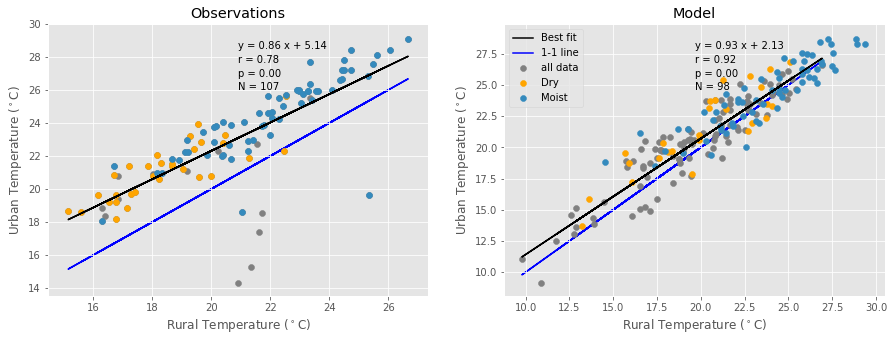

In [242]:
#This differs by weather type, and on moist days $\Delta T$ is smaller than on dry days. 
# observations
dry_temp = tempDF[rural][syn[syn <=3].index].dropna()
moist_temp = tempDF[rural][syn[syn > 3].index].dropna()

plt.figure(figsize = [15,5])
ax = plt.subplot(1,2,1)
hour = 6
easy_scatter(tempDF[rural][tempDF.index.hour ==hour ] , tempDF[urban][tempDF.index.hour ==hour ],
             'Observations', 
             'Rural Temperature ($^\circ $C)', 'Urban Temperature ($^\circ $C)')
plt.plot(tempDF[rural][tempDF.index.hour ==hour ], tempDF[rural][tempDF.index.hour ==hour ], color = 'blue', zorder =0)
# plot dry 
plt.scatter(tempDF[rural].loc[syn[syn <=3].index + pd.Timedelta('06:00:00')], 
           tempDF[urban].loc[syn[syn <=3].index + pd.Timedelta('06:00:00')], color = 'orange')
# plot moist
plt.scatter(tempDF[rural].loc[syn[syn >3].index + pd.Timedelta('06:00:00')], 
          tempDF[urban].loc[syn[syn >3].index + pd.Timedelta('06:00:00')], color = u'#348ABD')

#plt.legend(['Linear Fit', 'x=y', 'obs.'])
ax=plt.subplot(1,2,2)
easy_scatter(ruralDF[ruralDF.index.hour ==6 ]['T2'],
             urbanDF[urbanDF.index.hour ==6 ]['T2'], 'Model', 
             'Rural Temperature ($^\circ $C)', 'Urban Temperature ($^\circ $C)')
plt.plot(ruralDF[ruralDF.index.hour ==6 ]['T2'],ruralDF[ruralDF.index.hour ==6 ]['T2'], 'blue', zorder = 0)
plt.legend(['Linear Fit', 'x=y', 'obs.'])

# plot dry
plt.scatter(ruralDF.loc[syn[syn<=3].index]['T2'].dropna(),
           urbanDF.loc[syn[syn<=3].index]['T2'].dropna(), 
            color = 'orange')
#plot moist
plt.scatter(ruralDF.loc[syn[syn>3].index]['T2'].dropna(),
           urbanDF.loc[syn[syn>3].index]['T2'].dropna(), 
            color = u'#348ABD')
plt.legend(['Best fit', '1-1 line',  'all data', 'Dry', 'Moist'], loc = 2)
plt.savefig('plots/agu/fig2.pdf')

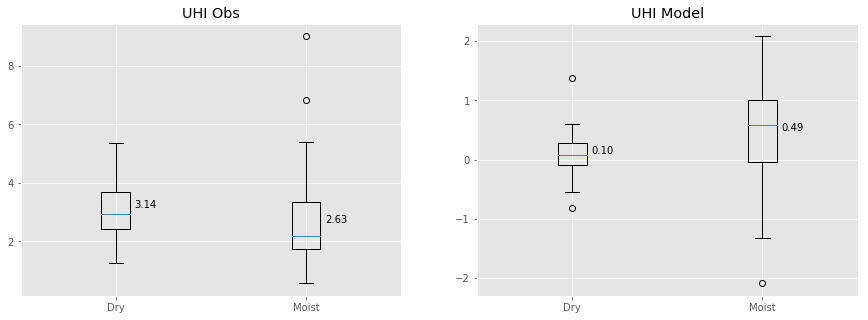

In [53]:
plt.figure(figsize = [15,5])
ax = plt.subplot(1,2,1)
UHI = (tempDF[urban][tempDF.index.hour ==6 ] - tempDF[rural][tempDF.index.hour ==6 ]).resample('D').mean()
dry_UHI = UHI[syn[syn <=3].index].dropna()
moist_UHI = UHI[syn[syn > 3].index].dropna()
data = [dry_UHI.values, 
        moist_UHI.values]
plot_handle = ax.boxplot(data)
ax.set_xticklabels(['Dry', 'Moist'])
plt.text(1.1, dry_UHI.mean(), '%2.2f'%dry_UHI.mean())
plt.text(2.1, moist_UHI.mean(), '%2.2f'%moist_UHI.mean())
ax.set_title('UHI Obs')

ax = plt.subplot(1,2,2)
UHI = urbanDF[urbanDF.index.hour ==6 ]['T2'].subtract(ruralDF[ruralDF.index.hour ==6 ]['T2']).resample('D').mean()
dry_UHI = UHI[syn[syn <=3].index].dropna()
moist_UHI = UHI[syn[syn > 3].index].dropna()
data = [dry_UHI.values, 
        moist_UHI.values]
plot_handle = ax.boxplot(data)
ax.set_xticklabels(['Dry', 'Moist'])
plt.text(1.1, dry_UHI.mean(), '%2.2f'%dry_UHI.mean())
plt.text(2.1, moist_UHI.mean(), '%2.2f'%moist_UHI.mean())
ax.set_title('UHI Model')


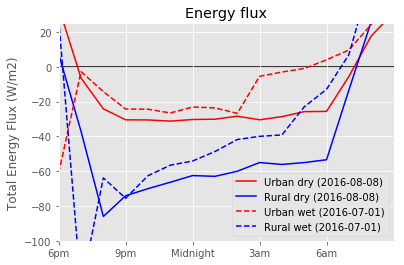

In [188]:
#The total energy flux on wet days is similar in urban and rural areas, while dissimilar on dry days. 
dry_day = '2016-08-08'
wet_day = '2016-07-01'

ax = plt.subplot(1,1,1) 
x = np.arange(0,30,1)
# net radiation (incoming minus outgoing) + sensible heat + ground flux (residual heat) + latent heat 
# currently missing : advection (vertical, horizontal), diffusion 
ax.plot(x, urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['r_net']].sum(axis=1).add(urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['LH', 'HFX']].multiply(-1).sum(axis=1)), color = 'r')
ax.plot(x,ruralDF.loc['2016-08-07 18:00:00': '2016-08-08'][['r_net']].sum(axis=1).add(ruralDF.loc['2016-08-07 18:00:00': '2016-08-08'][['LH', 'HFX']].multiply(-1).sum(axis=1)), color = 'blue')
ax.set_title('Dry day')
# ax.set_ylabel('Energy sum')
ax.plot(x, urbanDF.loc['2016-06-30 18:00:00': '2016-07-01'][['r_net', ]].sum(axis=1).add(urbanDF.loc['2016-06-30 18:00:00': '2016-07-01'][['LH', 'HFX']].multiply(-1).sum(axis=1)).values, color = 'r', linestyle = '--')
ax.plot(x, ruralDF.loc['2016-06-30 18:00:00': '2016-07-01'][['r_net']].sum(axis=1).add(ruralDF.loc['2016-06-30 18:00:00': '2016-07-01'][['LH', 'HFX']].multiply(-1).sum(axis=1)).values, color = 'blue', linestyle = '--')
ax.axhline(0, color = 'k', zorder = 0)
ax.set_xlim([0,15])
plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
ax.set_ylim([-100,25])
ax.set_ylabel('Total Energy Flux (W/m2)')
ax.set_title('Energy flux')
plt.legend(['Urban dry (%s)'%dry_day, 'Rural dry (%s)'%dry_day,
            #'Urban dry (%s)'%dry_day, 'Rural dry (%s)'%dry_day, 
            'Urban wet (%s)'%wet_day, 'Rural wet (%s)'%wet_day])
plt.savefig('plots/agu/fig3.pdf')

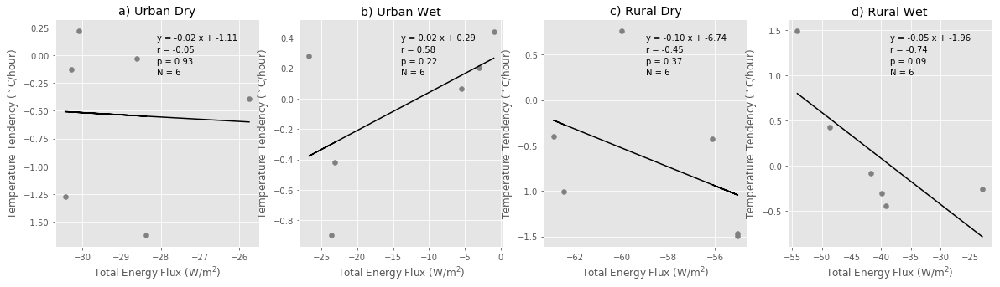

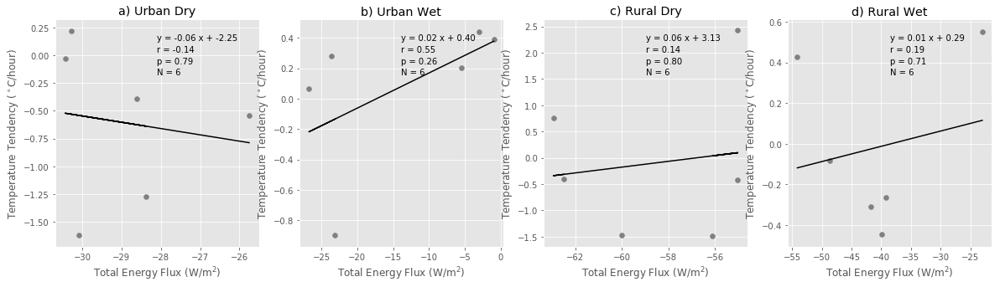

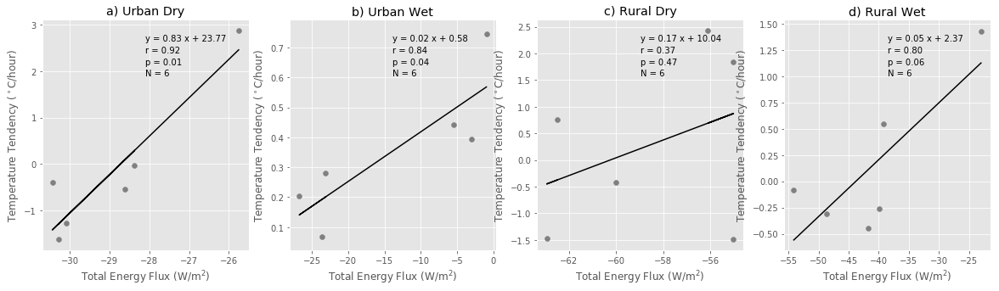

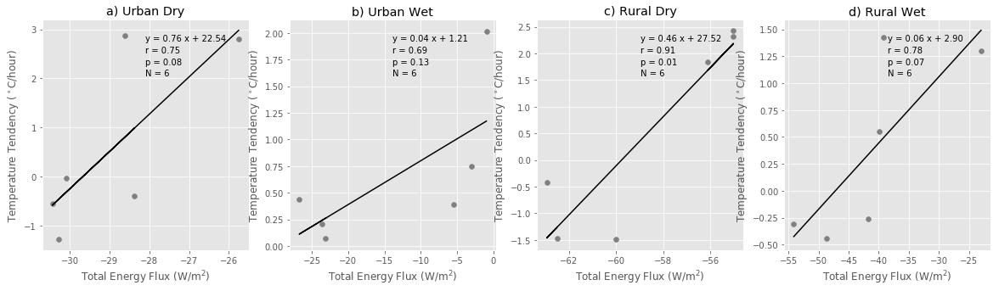

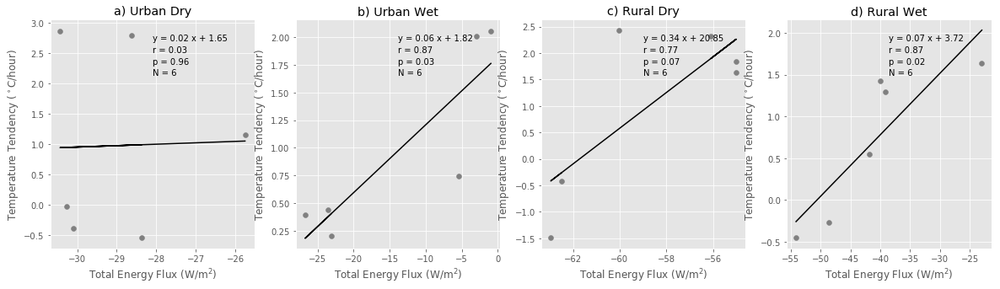

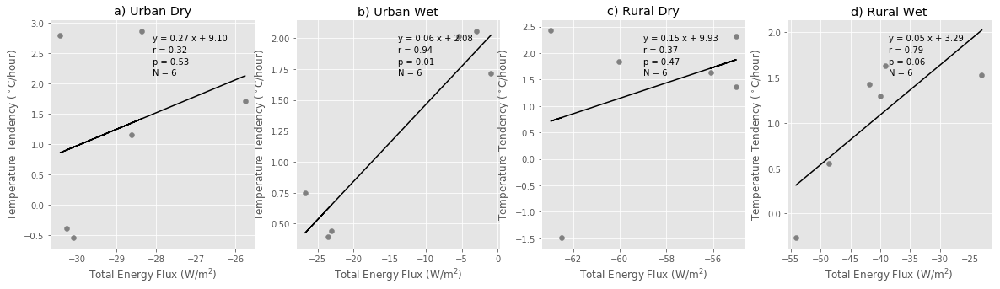

In [190]:
i = 1
for i in range(0,6): 
    plt.figure(figsize = [20,5])
    ax = plt.subplot(1,4,1)
    a = urbanDF[dry_day][['r_net']].sum(axis=1).add(urbanDF[dry_day][['LH', 'HFX']].multiply(-1).sum(axis=1)).values
    b = urbanDF[dry_day]['T2'].values[1:] - urbanDF[dry_day]['T2'].values[:-1] 
    easy_scatter(a[0:6], b[i:i+6], 'a) Urban Dry', 
                'Total Energy Flux (W/m$^2$)', 'Temperature Tendency ($^\circ$C/hour)')

    ax = plt.subplot(1,4,2)
    a = urbanDF[wet_day][['r_net']].sum(axis=1).add(urbanDF[wet_day][['LH', 'HFX']].multiply(-1).sum(axis=1)).values
    b = urbanDF[wet_day]['T2'].values[1:] - urbanDF[wet_day]['T2'].values[:-1] 
    easy_scatter(a[0:6], b[i:i+6], 'b) Urban Wet', 
                'Total Energy Flux (W/m$^2$)', 'Temperature Tendency ($^\circ$C/hour)')

    ax = plt.subplot(1,4,3)
    a = ruralDF[dry_day][['r_net']].sum(axis=1).add(ruralDF[dry_day][['LH', 'HFX']].multiply(-1).sum(axis=1)).values
    b = ruralDF[dry_day]['T2'].values[1:] - ruralDF[dry_day]['T2'].values[:-1] 
    easy_scatter(a[0:6], b[i:i+6], 'c) Rural Dry', 
                'Total Energy Flux (W/m$^2$)', 'Temperature Tendency ($^\circ$C/hour)')
    ax = plt.subplot(1,4,4)
    a = ruralDF[wet_day][['r_net']].sum(axis=1).add(ruralDF[wet_day][['LH', 'HFX']].multiply(-1).sum(axis=1)).values
    b = ruralDF[wet_day]['T2'].values[1:] - ruralDF[wet_day]['T2'].values[:-1] 
    easy_scatter(a[0:6], b[i:i+6], 'd) Rural Wet', 
                'Total Energy Flux (W/m$^2$)', 'Temperature Tendency ($^\circ$C/hour)')

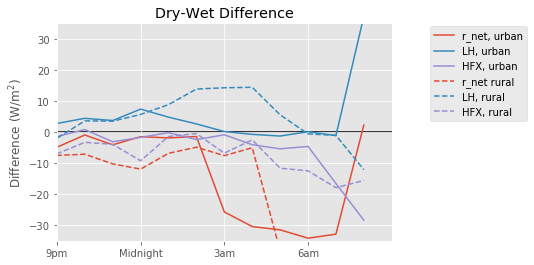

In [231]:
#The change in energy flux is driven by changes in net radiation and sensible (dry) heat flux. 
ax = plt.subplot(1,1,1)
for var in ['r_net', 'LH', 'HFX']: 
    diff = urbanDF.loc['2016-08-07 18:00:00': '2016-08-08 8:00:00'][var].values - urbanDF.loc['2016-06-30 18:00:00': '2016-07-01 8:00:00'][var].values
    plt.plot(diff)
i =0
for var in ['r_net', 'LH', 'HFX']: 
    diff = ruralDF.loc['2016-08-07 18:00:00': '2016-08-08 8:00:00'][var].values - ruralDF.loc['2016-06-30 18:00:00': '2016-07-01 8:00:00'][var].values
    plt.plot(diff, linestyle = '--', color = plt.rcParams['axes.prop_cycle'].by_key()['color'][i])
    i = i+1

plt.axhline(0, color = 'k', zorder = 0)
h = plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
ax.set_xlim([3,15])
plt.ylim([-35,35])
ax.set_ylabel('Difference (W/m$^2$)')
ax.set_title('Dry-Wet Difference')
plt.legend(['r_net, urban', 'LH, urban', 'HFX, urban', 'r_net rural', 'LH, rural', 'HFX, rural'], bbox_to_anchor=(1.1, 1.01))
plt.savefig('plots/agu/fig5.pdf')

In [44]:
# These findings hold for composites all dry and all wet days. The difference is statistically significant. 
ind = np.linspace(1,15, num=15)
varss = ['r_net', 'net_lw', 'HFX', 'LH', 'GRDFLX', 'T2']
dry_days = (urbanDF.loc[syn[syn<=3].index]['T2']- ruralDF.loc[syn[syn<=3].index]['T2']).dropna().sort_values(ascending = False).index
wet_days = (urbanDF.loc[syn[syn>3].index]['T2']-ruralDF.loc[syn[syn>3].index]['T2'] ).dropna().sort_values(ascending = True)[9:].index

X = 10
arr = []
arr2 = []
for day in dry_days[0:X] : 
    arr.append(urbanDF[pd.to_datetime(day) - pd.Timedelta('6:00:00'):pd.to_datetime(day)+ pd.Timedelta('8:00:00')][varss].values)
    arr2.append(ruralDF[pd.to_datetime(day) - pd.Timedelta('6:00:00'):pd.to_datetime(day)+ pd.Timedelta('8:00:00')][varss].values)

urban_dryDF = pd.DataFrame(np.mean(arr, axis=0), columns=varss, index = ind)
rural_dryDF = pd.DataFrame(np.mean(arr2, axis=0), columns=varss, index = ind)

arr = []
arr2 = []
for day in wet_days[0:X] : 
    arr.append(urbanDF[pd.to_datetime(day) - pd.Timedelta('6:00:00'):pd.to_datetime(day)+ pd.Timedelta('8:00:00')][varss].values)
    arr2.append(ruralDF[pd.to_datetime(day) - pd.Timedelta('6:00:00'):pd.to_datetime(day)+ pd.Timedelta('8:00:00')][varss].values)
urban_wetDF = pd.DataFrame(np.mean(arr, axis=0), columns=varss, index = ind)
rural_wetDF = pd.DataFrame(np.mean(arr2, axis=0), columns=varss, index = ind)

In [ ]:
#The changes in energy flux are consistent with more surface energy in rural areas. 


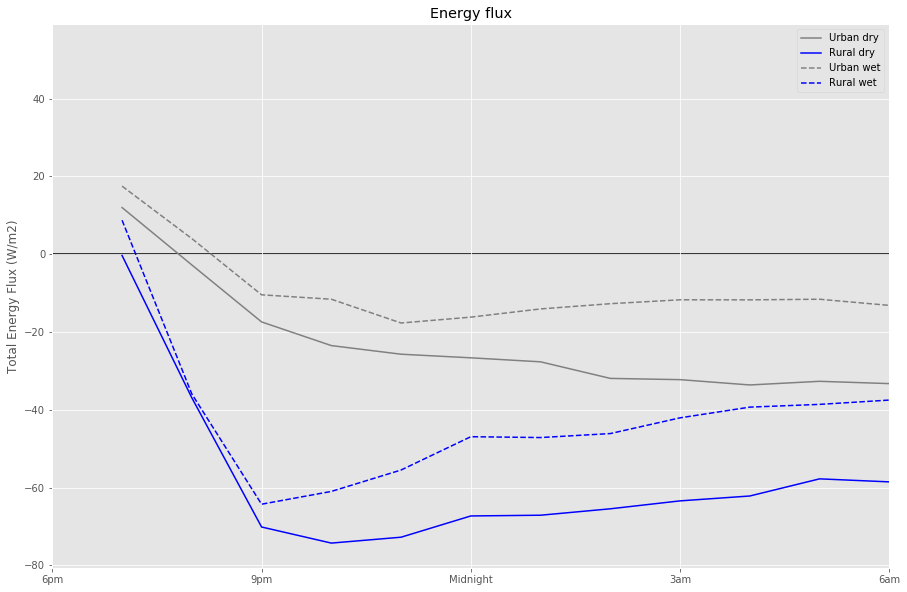

In [240]:
# These findings hold for composites all dry and all wet days. The difference is statistically significant. 
ind = np.linspace(1,15, num=15)
varss = ['r_net', 'net_lw', 'HFX', 'LH', 'GRDFLX', 'T2']
dry_days = (urbanDF.loc[syn[syn<=3].index]['T2']- ruralDF.loc[syn[syn<=3].index]['T2']).dropna().sort_values(ascending = False).index
wet_days = (urbanDF.loc[syn[syn>3].index]['T2']-ruralDF.loc[syn[syn>3].index]['T2'] ).dropna().sort_values(ascending = True)[9:].index

X = 10
arr = []
arr2 = []
for day in dry_days[0:X] : 
    arr.append(urbanDF[pd.to_datetime(day) - pd.Timedelta('6:00:00'):pd.to_datetime(day)+ pd.Timedelta('8:00:00')][varss].values)
    arr2.append(ruralDF[pd.to_datetime(day) - pd.Timedelta('6:00:00'):pd.to_datetime(day)+ pd.Timedelta('8:00:00')][varss].values)

urban_dryDF = pd.DataFrame(np.mean(arr, axis=0), columns=varss, index = ind)
rural_dryDF = pd.DataFrame(np.mean(arr2, axis=0), columns=varss, index = ind)

arr = []
arr2 = []
for day in wet_days[0:X] : 
    arr.append(urbanDF[pd.to_datetime(day) - pd.Timedelta('6:00:00'):pd.to_datetime(day)+ pd.Timedelta('8:00:00')][varss].values)
    arr2.append(ruralDF[pd.to_datetime(day) - pd.Timedelta('6:00:00'):pd.to_datetime(day)+ pd.Timedelta('8:00:00')][varss].values)
urban_wetDF = pd.DataFrame(np.mean(arr, axis=0), columns=varss, index = ind)
rural_wetDF = pd.DataFrame(np.mean(arr2, axis=0), columns=varss, index = ind)

plt.figure(figsize = [15,10])
ax = plt.subplot(1,1,1) 
# net radiation (incoming minus outgoing) + sensible heat + ground flux (residual heat) + latent heat 
# currently missing : advection (vertical, horizontal), diffusion 
urban_dryDF['r_net'].add(urban_dryDF[['LH', 'HFX']].multiply(-1).sum(axis=1)).plot(color = 'gray')
rural_dryDF['r_net'].add(rural_dryDF[['LH', 'HFX']].multiply(-1).sum(axis=1)).plot(color = 'blue')
urban_wetDF['r_net'].add(urban_wetDF[['LH', 'HFX']].multiply(-1).sum(axis=1)).plot(color = 'gray', linestyle = '--')
rural_wetDF['r_net'].add(rural_wetDF[['LH', 'HFX']].multiply(-1).sum(axis=1)).plot(color = 'blue', linestyle = '--')
ax.axhline(0, color = 'k', zorder = 0)
ax.set_xlim([0,10])
plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
#ax.set_ylim([-60,0])
ax.set_ylabel('Total Energy Flux (W/m2)')
ax.set_title('Energy flux')
plt.legend(['Urban dry', 'Rural dry',
            'Urban wet', 'Rural wet'])
plt.savefig('plots/agu/fig6.pdf')

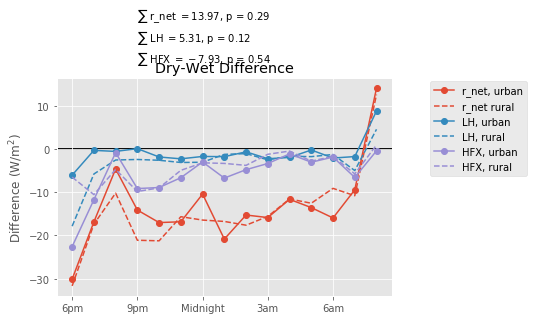

In [81]:
# The change in energy flux is driven by changes in net radiation and sensible (dry) heat flux. 
i =0
a = 3#3
b = 11#9
for var in ['r_net', 'LH' ,'HFX']: 
    diff1 = urban_dryDF[var].values - urban_wetDF[var].values
    plt.plot(diff1, '-o')
    diff2 = rural_dryDF[var].values - rural_wetDF[var].values
    plt.plot(diff2, linestyle = '--', color = plt.rcParams['axes.prop_cycle'].by_key()['color'][i])
    p = scipy.stats.ttest_ind(diff1[a:b], diff2[a:b])[1]
    plt.text(3, 30 + -5*i, '$\sum $ %s $= %2.2f$, p = %2.2f'%(var, (diff1-diff2)[a:b].sum(), p))
    i = i+1

plt.axhline(0, color = 'k', zorder = 0)
h = plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
plt.axhline(0, color ='k', zorder =0)
#ax.set_xlim([0,15])
#ax.set_ylim([-100,15])
plt.ylabel('Difference (W/m$^2$)')
plt.title('Dry-Wet Difference')
plt.legend(['r_net, urban', 'r_net rural',
            'LH, urban', 'LH, rural', 
            'HFX, urban', 'HFX, rural'], bbox_to_anchor=(1.1, 1.01))
plt.savefig('plots/agu/fig7.pdf', bbox_inches='tight')

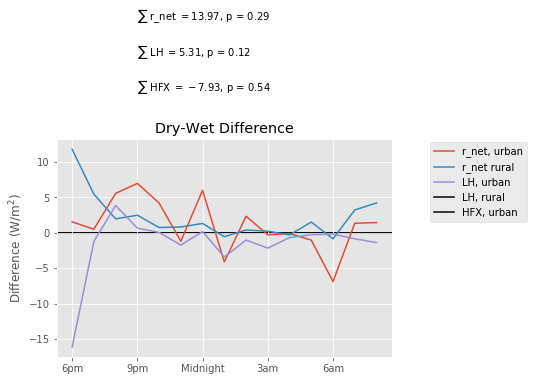

In [78]:
i =0
a = 3#3
b = 11#9
for var in ['r_net', 'LH' ,'HFX']: 
    diff1 = urban_dryDF[var].values - urban_wetDF[var].values
    #plt.plot(diff1)
    diff2 = rural_dryDF[var].values - rural_wetDF[var].values
    #plt.plot(diff2, linestyle = '--', color = plt.rcParams['axes.prop_cycle'].by_key()['color'][i])
    plt.plot(diff1-diff2)
    p = scipy.stats.ttest_ind(diff1[a:b], diff2[a:b])[1]
    plt.text(3, 30 + -5*i, '$\sum $ %s $= %2.2f$, p = %2.2f'%(var, (diff1-diff2)[a:b].sum(), p))
    i = i+1

plt.axhline(0, color = 'k', zorder = 0)
h = plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
plt.axhline(0, color ='k', zorder =0)
#ax.set_xlim([0,15])
#ax.set_ylim([-100,15])
plt.ylabel('Difference (W/m$^2$)')
plt.title('Dry-Wet Difference')
plt.legend(['r_net, urban', 'r_net rural',
            'LH, urban', 'LH, rural', 
            'HFX, urban', 'HFX, rural'], bbox_to_anchor=(1.1, 1.01))
plt.savefig('plots/agu/fig7.pdf', bbox_inches='tight')

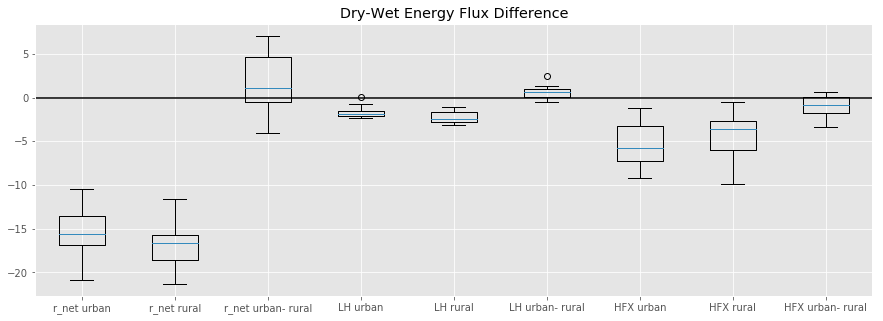

In [64]:
# boxplots instead
plt.figure(figsize = [15,5])
i =0
a = 3# 9pm 3
b = 11# 5am 9
data = []
labels = []
for var in ['r_net', 'LH' ,'HFX']: 
    diff1 = urban_dryDF[var].values - urban_wetDF[var].values
    diff2 = rural_dryDF[var].values - rural_wetDF[var].values
    data.append(diff1[a:b])
    labels.append('%s urban'%var)
    data.append(diff2[a:b])
    labels.append('%s rural'%var)
#     data.append(diff1[a:b]-diff2[a:b])
#     labels.append('%s urban- rural'%var)

    i =i+1
lines = plt.boxplot(data)
plt.xticks([1,2,3,4,5,6,7,8,9],labels)
plt.axhline(0, color = 'k')
plt.title('Dry-Wet Energy Flux Difference')


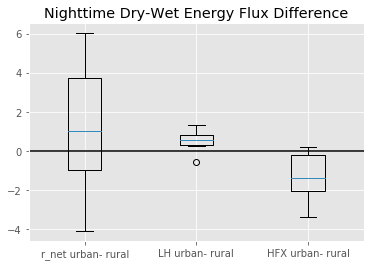

In [68]:
data = []
labels = []
i =0
a = 4# 9pm 3
b = 10# 5am 9
for var in ['r_net', 'LH' ,'HFX']: 
    diff1 = urban_dryDF[var].values - urban_wetDF[var].values
    diff2 = rural_dryDF[var].values - rural_wetDF[var].values
    data.append(diff1[a:b]-diff2[a:b])
    labels.append('%s urban- rural'%var)
lines = plt.boxplot(data)
plt.xticks([1,2,3],labels)
plt.axhline(0, color = 'k')
plt.title('Nighttime Dry-Wet Energy Flux Difference')

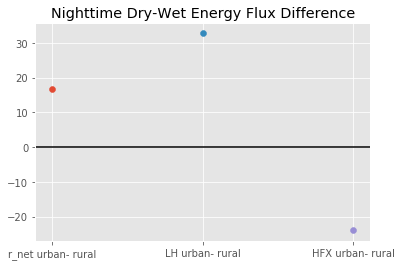

In [75]:
data = []
labels = []
i =0
a = 4# 9pm 3
b = 10# 5am 9
for var in ['r_net', 'LH' ,'HFX']: 
    diff1 = np.sum(urban_dryDF[var].values - urban_wetDF[var].values)
    diff2 = np.sum(rural_dryDF[var].values - rural_wetDF[var].values)
    plt.scatter(i+1, diff1-diff2)
    i = i+1
    labels.append('%s urban- rural'%var)
#lines = plt.boxplot(data)
plt.xticks([1,2,3],labels)
plt.axhline(0, color = 'k')
plt.title('Nighttime Dry-Wet Energy Flux Difference')

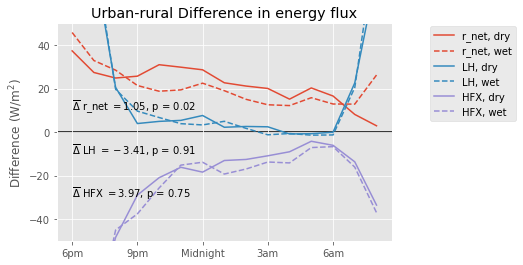

In [232]:
i =0
a = 2
b = 9
for var in ['r_net', 'LH' ,'HFX']: 
    diff1 = urban_dryDF[var].values - rural_dryDF[var].values
    plt.plot(diff1)
    diff2 = urban_wetDF[var].values - rural_wetDF[var].values
    plt.plot(diff2, linestyle = '--', color = plt.rcParams['axes.prop_cycle'].by_key()['color'][i])
    p = scipy.stats.ttest_ind(diff1[a:b], diff2[a:b])[1]
    plt.text(0, 10 + -20*i, '$\overline{\Delta} $ %s $= %2.2f$, p = %2.2f'%(var, (diff1-diff2).mean(), p))
    i = i+1


ax.axhline(0, color = 'k', zorder = 0)
h = plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
ax.set_xlim([0,15])
plt.axhline(0, color = 'k', zorder = 0)
plt.ylim([-50,50])
plt.ylabel('Difference (W/m$^2$)')
plt.title('Urban-rural Difference in energy flux')
plt.legend(['r_net, dry', 'r_net, wet',
            'LH, dry', 'LH, wet', 
            'HFX, dry', 'HFX, wet'], bbox_to_anchor=(1.1, 1.01))

In [ ]:
# The changes in energy flux are consistent with more surface energy in rural areas. 


In [279]:
# see what runs are ready 
fpath = '/Users/ascott47/mountpoint/wrf/out/'
dom = 'd03'
dirs = os.listdir(fpath)
date = '2016-05-27' 
for exp in dirs: 
    print(exp)
    files = list(np.sort(glob.glob(fpath+'%s/%s/wrfout_*'%(exp, dom))))[0:72]#[2150-14-24: 2150-14+120]
    print(len(files))

UCM2D
0
BEM2D+SST
0
BEM2D
0
UCM
0
BEM+SST
0
BEM
0
UCM2D+SST
0
UCM+SST
0


In [280]:
fpath+'%s/%s/wrfout_*'%(exp, dom)

'/Users/ascott47/mountpoint/wrf/out/UCM+SST/d03/wrfout_*'

In [603]:
t1 = xr.open_dataset(fpath+'%s/%s/wrfout_d01_%s_10:00:00'%(exp, dom, str(day)[0:10]))

In [610]:
test = t1.var

In [615]:
test

<bound method Dataset.var of <xarray.Dataset>
Dimensions:                (Time: 1, bottom_top: 112, bottom_top_stag: 113, soil_layers_stag: 4, south_north: 150, south_north_stag: 151, west_east: 150, west_east_stag: 151)
Coordinates:
    XLAT                   (Time, south_north, west_east) float32 36.8249 ...
    XLONG                  (Time, south_north, west_east) float32 -78.6853 ...
    XTIME                  (Time) datetime64[ns] 2016-08-27T10:00:00
    XLAT_U                 (Time, south_north, west_east_stag) float32 36.8244 ...
    XLONG_U                (Time, south_north, west_east_stag) float32 -78.7026 ...
    XLAT_V                 (Time, south_north_stag, west_east) float32 36.8111 ...
    XLONG_V                (Time, south_north_stag, west_east) float32 -78.6848 ...
Dimensions without coordinates: Time, bottom_top, bottom_top_stag, soil_layers_stag, south_north, south_north_stag, west_east, west_east_stag
Data variables:
    Times                  (Time) |S19 '2016-08-

In [931]:
ls /Users/ascott47/mountpoint/wrf/run/UCM+SST

CAM_ABS_DATA                      rsl.out.0156
CAM_AEROPT_DATA                   rsl.out.0157
CAMtr_volume_mixing_ratio.A1B     rsl.out.0158
CAMtr_volume_mixing_ratio.A2      rsl.out.0159
CAMtr_volume_mixing_ratio.RCP4.5  rsl.out.0160
CAMtr_volume_mixing_ratio.RCP6    rsl.out.0161
CAMtr_volume_mixing_ratio.RCP8.5  rsl.out.0162
CCN_ACTIVATE.BIN                  rsl.out.0163
CLM_ALB_ICE_DFS_DATA              rsl.out.0164
CLM_ALB_ICE_DRC_DATA              rsl.out.0165
CLM_ASM_ICE_DFS_DATA              rsl.out.0166
CLM_ASM_ICE_DRC_DATA              rsl.out.0167
CLM_DRDSDT0_DATA                  rsl.out.0168
CLM_EXT_ICE_DFS_DATA              rsl.out.0169
CLM_EXT_ICE_DRC_DATA              rsl.out.0170
CLM_KAPPA_DATA                    rsl.out.0171
CLM_TAU_DATA                      rsl.out.0172
ETAMPNEW_DATA                     rsl.out.0173
ETAMPNEW_DATA.expanded_rain*      rsl.out.0174
ETAMPNEW_DATA.expanded_rain_DBL   rsl.out.0175
ETAMPNEW_DATA_DBL                 rsl.out.0176
GENPARM.TBL  

### Compare energy budget differences for all the dry days, wet days using higher resolution simulations

In [221]:
ls /Users/ascott47/mountpoint/wrf/out/BEM+SST/d01

logs/


In [295]:
fpath = '/Users/ascott47/mountpoint/wrf/out/'
dom = 'd02'
dirs = os.listdir(fpath)

In [296]:
dirs

['UCM2D',
 'BEM2D+SST',
 'BEM2D',
 'UCM',
 'BEM+SST',
 'BEM',
 'UCM2D+SST',
 'UCM+SST']

In [ ]:
fpath = '/Users/ascott47/mountpoint/wrf/out/'
dom = 'd02'
dirs = os.listdir(fpath)
date = '2016-05-27' 
for exp in dirs: 
    print(exp)
    files = list(np.sort(glob.glob(fpath+'%s/%s/wrfout_*'%(exp, dom))))[0:72]#[2150-14-24: 2150-14+120]


## Compare the energy budget and temperature tendency for one day

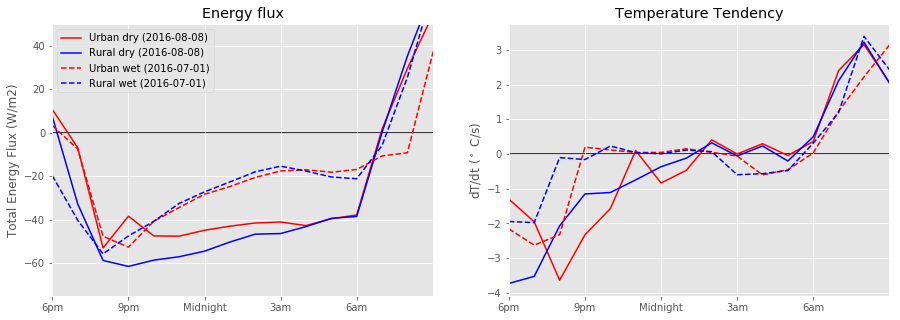

In [670]:
plt.figure(figsize = [15,5])
# temperature tendencies 
ax = plt.subplot(1,2,2)
ax.plot(urbanDF.loc['2016-08-07 18:00:00': '2016-08-08']['T2'].values[1:] - urbanDF.loc['2016-08-07 18:00:00': '2016-08-08']['T2'].values[:-1] , color = 'r')
ax.plot(ruralDF.loc['2016-08-07 18:00:00': '2016-08-08']['T2'].values[1:] - ruralDF.loc['2016-08-07 18:00:00': '2016-08-08']['T2'].values[:-1] , color = 'blue')
ax.plot(urbanDF.loc['2016-06-30 18:00:00': '2016-07-01']['T2'].values[1:] - urbanDF.loc['2016-06-30 18:00:00': '2016-07-01']['T2'].values[:-1], color = 'r', linestyle = '--')
ax.plot(ruralDF.loc['2016-06-30 18:00:00': '2016-07-01']['T2'].values[1:] - ruralDF.loc['2016-06-30 18:00:00': '2016-07-01']['T2'].values[:-1], color = 'blue', linestyle = '--')
#plt.legend(['Urban dry (%s)'%dry_day, 'Rural dry', 'Urban wet (%s)'%wet_day, 'Rural wet'])
ax.set_title('Temperature Tendency')
ax.set_ylabel('dT/dt ($^\circ$ C/s)')
ax.axhline(0, color = 'k', zorder = 0)
#ax.set_xlim([0,7])
ax.set_xlim([0,15])
plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])

# total energy sum : r_net + HFX + grdflux + LH
ax = plt.subplot(1,2,1) 
x = np.arange(0,30,1)
# net radiation (incoming minus outgoing) + sensible heat + ground flux (residual heat) + latent heat 
# currently missing : advection (vertical, horizontal), diffusion 
ax.plot(x, urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['r_net']].sum(axis=1).add(urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['LH', 'HFX']].multiply(-1).sum(axis=1)), color = 'r')
ax.plot(x,ruralDF.loc['2016-08-07 18:00:00': '2016-08-08'][['r_net']].sum(axis=1).add(ruralDF.loc['2016-08-07 18:00:00': '2016-08-08'][['LH', 'HFX']].multiply(-1).sum(axis=1)), color = 'blue')
ax.set_title('Dry day')
# ax.set_ylabel('Energy sum')
ax.plot(x, urbanDF.loc['2016-06-30 18:00:00': '2016-07-01'][['r_net', ]].sum(axis=1).add(urbanDF.loc['2016-06-30 18:00:00': '2016-07-01'][['LH', 'HFX']].multiply(-1).sum(axis=1)).values, color = 'r', linestyle = '--')
ax.plot(x, ruralDF.loc['2016-06-30 18:00:00': '2016-07-01'][['r_net']].sum(axis=1).add(ruralDF.loc['2016-06-30 18:00:00': '2016-07-01'][['LH', 'HFX']].multiply(-1).sum(axis=1)).values, color = 'blue', linestyle = '--')
ax.axhline(0, color = 'k', zorder = 0)
ax.set_xlim([0,15])
plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
ax.set_ylim([-75,50])
ax.set_ylabel('Total Energy Flux (W/m2)')
ax.set_title('Energy flux')
plt.legend(['Urban dry (%s)'%dry_day, 'Rural dry (%s)'%dry_day,
            #'Urban dry (%s)'%dry_day, 'Rural dry (%s)'%dry_day, 
            'Urban wet (%s)'%wet_day, 'Rural wet (%s)'%wet_day])

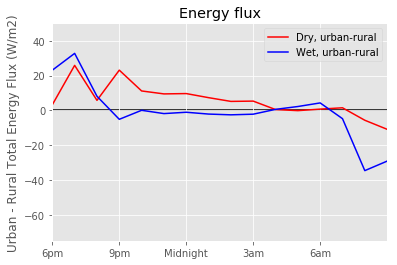

In [834]:
ax = plt.subplot(1,1,1) 
x = np.arange(0,30,1)
# net radiation (incoming minus outgoing) + sensible heat + ground flux (residual heat) + latent heat 
# currently missing : advection (vertical, horizontal), diffusion 

#wet, u-r diff
diff = urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['r_net']].sum(axis=1).add(urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['LH', 'HFX']].multiply(-1).sum(axis=1)).subtract(ruralDF.loc['2016-08-07 18:00:00': '2016-08-08'][['r_net']].sum(axis=1).add(ruralDF.loc['2016-08-07 18:00:00': '2016-08-08'][['LH', 'HFX']].multiply(-1).sum(axis=1)))
ax.plot(x, diff, color = 'r')

diff = urbanDF.loc['2016-06-30 18:00:00': '2016-07-01'][['r_net', ]].sum(axis=1).add(urbanDF.loc['2016-06-30 18:00:00': '2016-07-01'][['LH', 'HFX']].multiply(-1).sum(axis=1)).values - ruralDF.loc['2016-06-30 18:00:00': '2016-07-01'][['r_net']].sum(axis=1).add(ruralDF.loc['2016-06-30 18:00:00': '2016-07-01'][['LH', 'HFX']].multiply(-1).sum(axis=1)).values
ax.plot(x, diff, color = 'blue')

ax.axhline(0, color = 'k', zorder = 0)
ax.set_xlim([0,15])
plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
ax.set_ylim([-75,50])
ax.set_ylabel('Urban - Rural Total Energy Flux (W/m2)')
ax.set_title('Energy flux')
plt.legend(['Dry, urban-rural', 'Wet, urban-rural'])

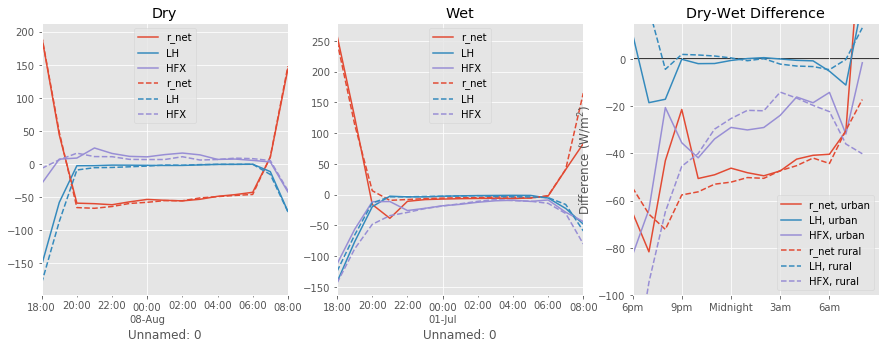

In [919]:
# now diagnose which energy flux is causing this difference
plt.figure(figsize = [15,5])
# dry day energy budget
ax = plt.subplot(1,3,1) 
# urban
urbanDF.loc['2016-08-07 18:00:00': '2016-08-08 8:00:00']['r_net'].plot(ax=ax, )
urbanDF.loc['2016-08-07 18:00:00': '2016-08-08 8:00:00'][['LH', 'HFX']].multiply(-1).plot(ax=ax)
# rural
ruralDF.loc['2016-08-07 18:00:00': '2016-08-08 8:00:00']['r_net'].plot(ax=ax, linestyle = '--', color = plt.rcParams['axes.prop_cycle'].by_key()['color'][0])
ruralDF.loc['2016-08-07 18:00:00': '2016-08-08 8:00:00'][['LH', 'HFX']].multiply(-1).plot(ax=ax, linestyle = '--',  color = plt.rcParams['axes.prop_cycle'].by_key()['color'][1:3])
ax.set_title('Dry')
plt.legend()
# wet day energy budget 
ax = plt.subplot(1,3,2) 
#urban
urbanDF.loc['2016-06-30 18:00:00': '2016-07-01 8:00:00']['r_net'].plot(ax=ax)
urbanDF.loc['2016-06-30 18:00:00': '2016-07-01 8:00:00'][['LH', 'HFX']].multiply(-1).plot(ax=ax)
# rural
ruralDF.loc['2016-06-30 18:00:00': '2016-07-01 8:00:00']['r_net'].plot(ax=ax, linestyle = '--', color = plt.rcParams['axes.prop_cycle'].by_key()['color'][0])
ruralDF.loc['2016-06-30 18:00:00': '2016-07-01 8:00:00'][['LH', 'HFX']].multiply(-1).plot(ax=ax, linestyle = '--', color = plt.rcParams['axes.prop_cycle'].by_key()['color'][1:3])
plt.legend()
ax.set_title('Wet')
ax = plt.subplot(1,3,3)
for var in ['r_net', 'LH', 'HFX']: 
    diff = urbanDF.loc['2016-08-07 18:00:00': '2016-08-08 8:00:00'][var].values - urbanDF.loc['2016-06-30 18:00:00': '2016-07-01 8:00:00'][var].values
    plt.plot(diff)
i =0
for var in ['r_net', 'LH', 'HFX']: 
    diff = ruralDF.loc['2016-08-07 18:00:00': '2016-08-08 8:00:00'][var].values - ruralDF.loc['2016-06-30 18:00:00': '2016-07-01 8:00:00'][var].values
    plt.plot(diff, linestyle = '--', color = plt.rcParams['axes.prop_cycle'].by_key()['color'][i])
    i = i+1

ax.axhline(0, color = 'k', zorder = 0)
h = plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
ax.set_xlim([0,15])
ax.set_ylim([-100,15])
ax.set_ylabel('Difference (W/m$^2$)')
ax.set_title('Dry-Wet Difference')
plt.legend(['r_net, urban', 'LH, urban', 'HFX, urban', 'r_net rural', 'LH, rural', 'HFX, rural'])

d-w < 0 implies d < w, so that negative dry minus wet differences mean that there is more energy flux on wet days. This is more the case in rural areas than urban ones. 

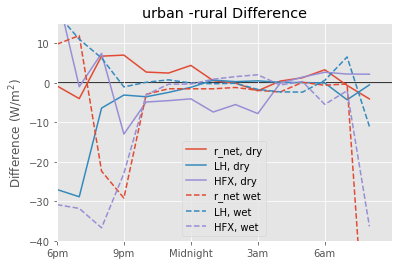

In [922]:
ax = plt.subplot(1,1,1)
for var in ['r_net', 'LH', 'HFX']: 
    diff = urbanDF.loc['2016-08-07 18:00:00': '2016-08-08 8:00:00'][var].values-ruralDF.loc['2016-08-07 18:00:00': '2016-08-08 8:00:00'][var].values
    plt.plot(diff)
i =0
for var in ['r_net', 'LH', 'HFX']: 
    diff =  urbanDF.loc['2016-06-30 18:00:00': '2016-07-01 8:00:00'][var].values - ruralDF.loc['2016-06-30 18:00:00': '2016-07-01 8:00:00'][var].values
    plt.plot(diff, linestyle = '--', color = plt.rcParams['axes.prop_cycle'].by_key()['color'][i])
    i = i+1

ax.axhline(0, color = 'k', zorder = 0)
h = plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
ax.set_xlim([0,15])
ax.set_ylim([-40,15])
ax.set_ylabel('Difference (W/m$^2$)')
ax.set_title('urban -rural Difference')
plt.legend(['r_net, dry', 'LH, dry', 'HFX, dry', 'r_net wet', 'LH, wet', 'HFX, wet'])

## Do this for multiple days

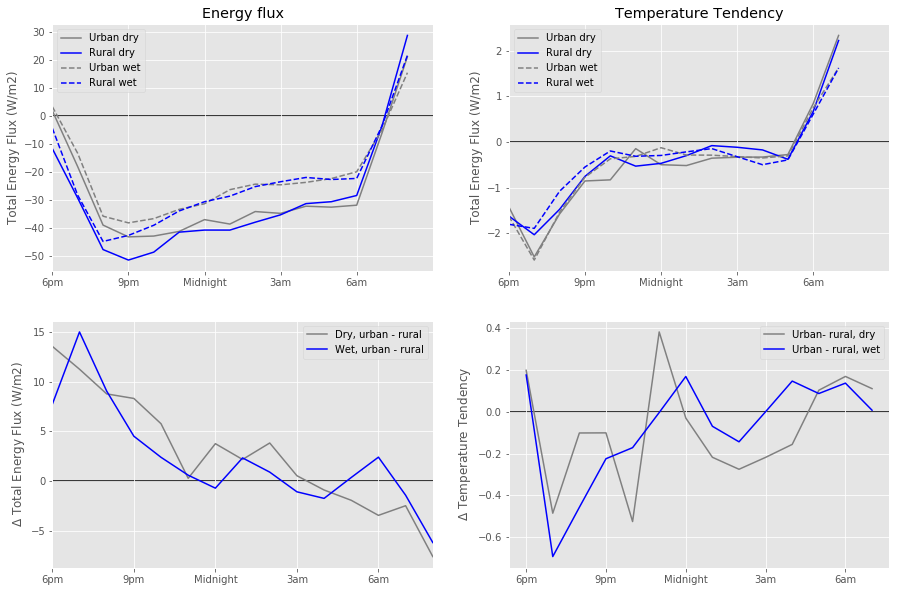

In [918]:
varss = ['r_net', 'net_lw', 'HFX', 'LH', 'GRDFLX', 'T2']
dry_days = (urbanDF.loc[syn[syn<=3].index]['T2']- ruralDF.loc[syn[syn<=3].index]['T2']).dropna().sort_values(ascending = False).index
wet_days = (urbanDF.loc[syn[syn>3].index]['T2']-ruralDF.loc[syn[syn>3].index]['T2'] ).dropna().sort_values(ascending = True)[9:].index

X = 10
arr = []
arr2 = []
for day in dry_days[0:X] : 
    arr.append(urbanDF[pd.to_datetime(day) - pd.Timedelta('6:00:00'):pd.to_datetime(day)+ pd.Timedelta('8:00:00')][varss].values)
    arr2.append(ruralDF[pd.to_datetime(day) - pd.Timedelta('6:00:00'):pd.to_datetime(day)+ pd.Timedelta('8:00:00')][varss].values)

urban_dryDF = pd.DataFrame(np.mean(arr, axis=0), columns=varss, index = ind)
rural_dryDF = pd.DataFrame(np.mean(arr2, axis=0), columns=varss, index = ind)

arr = []
arr2 = []
for day in wet_days[0:X] : 
    arr.append(urbanDF[pd.to_datetime(day) - pd.Timedelta('6:00:00'):pd.to_datetime(day)+ pd.Timedelta('8:00:00')][varss].values)
    arr2.append(ruralDF[pd.to_datetime(day) - pd.Timedelta('6:00:00'):pd.to_datetime(day)+ pd.Timedelta('8:00:00')][varss].values)
urban_wetDF = pd.DataFrame(np.mean(arr, axis=0), columns=varss, index = ind)
rural_wetDF = pd.DataFrame(np.mean(arr2, axis=0), columns=varss, index = ind)

plt.figure(figsize = [15,10])
ax = plt.subplot(2,2,1) 
# net radiation (incoming minus outgoing) + sensible heat + ground flux (residual heat) + latent heat 
# currently missing : advection (vertical, horizontal), diffusion 
urban_dryDF['r_net'].add(urban_dryDF[['LH', 'HFX']].multiply(-1).sum(axis=1)).plot(color = 'gray')
rural_dryDF['r_net'].add(rural_dryDF[['LH', 'HFX']].multiply(-1).sum(axis=1)).plot(color = 'blue')
urban_wetDF['r_net'].add(urban_wetDF[['LH', 'HFX']].multiply(-1).sum(axis=1)).plot(color = 'gray', linestyle = '--')
rural_wetDF['r_net'].add(rural_wetDF[['LH', 'HFX']].multiply(-1).sum(axis=1)).plot(color = 'blue', linestyle = '--')
ax.axhline(0, color = 'k', zorder = 0)
ax.set_xlim([0,15])
plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
# ax.set_ylim([-75,50])
ax.set_ylabel('Total Energy Flux (W/m2)')
ax.set_title('Energy flux')
plt.legend(['Urban dry', 'Rural dry',
            'Urban wet', 'Rural wet'])

# temperature tendencies 
ax = plt.subplot(2,2,2)
ax.plot(urban_dryDF['T2'].values[1:] - urban_dryDF['T2'].values[:-1] , color = 'gray')
ax.plot(rural_dryDF['T2'].values[1:] - rural_dryDF['T2'].values[:-1] , color = 'blue')
ax.plot(urban_wetDF['T2'].values[1:] - urban_wetDF['T2'].values[:-1] , color = 'gray', linestyle = '--')
ax.plot(rural_wetDF['T2'].values[1:] - rural_wetDF['T2'].values[:-1] , color = 'blue', linestyle = '--')
plt.legend(['Urban dry', 'Rural dry',
            'Urban wet', 'Rural wet'])
ax.set_title('Temperature Tendency')
ax.set_ylabel('dT/dt ($^\circ$ C/s)')
ax.axhline(0, color = 'k', zorder = 0)
#ax.set_xlim([0,7])
ax.set_xlim([0,15])
t = plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
ax.set_ylabel('Total Energy Flux (W/m2)')

# dry - wet difference in energy fluxes
ax = plt.subplot(2,2,3) 
#urban dry - urban wet 
urban_dryDF['r_net'].add(urban_dryDF[['LH', 'HFX']].multiply(-1).sum(axis=1)).subtract(rural_dryDF['r_net'].add(rural_dryDF[['LH', 'HFX']].multiply(-1).sum(axis=1))).plot(color = 'gray', ax = ax)
urban_wetDF['r_net'].add(urban_wetDF[['LH', 'HFX']].multiply(-1).sum(axis=1)).subtract(rural_wetDF['r_net'].add(rural_wetDF[['LH', 'HFX']].multiply(-1).sum(axis=1))).plot(color = 'blue', ax = ax)
plt.legend(['Dry, urban - rural', 'Wet, urban - rural'])
t = plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
ax.axhline(0, color = 'k', zorder = 0)
ax.set_ylabel('$\Delta$ Total Energy Flux (W/m2)')

ax = plt.subplot(2,2,4)
diff = (urban_dryDF['T2'].values[1:] - urban_dryDF['T2'].values[:-1]) - (rural_dryDF['T2'].values[1:] - rural_dryDF['T2'].values[:-1])
ax.plot(diff, color = 'gray')
diff = (urban_wetDF['T2'].values[1:] - urban_wetDF['T2'].values[:-1]) - (rural_wetDF['T2'].values[1:] - rural_wetDF['T2'].values[:-1])
ax.plot(diff, color = 'blue')
plt.legend(['Urban- rural, dry', 'Urban - rural, wet'])
t = plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
ax.axhline(0, color = 'k', zorder = 0)
ax.set_ylabel('$\Delta$ Temperature Tendency')

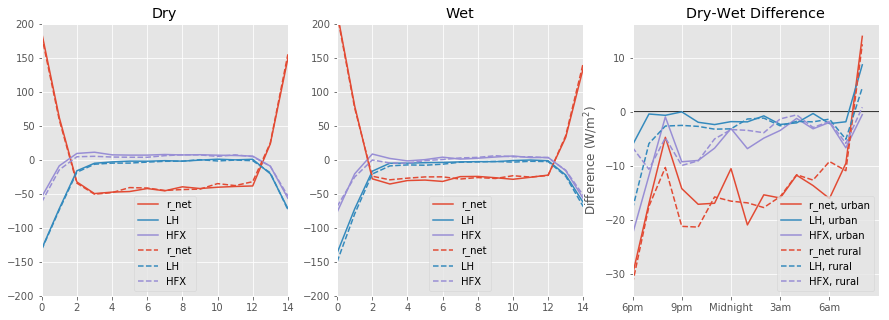

In [915]:
# now diagnose which energy flux is causing this difference
plt.figure(figsize = [15,5])
# dry day energy budget
ax = plt.subplot(1,3,1) 
# urban
urban_dryDF['r_net'].plot(ax=ax, )
urban_dryDF[['LH', 'HFX']].multiply(-1).plot(ax=ax)
# rural
rural_dryDF['r_net'].plot(ax=ax, linestyle = '--', color = plt.rcParams['axes.prop_cycle'].by_key()['color'][0])
rural_dryDF[['LH', 'HFX']].multiply(-1).plot(ax=ax, linestyle = '--',  color = plt.rcParams['axes.prop_cycle'].by_key()['color'][1:3])
ax.set_title('Dry')
ax.set_ylim([-200,200])
plt.legend()
# wet day energy budget 
ax = plt.subplot(1,3,2) 
#urban
urban_wetDF['r_net'].plot(ax=ax)
urban_wetDF[['LH', 'HFX']].multiply(-1).plot(ax=ax)
# rural
rural_wetDF['r_net'].plot(ax=ax, linestyle = '--', color = plt.rcParams['axes.prop_cycle'].by_key()['color'][0])
rural_wetDF[['LH', 'HFX']].multiply(-1).plot(ax=ax, linestyle = '--', color = plt.rcParams['axes.prop_cycle'].by_key()['color'][1:3])
plt.legend()
ax.set_ylim([-200,200])
ax.set_title('Wet')
# dry - wet
ax = plt.subplot(1,3,3)
for var in ['r_net', 'LH' ,'HFX']: 
    diff = urban_dryDF[var].values - urban_wetDF[var].values
    plt.plot(diff)
i =0
for var in ['r_net', 'LH','HFX']: 
    diff = rural_dryDF[var].values - rural_wetDF[var].values
    plt.plot(diff, linestyle = '--', color = plt.rcParams['axes.prop_cycle'].by_key()['color'][i])
    i = i+1

ax.axhline(0, color = 'k', zorder = 0)
h = plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
ax.set_xlim([0,15])
#ax.set_ylim([-100,15])
ax.set_ylabel('Difference (W/m$^2$)')
ax.set_title('Dry-Wet Difference')
plt.legend(['r_net, urban', 'LH, urban', 
            'HFX, urban', 
            'r_net rural', 'LH, rural', 
            'HFX, rural'])

In [939]:
# calculate urban-rural dry-wet difference for r_net
var = 'r_net'
diff = urban_dryDF[var].values - urban_wetDF[var].values - (rural_dryDF[var].values - rural_wetDF[var].values)
diff[0:12].sum()

20.636139408751458

20.636139408751458

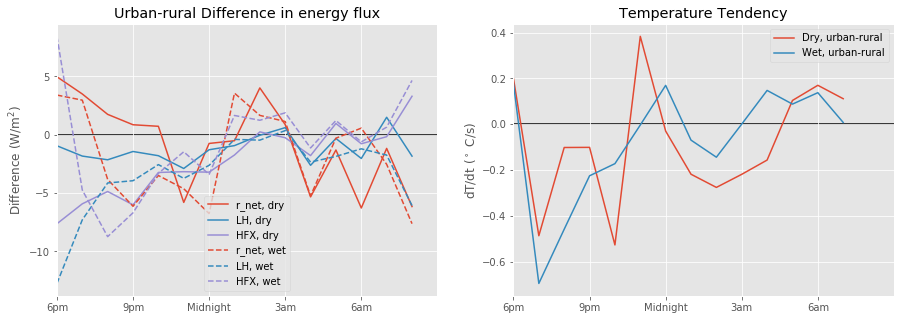

In [930]:
plt.figure(figsize = [15,5])
# urban - rural
ax = plt.subplot(1,2,1)
for var in ['r_net', 'LH' ,'HFX']: 
    diff = urban_dryDF[var].values - rural_dryDF[var].values
    plt.plot(diff)
i =0
for var in ['r_net', 'LH','HFX']: 
    diff = urban_wetDF[var].values - rural_wetDF[var].values
    plt.plot(diff, linestyle = '--', color = plt.rcParams['axes.prop_cycle'].by_key()['color'][i])
    i = i+1

ax.axhline(0, color = 'k', zorder = 0)
h = plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
ax.set_xlim([0,15])
#ax.set_ylim([-100,15])
ax.set_ylabel('Difference (W/m$^2$)')
ax.set_title('Urban-rural Difference in energy flux')
plt.legend(['r_net, dry', 'LH, dry', 
            'HFX, dry', 
            'r_net, wet', 'LH, wet', 
            'HFX, wet'])
ax = plt.subplot(1,2,2) 
diff1 = urban_dryDF['T2'].values[1:] - urban_dryDF['T2'].values[:-1] - (rural_dryDF['T2'].values[1:] - rural_dryDF['T2'].values[:-1])
diff2 = urban_wetDF['T2'].values[1:] - urban_wetDF['T2'].values[:-1] - (rural_wetDF['T2'].values[1:] - rural_wetDF['T2'].values[:-1])
ax.plot(diff1)
ax.plot(diff2)
plt.legend(['Dry, urban-rural',
            'Wet, urban-rural'])
ax.set_title('Temperature Tendency')
ax.set_ylabel('dT/dt ($^\circ$ C/s)')
ax.axhline(0, color = 'k', zorder = 0)
#ax.set_xlim([0,7])
ax.set_xlim([0,15])
t = plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])

## Compare energy budget differences for one day, zooming in on largest difference. See if we can tie changes in temp to changes in energy budget

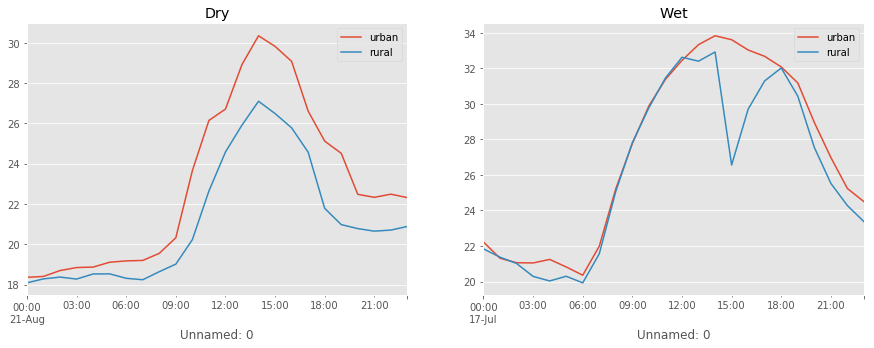

In [364]:
plt.figure(figsize = [15,5])
ax = plt.subplot(1,2,1)
urbanDF['2016-08-21']['T2'].plot(ax=ax)
ruralDF['2016-08-21']['T2'].plot(ax=ax)
plt.legend(['urban', 'rural'])
ax.set_title('Dry')
ax = plt.subplot(1,2,2)
urbanDF['2016-07-17']['T2'].plot(ax=ax)
ruralDF['2016-07-17']['T2'].plot(ax=ax)
plt.legend(['urban', 'rural'])
ax.set_title('Wet')

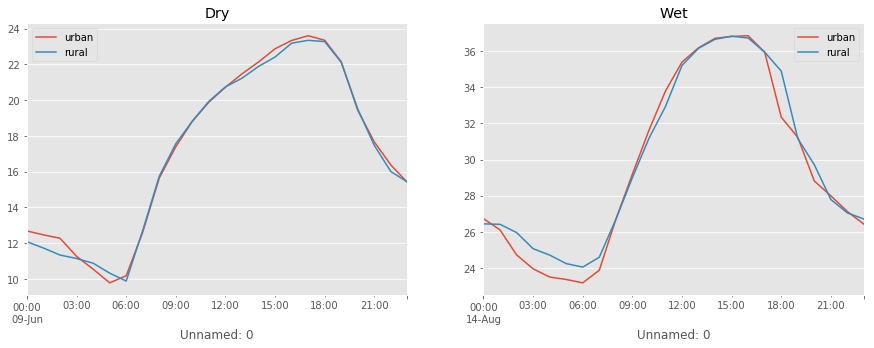

In [371]:
plt.figure(figsize = [15,5])
ax = plt.subplot(1,2,1)
urbanDF['2016-06-09']['T2'].plot(ax=ax)
ruralDF['2016-06-09']['T2'].plot(ax=ax)
plt.legend(['urban', 'rural'])
ax.set_title('Dry')
ax = plt.subplot(1,2,2)
urbanDF['2016-08-14']['T2'].plot(ax=ax)
ruralDF['2016-08-14']['T2'].plot(ax=ax)
plt.legend(['urban', 'rural'])
ax.set_title('Wet')

In [374]:
#dry day
(urbanDF.loc[syn[syn<=3].index]['T2']- ruralDF.loc[syn[syn<=3].index]['T2']).dropna().sort_values(ascending = True) # dry days

date
2016-06-22   -0.872223
2016-06-19   -0.628784
2016-08-23   -0.562134
2016-08-07   -0.490540
2016-07-02   -0.440521
2016-06-18   -0.118408
2016-07-11   -0.062805
2016-06-29   -0.021881
2016-06-14    0.015839
2016-07-24    0.239166
2016-06-11    0.328888
2016-06-13    0.347473
2016-06-10    0.371277
2016-07-17    0.385620
2016-08-04    0.584808
2016-06-09    0.602417
2016-07-10    0.680847
2016-07-20    0.710388
2016-06-25    0.713715
2016-06-26    0.861481
2016-08-30    0.961517
2016-07-21    1.074799
2016-08-24    1.127441
2016-08-22    1.335876
2016-06-30    1.411224
2016-08-08    1.825409
Name: T2, dtype: float64

In [375]:
# wet day
(urbanDF.loc[syn[syn>3].index]['T2']-ruralDF.loc[syn[syn>3].index]['T2'] ).dropna().sort_values(ascending = True)# wet days

date
2016-06-23   -1.509766
2016-07-23   -0.917328
2016-07-16   -0.859161
2016-08-18   -0.826385
2016-06-12   -0.447205
2016-06-20   -0.357697
2016-07-19   -0.229492
2016-07-26   -0.054169
2016-06-08   -0.002472
2016-07-01    0.083679
2016-08-03    0.103546
2016-07-22    0.132904
2016-06-06    0.148010
2016-08-15    0.156097
2016-07-27    0.159943
2016-08-27    0.176178
2016-06-04    0.245911
2016-07-08    0.249725
2016-08-02    0.263336
2016-08-21    0.273926
2016-08-14    0.289978
2016-06-21    0.294983
2016-07-04    0.303680
2016-07-06    0.329407
2016-08-12    0.351959
2016-06-01    0.360657
2016-06-02    0.426086
2016-08-13    0.531647
2016-06-03    0.558716
2016-06-17    0.588165
                ...   
2016-06-28    0.698486
2016-06-27    0.741608
2016-08-06    0.758606
2016-08-17    0.764221
2016-08-11    0.843445
2016-08-10    0.849243
2016-07-07    0.884857
2016-08-09    0.899475
2016-06-15    0.905731
2016-06-05    0.953156
2016-07-18    0.956573
2016-07-31    0.958008
2016-0

(17, 32)

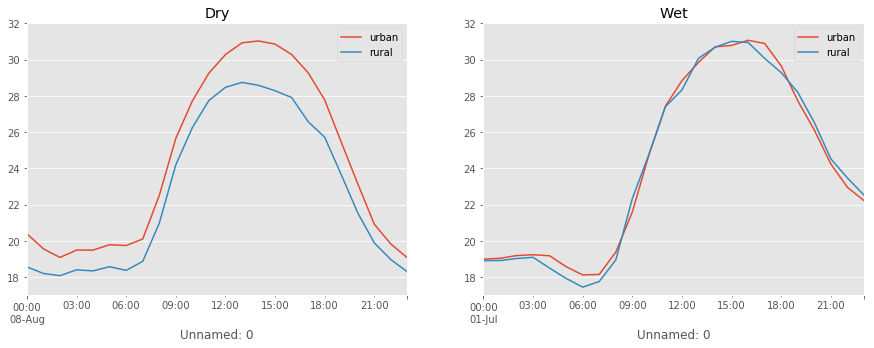

In [380]:
dry_day = '2016-08-08'
wet_day = '2016-07-01'
plt.figure(figsize = [15,5])
ax = plt.subplot(1,2,1)
urbanDF[dry_day]['T2'].plot(ax=ax)
ruralDF[dry_day]['T2'].plot(ax=ax)
ax.set_ylim([17, 32])
plt.legend(['urban', 'rural'])
ax.set_title('Dry')
ax = plt.subplot(1,2,2)
urbanDF[wet_day]['T2'].plot(ax=ax)
ruralDF[wet_day]['T2'].plot(ax=ax)
plt.legend(['urban', 'rural'])
ax.set_title('Wet')
ax.set_ylim([17, 32])


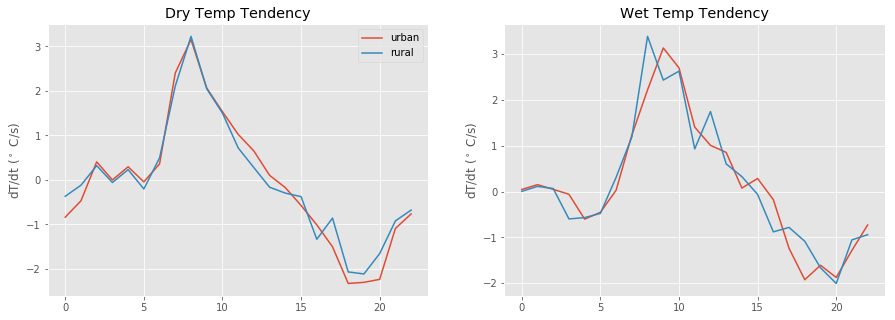

In [420]:
dry_day = '2016-08-08'
wet_day = '2016-07-01'
plt.figure(figsize = [15,5])
ax = plt.subplot(1,2,1)
ax.plot(urbanDF[dry_day]['T2'].values[1:] - urbanDF[dry_day]['T2'].values[:-1] )
ax.plot(ruralDF[dry_day]['T2'].values[1:] - ruralDF[dry_day]['T2'].values[:-1] )
plt.legend(['urban', 'rural'])
ax.set_title('Dry Temp Tendency')
ax.set_ylabel('dT/dt ($^\circ$ C/s)')

ax = plt.subplot(1,2,2)
ax.plot(urbanDF[wet_day]['T2'].values[1:] - urbanDF[wet_day]['T2'].values[:-1] )
ax.plot(ruralDF[wet_day]['T2'].values[1:] - ruralDF[wet_day]['T2'].values[:-1] )

ax.set_title('Wet Temp Tendency')
ax.set_ylabel('dT/dt ($^\circ$ C/s)')


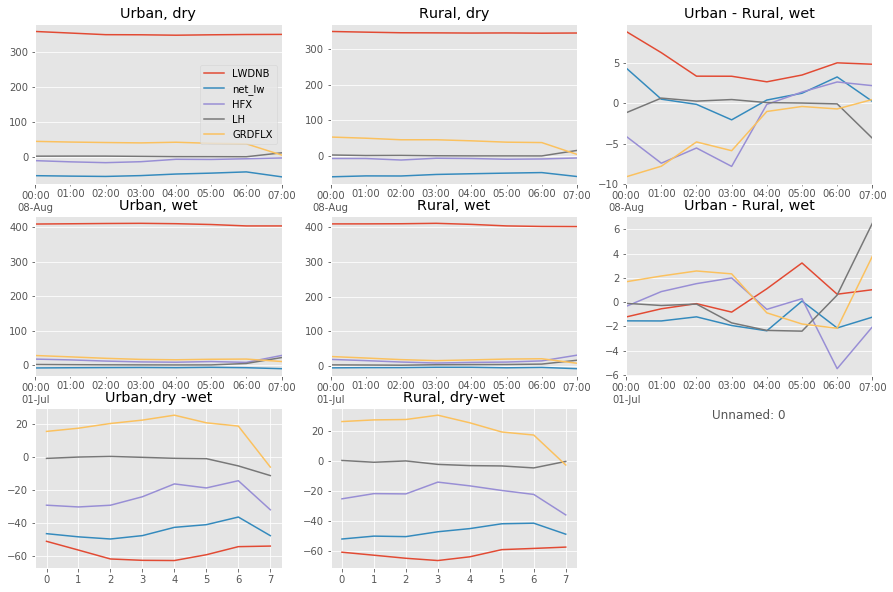

In [435]:
varss = ['LWDNB', 'net_lw', 'HFX', 'LH', 'GRDFLX']
fig = plt.figure(figsize = [15,10])

# plot Urban, dry day 
ax = plt.subplot(3,3,1)
urbanDF[pd.to_datetime(dry_day):pd.to_datetime(dry_day)+ pd.Timedelta('7:00:00')][varss].plot(ax = ax, title = 'Urban, dry')
#ax.set_ylim([-60, 60])
# plot rural, dry day 
ax = plt.subplot(3,3,2)
ruralDF[pd.to_datetime(dry_day):pd.to_datetime(dry_day)+ pd.Timedelta('7:00:00')][varss].plot(ax = ax, title = 'Rural, dry', legend = False)
#ax.set_ylim([-60, 60])

#plot urban - rural, dry
ax = plt.subplot(3,3,3)
(urbanDF[pd.to_datetime(dry_day):pd.to_datetime(dry_day)+ pd.Timedelta('7:00:00')]- ruralDF[pd.to_datetime(dry_day):pd.to_datetime(dry_day)+ pd.Timedelta('7:00:00')])[varss].plot(ax = ax, title = 'Urban - Rural, wet', legend = False)

# plot Urban, wet day 
ax = plt.subplot(3,3,4)
urbanDF[pd.to_datetime(wet_day):pd.to_datetime(wet_day)+ pd.Timedelta('7:00:00')][varss].plot(ax = ax, title = 'Urban, wet', legend = False)
#ax.set_ylim([-60, 60])

# plot rural, wet day 
ax = plt.subplot(3,3,5)
ruralDF[pd.to_datetime(wet_day):pd.to_datetime(wet_day)+ pd.Timedelta('7:00:00')][varss].plot(ax = ax, title = 'Rural, wet', legend = False)
#ax.set_ylim([-60, 60])

#plot urban - rural, wet
ax = plt.subplot(3,3,6)
(urbanDF[pd.to_datetime(wet_day):pd.to_datetime(wet_day)+ pd.Timedelta('7:00:00')]- ruralDF[pd.to_datetime(wet_day):pd.to_datetime(wet_day)+ pd.Timedelta('7:00:00')])[varss].plot(ax = ax, title = 'Urban - Rural, wet', legend = False)

# plot Urban, dry - wet day 
ax = plt.subplot(3,3,7)
ax.plot(urbanDF[pd.to_datetime(dry_day):pd.to_datetime(dry_day)+ pd.Timedelta('7:00:00')][varss].values - urbanDF[pd.to_datetime(wet_day):pd.to_datetime(wet_day)+ pd.Timedelta('7:00:00')][varss].values), 
ax.set_title('Urban,dry -wet')
#ax.set_ylim([-60, 60])

# plot rural,dry -  wet day 
ax = plt.subplot(3,3,8)
ax.plot(ruralDF[pd.to_datetime(dry_day):pd.to_datetime(dry_day)+ pd.Timedelta('7:00:00')][varss].values-ruralDF[pd.to_datetime(wet_day):pd.to_datetime(wet_day)+ pd.Timedelta('7:00:00')][varss].values), 
ax.set_title('Rural, dry-wet')
#ax.set_ylim([-60, 60])

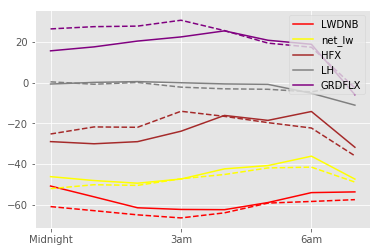

In [430]:
# urban, dry - wet
u_dw = urbanDF[pd.to_datetime(dry_day):pd.to_datetime(dry_day)+ pd.Timedelta('7:00:00')][varss].values - urbanDF[pd.to_datetime(wet_day):pd.to_datetime(wet_day)+ pd.Timedelta('7:00:00')][varss].values
# rural, dry - wet
r_dw = ruralDF[pd.to_datetime(dry_day):pd.to_datetime(dry_day)+ pd.Timedelta('7:00:00')][varss].values-ruralDF[pd.to_datetime(wet_day):pd.to_datetime(wet_day)+ pd.Timedelta('7:00:00')][varss].values

colors = ['red', 'yellow', 'brown', 'gray', 'purple', 'pink']
for row, color in zip(u_dw.T, colors): 
    plt.plot(row, color)# = handle = plt.plot(u_dw, color = ['red', 'blue', 'k', 'k', 'k'])
for row, color in zip(r_dw.T, colors): 
    plt.plot(row, color, linestyle = '--')# = handle = plt.plot(u_dw, color = ['red', 'blue', 'k', 'k', 'k'])
    
plt.legend(varss)
plt.xticks([0,3,6], ['Midnight', '3am', '6am'])
plt.title('')

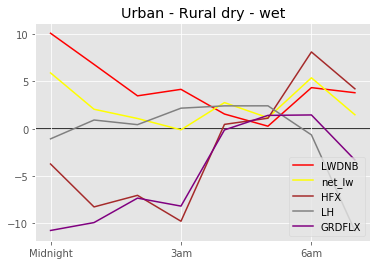

In [436]:
for row, color in zip(u_dw.T- r_dw.T, colors): 
    plt.plot(row, color)# = handle = plt.plot(u_dw, color = ['red', 'blue', 'k', 'k', 'k'])
plt.title('Urban - Rural dry - wet')
plt.legend(varss)
plt.xticks([0,3,6], ['Midnight', '3am', '6am'])
plt.axhline(0, color= 'k', zorder =0)

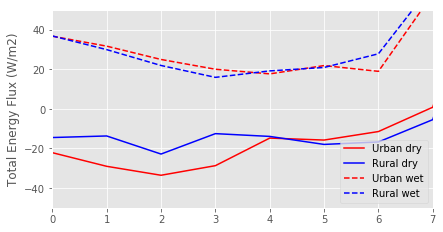

In [502]:
plt.figure(figsize = [15,8])
x = np.arange(0,24,1)
ax = plt.subplot(2,2,1)
ax.plot(x, urbanDF[dry_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(urbanDF[dry_day][['LH']].multiply(-1).sum(axis=1)), color = 'r')
ax.plot(x,ruralDF[dry_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(ruralDF[dry_day][['LH']].multiply(-1).sum(axis=1)), color = 'blue')
# ax.set_title('Dry day')
# ax.set_ylabel('Energy sum')
ax.plot(x, urbanDF[wet_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(urbanDF[wet_day][['LH']].multiply(-1).sum(axis=1)).values, color = 'r', linestyle = '--')
ax.plot(x, ruralDF[wet_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(ruralDF[wet_day][['LH']].multiply(-1).sum(axis=1)).values, color = 'blue', linestyle = '--')

ax.set_xlim([0,7])
ax.set_ylim([-50,50])
ax.set_ylabel('Total Energy Flux (W/m2)')
plt.legend(['Urban dry', 'Rural dry', 'Urban wet', 'Rural wet'])

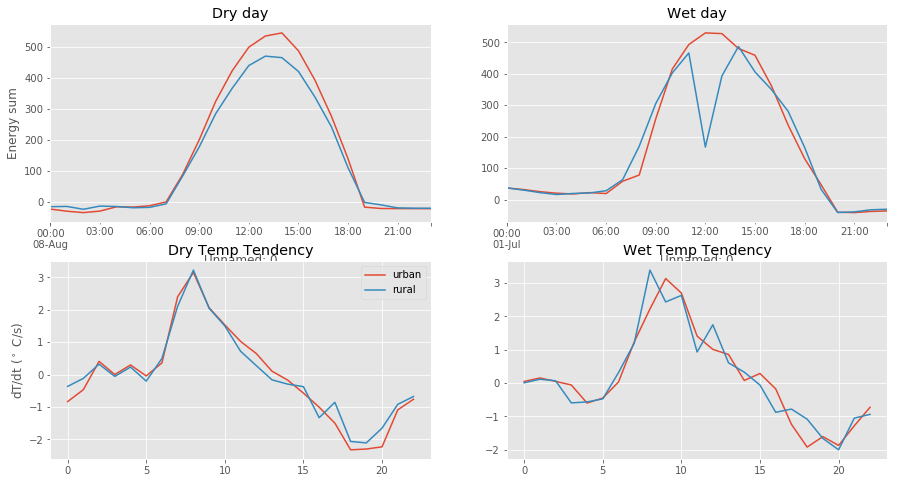

In [464]:
plt.figure(figsize = [15,8])
ax = plt.subplot(2,2,1)
urbanDF[dry_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(urbanDF[dry_day][['LH']].multiply(-1).sum(axis=1)).plot(ax=ax)
ruralDF[dry_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(ruralDF[dry_day][['LH']].multiply(-1).sum(axis=1)).plot(ax=ax)
ax.set_title('Dry day')
ax.set_ylabel('Energy sum')
ax = plt.subplot(2,2,2)
urbanDF[wet_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(urbanDF[wet_day][['LH']].multiply(-1).sum(axis=1)).plot(ax=ax)
ruralDF[wet_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(ruralDF[wet_day][['LH']].multiply(-1).sum(axis=1)).plot(ax=ax)
ax.set_title('Wet day')

ax = plt.subplot(2,2,3)
ax.plot(urbanDF[dry_day]['T2'].values[1:] - urbanDF[dry_day]['T2'].values[:-1] )
ax.plot(ruralDF[dry_day]['T2'].values[1:] - ruralDF[dry_day]['T2'].values[:-1] )
plt.legend(['urban', 'rural'])
ax.set_title('Dry Temp Tendency')
ax.set_ylabel('dT/dt ($^\circ$ C/s)')

ax = plt.subplot(2,2,4)
ax.plot(urbanDF[wet_day]['T2'].values[1:] - urbanDF[wet_day]['T2'].values[:-1] )
ax.plot(ruralDF[wet_day]['T2'].values[1:] - ruralDF[wet_day]['T2'].values[:-1] )
ax.set_title('Wet Temp Tendency')


In [572]:
dry_day

'2016-08-08'

In [575]:
urbanDF.loc['2016-08-07 18:00:00': '2016-08-08']

,T2,SWDNB,SWUPB,LWDNB,LWUPB,LH,HFX,GRDFLX,net_lw,r_net
Unnamed: 0,,,,,,,,,,
2016-08-07 18:00:00,31.089929,377.433960,77.035591,381.059021,488.414825,152.727814,29.653721,-13.220403,-107.355804,193.042564
2016-08-07 19:00:00,29.788721,172.153183,35.137062,379.491211,472.592010,58.117748,-7.326560,4.285939,-93.100800,43.915321
2016-08-07 20:00:00,27.832422,5.092390,1.039375,374.640961,437.947968,2.659039,-8.917340,46.163815,-63.307007,-59.253991
2016-08-07 21:00:00,24.195093,0.000000,0.000000,367.896606,427.953918,2.497035,-24.169037,40.382996,-60.057312,-60.057312
2016-08-07 22:00:00,21.866296,0.000000,0.000000,361.155121,422.806519,1.703355,-15.895205,45.381664,-61.651398,-61.651398
2016-08-07 23:00:00,20.290857,0.000000,0.000000,356.440399,413.695557,1.815841,-11.489936,47.387074,-57.255157,-57.255157
2016-08-08 00:00:00,20.389185,0.000000,0.000000,357.820190,411.429565,2.007546,-10.762659,44.266552,-53.609375,-53.609375
2016-08-08 01:00:00,19.552545,0.000000,0.000000,353.274597,408.180573,2.248619,-14.163643,42.308498,-54.905975,-54.905975
2016-08-08 02:00:00,19.084436,0.000000,0.000000,348.676514,404.475983,2.204161,-16.497152,40.962055,-55.799469,-55.799469


In [ ]:
urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['r_net']].sum(axis=1).subtract(urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][ ['LH','HFX']])#.plot(style ='--k', ax =ax)

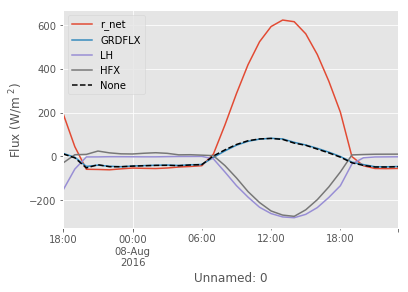

In [669]:
#plt.figure(figsize = [5,5])
# temperature tendencies 
ax = plt.subplot(1,1,1)
urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['r_net']].plot(ax = ax)
urbanDF.loc['2016-08-07 18:00:00': '2016-08-08']['GRDFLX'].multiply(-1).plot(ax=ax)
urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][ ['LH','HFX']].multiply(-1).plot(ax =ax)
urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['r_net']].sum(axis=1).subtract(urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][ ['LH','HFX']].sum(axis=1)).plot(style ='--k', ax =ax)
plt.legend()
plt.ylabel('Flux (W/m $^2 $)')

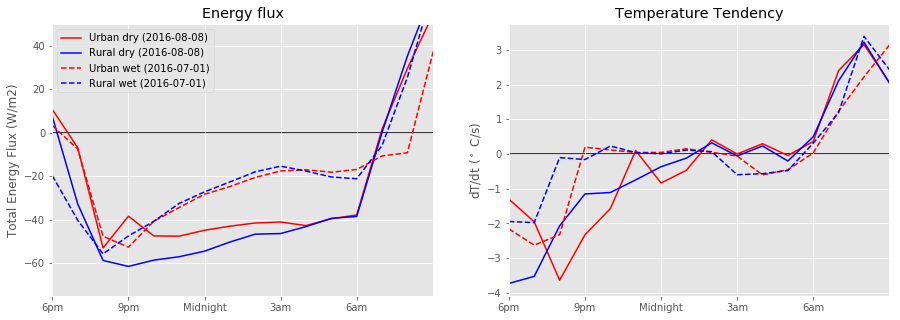

In [655]:
plt.figure(figsize = [15,5])
# temperature tendencies 
ax = plt.subplot(1,2,2)
ax.plot(urbanDF.loc['2016-08-07 18:00:00': '2016-08-08']['T2'].values[1:] - urbanDF.loc['2016-08-07 18:00:00': '2016-08-08']['T2'].values[:-1] , color = 'r')
ax.plot(ruralDF.loc['2016-08-07 18:00:00': '2016-08-08']['T2'].values[1:] - ruralDF.loc['2016-08-07 18:00:00': '2016-08-08']['T2'].values[:-1] , color = 'blue')
ax.plot(urbanDF.loc['2016-06-30 18:00:00': '2016-07-01']['T2'].values[1:] - urbanDF.loc['2016-06-30 18:00:00': '2016-07-01']['T2'].values[:-1], color = 'r', linestyle = '--')
ax.plot(ruralDF.loc['2016-06-30 18:00:00': '2016-07-01']['T2'].values[1:] - ruralDF.loc['2016-06-30 18:00:00': '2016-07-01']['T2'].values[:-1], color = 'blue', linestyle = '--')
#plt.legend(['Urban dry (%s)'%dry_day, 'Rural dry', 'Urban wet (%s)'%wet_day, 'Rural wet'])
ax.set_title('Temperature Tendency')
ax.set_ylabel('dT/dt ($^\circ$ C/s)')
ax.axhline(0, color = 'k', zorder = 0)
#ax.set_xlim([0,7])
ax.set_xlim([0,15])
plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])

# total energy sum : r_net + HFX + grdflux + LH
ax = plt.subplot(1,2,1) 
x = np.arange(0,30,1)
# net radiation (incoming minus outgoing) + sensible heat + ground flux (residual heat) + latent heat 
# currently missing : advection (vertical, horizontal), diffusion 
ax.plot(x, urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['r_net']].sum(axis=1).add(urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['LH', 'HFX']].multiply(-1).sum(axis=1)), color = 'r')
ax.plot(x,ruralDF.loc['2016-08-07 18:00:00': '2016-08-08'][['r_net']].sum(axis=1).add(ruralDF.loc['2016-08-07 18:00:00': '2016-08-08'][['LH', 'HFX']].multiply(-1).sum(axis=1)), color = 'blue')

# ax.plot(x, -1*urbanDF.loc['2016-08-07 18:00:00': '2016-08-08']['GRDFLX'], color = 'yellow')
# ax.plot(x, -1*ruralDF.loc['2016-08-07 18:00:00': '2016-08-08']['GRDFLX'], color = 'green')

# ax.set_title('Dry day')
# ax.set_ylabel('Energy sum')
ax.plot(x, urbanDF.loc['2016-06-30 18:00:00': '2016-07-01'][['r_net', ]].sum(axis=1).add(urbanDF.loc['2016-06-30 18:00:00': '2016-07-01'][['LH', 'HFX']].multiply(-1).sum(axis=1)).values, color = 'r', linestyle = '--')
ax.plot(x, ruralDF.loc['2016-06-30 18:00:00': '2016-07-01'][['r_net']].sum(axis=1).add(ruralDF.loc['2016-06-30 18:00:00': '2016-07-01'][['LH', 'HFX']].multiply(-1).sum(axis=1)).values, color = 'blue', linestyle = '--')
ax.axhline(0, color = 'k', zorder = 0)
ax.set_xlim([0,15])
plt.xticks([0,3, 6,9,12], ['6pm','9pm', 'Midnight', '3am', '6am'])
ax.set_ylim([-75,50])
ax.set_ylabel('Total Energy Flux (W/m2)')
ax.set_title('Energy flux')
plt.legend(['Urban dry (%s)'%dry_day, 'Rural dry (%s)'%dry_day,
            #'Urban dry (%s)'%dry_day, 'Rural dry (%s)'%dry_day, 
            'Urban wet (%s)'%wet_day, 'Rural wet (%s)'%wet_day])

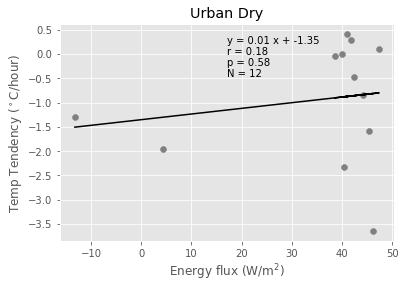

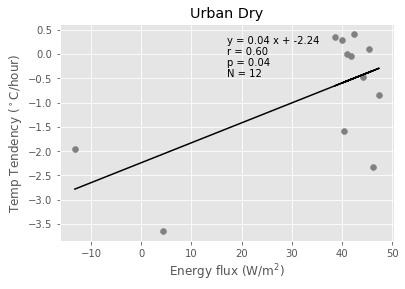

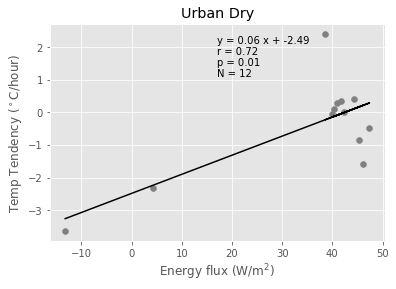

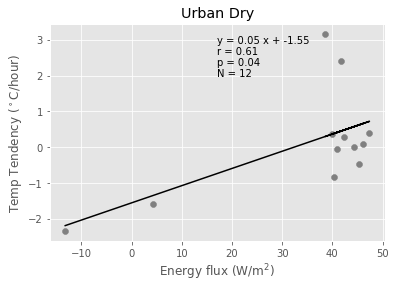

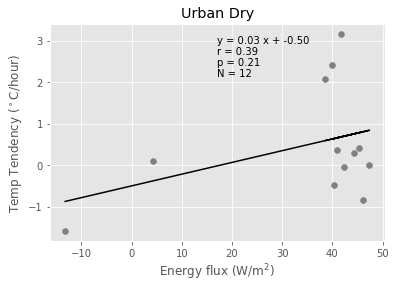

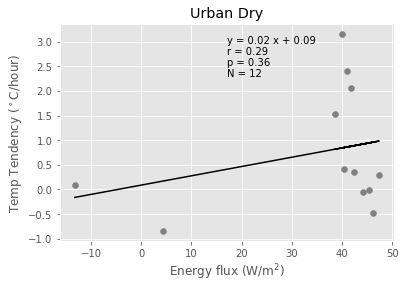

In [652]:
#a = urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['r_net']].sum(axis=1).add(urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['LH',  'HFX']].multiply(-1).sum(axis=1)).values
a = urbanDF.loc['2016-08-07 18:00:00': '2016-08-08']['GRDFLX'].values
b = urbanDF.loc['2016-08-07 18:00:00': '2016-08-08']['T2'].values[1:] - urbanDF.loc['2016-08-07 18:00:00': '2016-08-08']['T2'].values[:-1]
for i in range(0,6):
    plt.figure()
    easy_scatter(a[0:12], b[i:i+12], 'Urban Dry', 'Energy flux (W/m$^2$)', 'Temp Tendency ($^\circ $C/hour)')

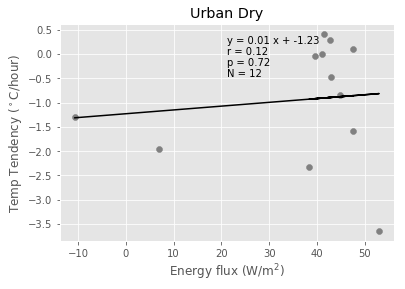

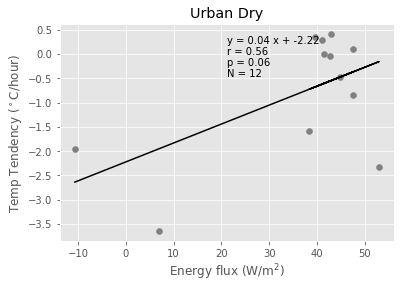

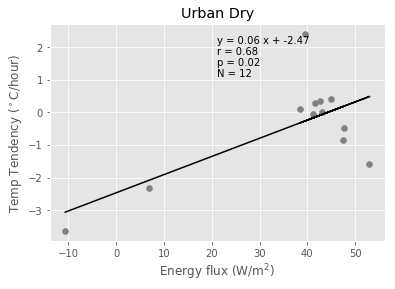

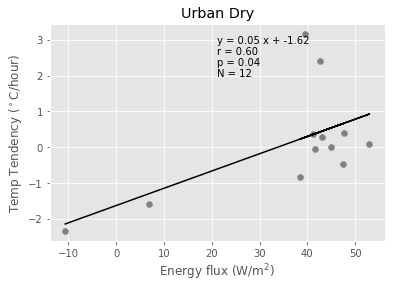

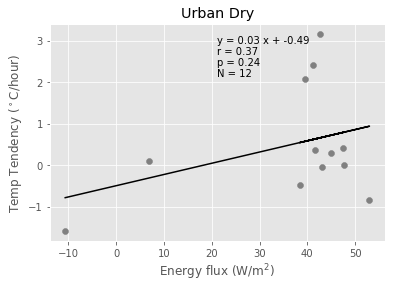

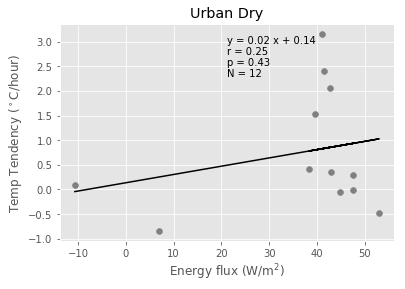

In [657]:
#a = urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['r_net']].sum(axis=1).add(urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['LH',  'HFX']].multiply(-1).sum(axis=1)).values
a = -1*urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['r_net']].sum(axis=1).add(urbanDF.loc['2016-08-07 18:00:00': '2016-08-08'][['LH', 'HFX']].multiply(-1).sum(axis=1)).values
b = urbanDF.loc['2016-08-07 18:00:00': '2016-08-08']['T2'].values[1:] - urbanDF.loc['2016-08-07 18:00:00': '2016-08-08']['T2'].values[:-1]
for i in range(0,6):
    plt.figure()
    easy_scatter(a[0:12], b[i:i+12], 'Urban Dry', 'Energy flux (W/m$^2$)', 'Temp Tendency ($^\circ $C/hour)')

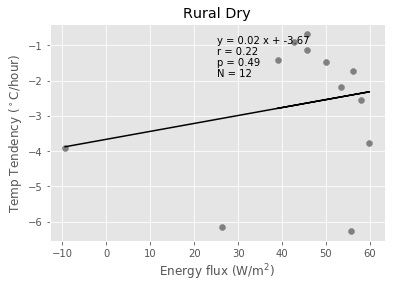

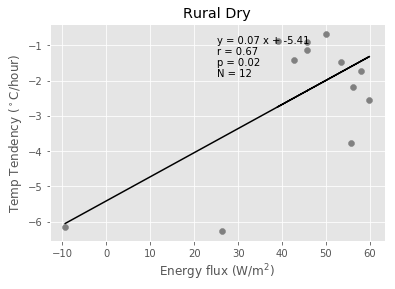

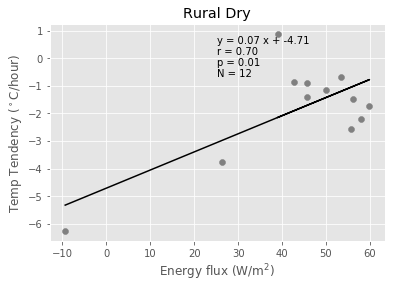

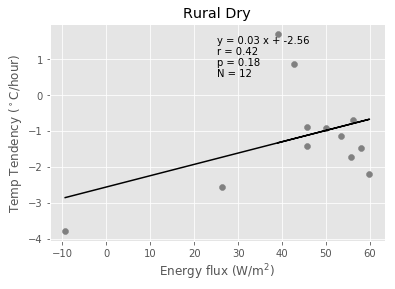

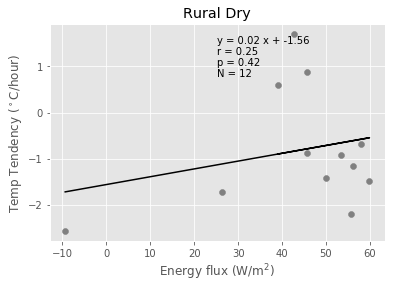

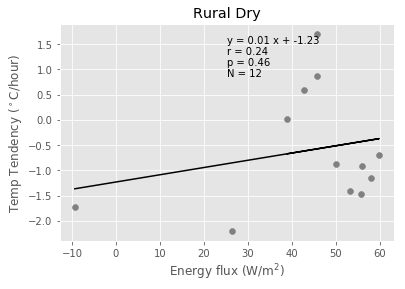

In [653]:
a = ruralDF.loc['2016-08-07 18:00:00': '2016-08-08']['GRDFLX'].values
b = ruralDF.loc['2016-08-07 18:00:00': '2016-08-08']['T2'].values[1:] - urbanDF.loc['2016-08-07 18:00:00': '2016-08-08']['T2'].values[:-1]
for i in range(0,6):
    plt.figure()
    easy_scatter(a[0:12], b[i:i+12], 'Rural Dry', 'Energy flux (W/m$^2$)', 'Temp Tendency ($^\circ $C/hour)')

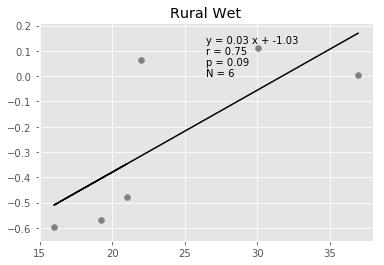

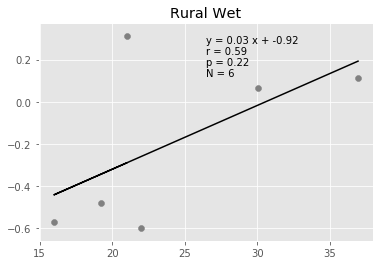

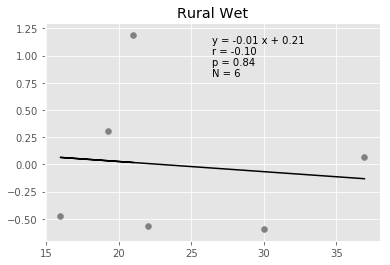

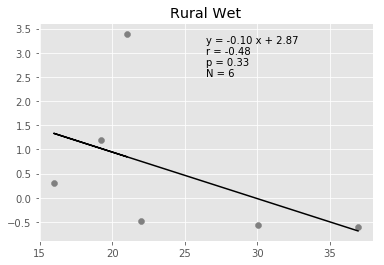

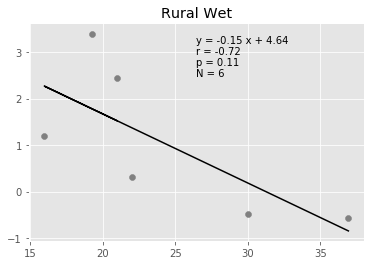

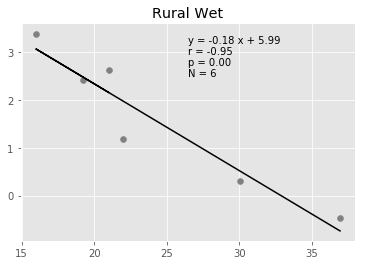

In [564]:
for i in range(0,6): 
    plt.figure()
    a = ruralDF[wet_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(ruralDF[wet_day][['LH']].multiply(-1).sum(axis=1))
    b = ruralDF[wet_day]['T2'].values[1:] - ruralDF[wet_day]['T2'].values[:-1] 
    easy_scatter(a[0:6].values, b[i:i+6], 'Rural Wet')

(-0.096317195986929977, -0.48093290939896266, 0.33421967642616396)

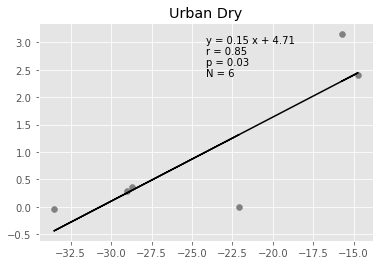

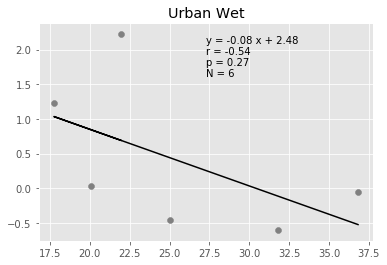

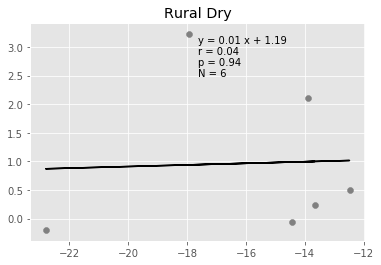

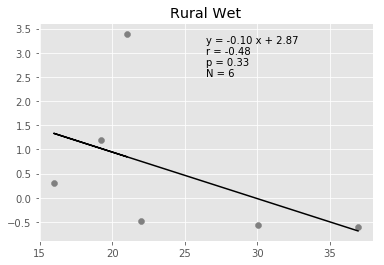

In [560]:
i = 3
plt.figure()
a = urbanDF[dry_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(urbanDF[dry_day][['LH']].multiply(-1).sum(axis=1)).values
b = urbanDF[dry_day]['T2'].values[1:] - urbanDF[dry_day]['T2'].values[:-1] 
easy_scatter(a[0:6], b[i:i+6], 'Urban Dry')
plt.figure()
a = urbanDF[wet_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(urbanDF[wet_day][['LH']].multiply(-1).sum(axis=1))
b = urbanDF[wet_day]['T2'].values[1:] - urbanDF[wet_day]['T2'].values[:-1] 
easy_scatter(a[0:6].values,  b[i:i+6], 'Urban Wet')
plt.figure()
a = ruralDF[dry_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(ruralDF[dry_day][['LH']].multiply(-1).sum(axis=1)).values
b = ruralDF[dry_day]['T2'].values[1:] - ruralDF[dry_day]['T2'].values[:-1] 
easy_scatter(a[0:6],  b[i:i+6], 'Rural Dry')
plt.figure()
a = ruralDF[wet_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(ruralDF[wet_day][['LH']].multiply(-1).sum(axis=1))
b = ruralDF[wet_day]['T2'].values[1:] - ruralDF[wet_day]['T2'].values[:-1] 
easy_scatter(a[0:6].values, b[i:i+6], 'Rural Wet')

(0.030247025381372993, 0.58841288602880204, 0.21924368665154126)

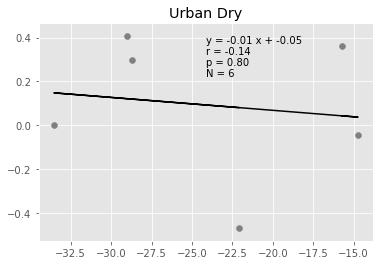

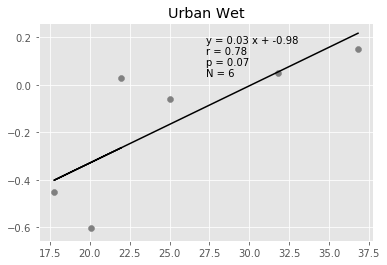

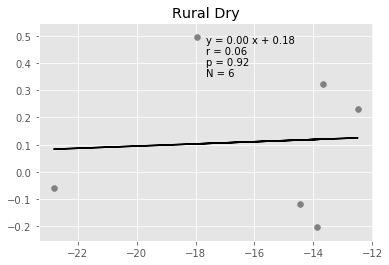

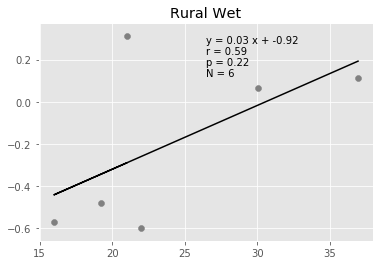

In [555]:
# are the urban fluxes correlated with the temp tendencies? 
a = urbanDF[dry_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(urbanDF[dry_day][['LH']].multiply(-1).sum(axis=1)).values
b = urbanDF[dry_day]['T2'].values[1:] - urbanDF[dry_day]['T2'].values[:-1] 
easy_scatter(a[0:6], b[1:7], 'Urban Dry')

plt.figure()
a = urbanDF[wet_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(urbanDF[wet_day][['LH']].multiply(-1).sum(axis=1))
b = urbanDF[wet_day]['T2'].values[1:] - urbanDF[wet_day]['T2'].values[:-1] 
easy_scatter(a[0:6].values, b[1:7], 'Urban Wet')
plt.figure()
a = ruralDF[dry_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(ruralDF[dry_day][['LH']].multiply(-1).sum(axis=1)).values
b = ruralDF[dry_day]['T2'].values[1:] - ruralDF[dry_day]['T2'].values[:-1] 
easy_scatter(a[0:6], b[1:7], 'Rural Dry')
plt.figure()
a = ruralDF[wet_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(ruralDF[wet_day][['LH']].multiply(-1).sum(axis=1))
b = ruralDF[wet_day]['T2'].values[1:] - ruralDF[wet_day]['T2'].values[:-1] 
easy_scatter(a[0:6].values, b[1:7], 'Rural Wet')

(-20, 20)

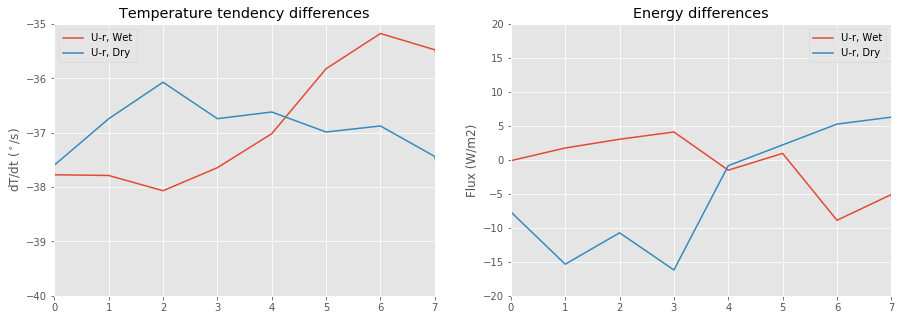

In [529]:
#see if temp tendency on wet days corresponds to the temps
plt.figure(figsize = [15,5])
# temperature tendencies 
ax = plt.subplot(1,2,1)
# urban - rural difference, wet 
diff = (urbanDF[wet_day]['T2'].values[1:] - urbanDF[wet_day]['T2'].values[:-1]) - ruralDF[wet_day]['T2'].values[1:] - ruralDF[wet_day]['T2'].values[:-1]
ax.plot(x[0:-1], diff)
# urban - rural, dry
diff = (urbanDF[dry_day]['T2'].values[1:] - urbanDF[dry_day]['T2'].values[:-1]) - ruralDF[dry_day]['T2'].values[1:] - ruralDF[dry_day]['T2'].values[:-1]
ax.plot(x[0:-1], diff)
ax.set_ylabel('dT/dt ($^\circ $/s)')
plt.legend(['U-r, Wet', 'U-r, Dry'])
ax.set_title('Temperature tendency differences')
ax.set_xlim([0,7])
ax.set_ylim([-40,-35])

ax = plt.subplot(1,2,2)
diff = urbanDF[wet_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(urbanDF[wet_day][['LH']].multiply(-1).sum(axis=1)).values - ruralDF[wet_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(ruralDF[wet_day][['LH']].multiply(-1).sum(axis=1)).values
ax.plot(x,diff)

diff =  urbanDF[dry_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(urbanDF[dry_day][['LH']].multiply(-1).sum(axis=1)) -ruralDF[dry_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(ruralDF[dry_day][['LH']].multiply(-1).sum(axis=1)) 
ax.plot(x, diff)
plt.legend(['U-r, Wet', 'U-r, Dry'])
ax.set_ylabel('Flux (W/m2)')
ax.set_title('Energy differences')
ax.set_xlim([0,7])
ax.set_ylim([-20,20])

/Users/ascott47/anaconda/envs/python2/lib/python2.7/site-packages/ipykernel/__main__.py:24: FutureWarning: in the future, boolean array-likes will be handled as a boolean array index
/Users/ascott47/anaconda/envs/python2/lib/python2.7/site-packages/ipykernel/__main__.py:25: FutureWarning: in the future, boolean array-likes will be handled as a boolean array index


(5.3166740159981224e-21, nan, 1.0)

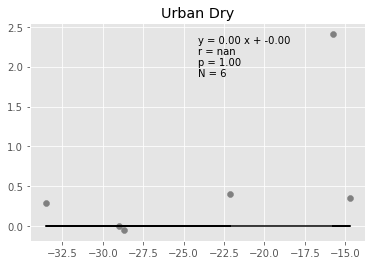

In [546]:
# are the urban fluxes correlated with the temp tendencies? 
a = urbanDF[dry_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(urbanDF[dry_day][['LH']].multiply(-1).sum(axis=1))
b = urbanDF[dry_day]['T2'].values[1:] - urbanDF[dry_day]['T2'].values[:-1] 
easy_scatter(a[0:6], b[2:8], 'Urban Dry')

/Users/ascott47/anaconda/envs/python2/lib/python2.7/site-packages/ipykernel/__main__.py:24: FutureWarning: in the future, boolean array-likes will be handled as a boolean array index
/Users/ascott47/anaconda/envs/python2/lib/python2.7/site-packages/ipykernel/__main__.py:25: FutureWarning: in the future, boolean array-likes will be handled as a boolean array index


(-6.8911824411042862e-19, nan, 1.0)

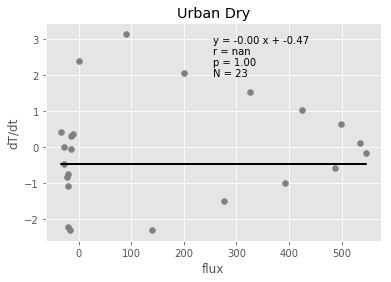

In [548]:
easy_scatter(a[0:-1], b, 'Urban Dry', 'flux', 'dT/dt')

In [544]:
a.shape, b.shape

((24,), (23,))

(-0.16011781030335809, -0.91452269087399185, 0.010647291123550159)

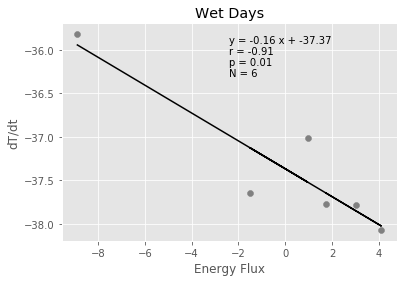

In [541]:
# are these differences correlated? 
# wet, u -r
diff1 = urbanDF[wet_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(urbanDF[wet_day][['LH']].multiply(-1).sum(axis=1)).values - ruralDF[wet_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(ruralDF[wet_day][['LH']].multiply(-1).sum(axis=1)).values
# wet, DT/dt
diff2 = (urbanDF[wet_day]['T2'].values[1:] - urbanDF[wet_day]['T2'].values[:-1]) - ruralDF[wet_day]['T2'].values[1:] - ruralDF[wet_day]['T2'].values[:-1]

easy_scatter(diff1[1:7], diff2[0:6], 'Wet Days', 'Energy Flux', 'dT/dt')

/Users/ascott47/anaconda/envs/python2/lib/python2.7/site-packages/ipykernel/__main__.py:24: FutureWarning: in the future, boolean array-likes will be handled as a boolean array index
/Users/ascott47/anaconda/envs/python2/lib/python2.7/site-packages/ipykernel/__main__.py:25: FutureWarning: in the future, boolean array-likes will be handled as a boolean array index


(5.459649139490447e-16, nan, 1.0)

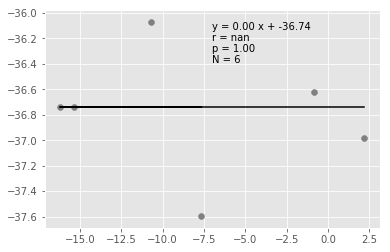

In [539]:
# dry, u -r
diff1 = urbanDF[dry_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(urbanDF[dry_day][['LH']].multiply(-1).sum(axis=1)) -ruralDF[dry_day][['r_net', 'HFX', 'GRDFLX']].sum(axis=1).add(ruralDF[dry_day][['LH']].multiply(-1).sum(axis=1)) 

# dry, DT/dt
diff2 = (urbanDF[dry_day]['T2'].values[1:] - urbanDF[dry_day]['T2'].values[:-1]) - ruralDF[dry_day]['T2'].values[1:] - ruralDF[dry_day]['T2'].values[:-1]

easy_scatter(diff1[0:6], diff2[0:6])

In [538]:
diff1

Unnamed: 0
2016-08-08 00:00:00    -7.659702
2016-08-08 01:00:00   -15.349901
2016-08-08 02:00:00   -10.730489
2016-08-08 03:00:00   -16.201505
2016-08-08 04:00:00    -0.844127
2016-08-08 05:00:00     2.206205
2016-08-08 06:00:00     5.266769
2016-08-08 07:00:00     6.292413
2016-08-08 08:00:00     5.035547
2016-08-08 09:00:00    22.861023
2016-08-08 10:00:00    39.757843
2016-08-08 11:00:00    56.435600
2016-08-08 12:00:00    59.135765
2016-08-08 13:00:00    64.749023
2016-08-08 14:00:00    79.755829
2016-08-08 15:00:00    66.536087
2016-08-08 16:00:00    54.433689
2016-08-08 17:00:00    34.046943
2016-08-08 18:00:00    29.003680
2016-08-08 19:00:00   -15.121130
2016-08-08 20:00:00   -11.635347
2016-08-08 21:00:00    -2.215419
2016-08-08 22:00:00    -1.380436
2016-08-08 23:00:00    -1.361407
Freq: H, dtype: float64

In [ ]:
dry_days = (ruralDF.loc[syn[syn<=3].index]['T2']).dropna().sort_values(ascending = True).index[0:3]
wet_days = (ruralDF.loc[syn[syn>3].index]['T2']).dropna().sort_values(ascending = False).index[0:3]

### Compare energy budget differences for all the dry days, wet days. 

In [281]:
exp

'UCM+SST'

In [282]:
dom

'd03'

In [269]:
# files = list(np.sort(glob.glob(fpath+'%s/%s/wrfout_*'%(exp, dom))))

# variables = ['T2', 'SWDNB', 'SWUPB', 'LWDNB', 'LWUPB', 'LH', 'HFX', 'GRDFLX']
# # urban_df = np.ones([len(files), len(variables)])
# # rural_df = np.ones([len(files), len(variables)])
# i = 0
# times = []
# for file in files: 
# #     ncfile = Dataset(file, 'r')
# #     variables = ['T2', 'SWDNB', 'SWUPB', 'LWDNB', 'LWUPB', 'LH', 'HFX', 'GRDFLX']
# #     urban_df[i,:] = [ncfile.variables[x][:,pts.values[0][0], pts.values[0][1] ] for x in variables]
# #     rural_df[i,:] = [ncfile.variables[x][:,pts.values[1][0], pts.values[1][1] ] for x in variables]   
# #    ncfile.close()
#     times.append(file[-19:])
#     i = i+1
# urbanDF = pd.DataFrame(urban_df[:i,:], columns=variables, 
#              index = pd.to_datetime(times, format = '%Y-%m-%d_%H:%M:%S') - pd.Timedelta('04:00:00'))
# ruralDF = pd.DataFrame(rural_df[:i,:], columns=variables, 
#              index = pd.to_datetime(times, format = '%Y-%m-%d_%H:%M:%S') - pd.Timedelta('04:00:00'))
# urbanDF.to_csv('urban_%s_%s.csv'%(exp, dom))
# ruralDF.to_csv('rural_%s_%s.csv'%(exp, dom))
exp = 'wrfanalysis'
dom = '3km'
urbanDF = pd.read_csv('urban_%s_%s.csv'%(exp, dom), parse_dates = ['Unnamed: 0']).set_index('Unnamed: 0').resample('H').mean()
ruralDF = pd.read_csv('rural_%s_%s.csv'%(exp, dom), parse_dates = ['Unnamed: 0']).set_index('Unnamed: 0').resample('H').mean()
urbanDF.index = urbanDF.index - pd.Timedelta('04:00:00')
ruralDF.index = ruralDF.index - pd.Timedelta('04:00:00')

urbanDF['T2'] = urbanDF['T2'] - 273.15
ruralDF['T2'] = ruralDF['T2'] - 273.15
for df in [urbanDF, ruralDF] : 
    df['net_lw'] = df['LWDNB'] - df['LWUPB']
    df['r_net'] = df['net_lw'] + df['SWDNB'] - df['SWUPB']

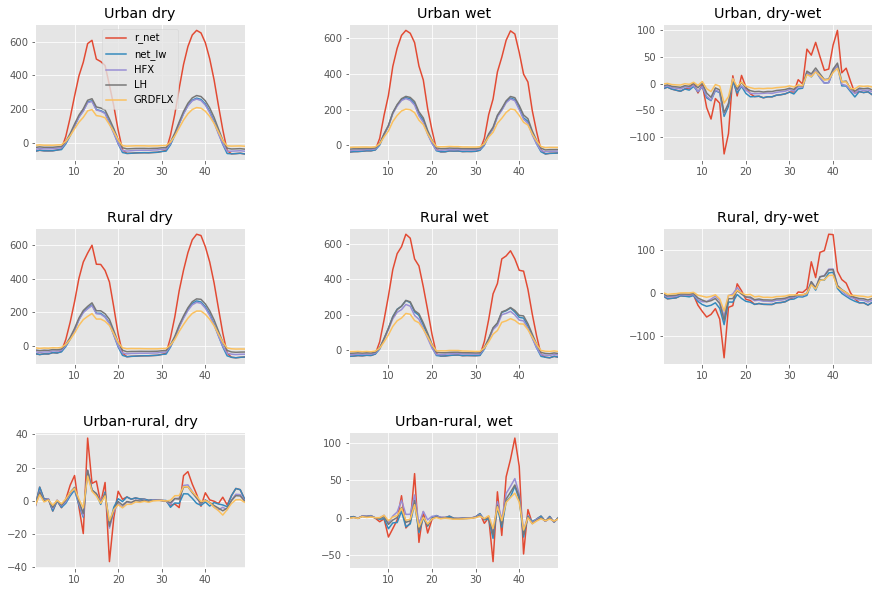

In [289]:
###### plot energy balance
###### only looking at same number of wet and dry days
# compute energy balance averages for wet,dry, urban, rural
ind = np.linspace(1,49, num=49)
varss = ['r_net', 'net_lw', 'HFX', 'LH', 'GRDFLX']
X = 10
urban_dryDF = pd.DataFrame(columns=varss, index = ind)
rural_dryDF = pd.DataFrame(columns=varss, index = ind)
arr = []
arr2 = []
for var in varss:
    for day in dry_days[0:X] : 
        data = urbanDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        data2 = ruralDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        if data.shape == ind.shape : 
            arr.append(data)
            arr2.append(data2)
    urban_dryDF.loc[:,var] = np.mean(arr, axis =0)
    rural_dryDF.loc[:,var] = np.mean(arr2, axis =0)

urban_wetDF = pd.DataFrame(columns=varss, index = ind)
rural_wetDF = pd.DataFrame(columns=varss, index = ind)

arr = []
arr2 = [] # for rural data
for var in varss:
    for day in wet_days[0:X] : 
        data = urbanDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        data2 = ruralDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        if data.shape == ind.shape : 
            arr.append(data)
            arr2.append(data2)
    urban_wetDF.loc[:,var] = np.mean(arr, axis =0)
    rural_wetDF.loc[:,var] = np.mean(arr2, axis =0)
    
fig = plt.figure(figsize = [15,10])
ind = np.linspace(1,49, num=49)

# plot Urban, dry day 
ax = plt.subplot(3,3,1)
urban_dryDF.plot(ax = ax, title= 'Urban dry')
# ax.set_ylim([-25,25])
# ax.set_xlim([20,35])

# plot urban, wet 
ax2 = plt.subplot(3,3, 2)
urban_wetDF.plot(ax = ax2, title= 'Urban wet', legend = False)
# ax2.set_ylim([-35,25])
# ax2.set_xlim([20,35])
# plot urban dry- wet
ax3 = plt.subplot(3,3,3)
(urban_dryDF - urban_wetDF).plot(ax = ax3, title = 'Urban, dry-wet', legend = False)
# ax3.set_ylim([-35,25])
# ax3.set_xlim([20,35])

# plot rural, dry day
ax4 = plt.subplot(3,3,4)
rural_dryDF.plot(ax = ax4, title= 'Rural dry', legend = False)
# ax4.set_ylim([-35,25])
# ax4.set_xlim([20,35])

# plot rural, wet 
ax5= plt.subplot(3,3, 5)
rural_wetDF.plot(ax = ax5, title= 'Rural wet', legend = False)
# ax5.set_ylim([-35,25])
# ax5.set_xlim([20,35])

# plot rural dry- wet
ax6 = plt.subplot(3,3,6)
(rural_dryDF - rural_wetDF).plot(ax = ax6, title = 'Rural, dry-wet', legend = False)
# ax6.set_ylim([-35,25])
# ax6.set_xlim([20,35])

# plot urban- rural difference, dry 
ax7 = plt.subplot(3,3,7)
(urban_dryDF - rural_dryDF).plot(ax = ax7, title = 'Urban-rural, dry', legend = False)
# ax7.set_ylim([-5,5])
# ax7.set_xlim([20,35])

# plot urban-rural difference, wet 
ax8 = plt.subplot(3,3,8)
(urban_wetDF - rural_wetDF).plot(ax = ax8, title = 'Urban-rural, wet', legend = False)
# ax8.set_ylim([-5,5])
# ax8.set_xlim([20,35])
plt.subplots_adjust(wspace=0.5, hspace=0.5);

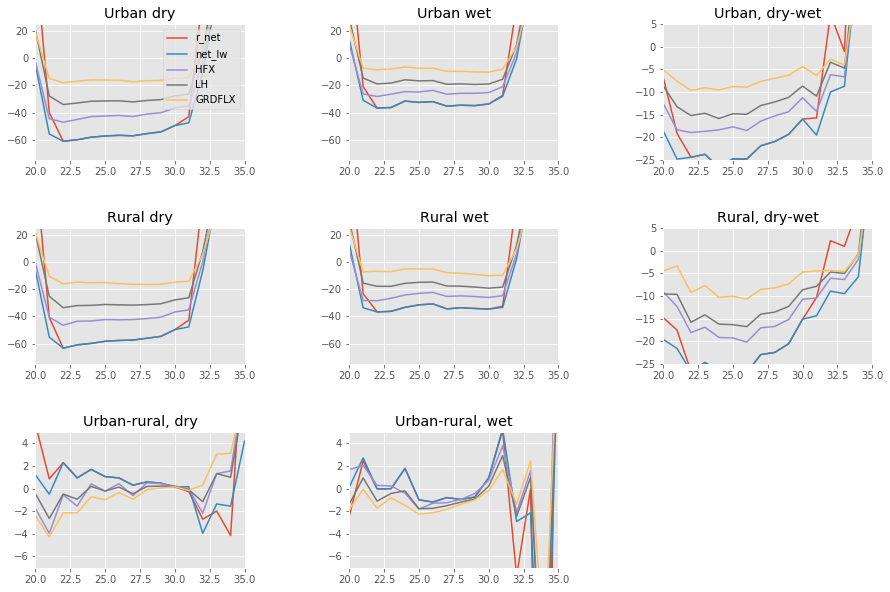

In [288]:
# ###### plot energy balance
# ###### only looking at same number of wet and dry days
# # compute energy balance averages for wet,dry, urban, rural
# ind = np.linspace(1,49, num=49)
# varss = ['r_net', 'net_lw', 'HFX', 'LH', 'GRDFLX']
# X = 15
# urban_dryDF = pd.DataFrame(columns=varss, index = ind)
# rural_dryDF = pd.DataFrame(columns=varss, index = ind)
# arr = []
# arr2 = []
# for var in varss:
#     for day in dry_days:#[0:X] : 
#         data = urbanDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
#         data2 = ruralDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
#         if data.shape == ind.shape : 
#             arr.append(data)
#             arr2.append(data2)
#     urban_dryDF.loc[:,var] = np.mean(arr, axis =0)
#     rural_dryDF.loc[:,var] = np.mean(arr2, axis =0)

# urban_wetDF = pd.DataFrame(columns=varss, index = ind)
# rural_wetDF = pd.DataFrame(columns=varss, index = ind)

# arr = []
# arr2 = [] # for rural data
# for var in varss:
#     for day in wet_days:#[0:X] : 
#         data = urbanDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
#         data2 = ruralDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
#         if data.shape == ind.shape : 
#             arr.append(data)
#             arr2.append(data2)
#     urban_wetDF.loc[:,var] = np.mean(arr, axis =0)
#     rural_wetDF.loc[:,var] = np.mean(arr2, axis =0)
    
fig = plt.figure(figsize = [15,10])
ind = np.linspace(1,49, num=49)
# lim_x1 = 
# lim_x2 = 
lim_y1 = -75
lim_y2 = 25
# plot Urban, dry day 
ax = plt.subplot(3,3,1)
urban_dryDF.plot(ax = ax, title= 'Urban dry')
ax.set_ylim([lim_y1, lim_y2])
ax.set_xlim([20,35])

# plot urban, wet 
ax2 = plt.subplot(3,3, 2)
urban_wetDF.plot(ax = ax2, title= 'Urban wet', legend = False)
ax2.set_ylim([lim_y1, lim_y2])
ax2.set_xlim([20,35])
# plot urban dry- wet
ax3 = plt.subplot(3,3,3)
(urban_dryDF - urban_wetDF).plot(ax = ax3, title = 'Urban, dry-wet', legend = False)
ax3.set_ylim([-25, 5])
ax3.set_xlim([20,35])

# plot rural, dry day
ax4 = plt.subplot(3,3,4)
rural_dryDF.plot(ax = ax4, title= 'Rural dry', legend = False)
ax4.set_ylim([lim_y1, lim_y2])
ax4.set_xlim([20,35])

# plot rural, wet 
ax5= plt.subplot(3,3, 5)
rural_wetDF.plot(ax = ax5, title= 'Rural wet', legend = False)
ax5.set_ylim([lim_y1, lim_y2])
ax5.set_xlim([20,35])

# plot rural dry- wet
ax6 = plt.subplot(3,3,6)
(rural_dryDF - rural_wetDF).plot(ax = ax6, title = 'Rural, dry-wet', legend = False)
ax6.set_ylim([-25, 5])
ax6.set_xlim([20,35])

# plot urban- rural difference, dry 
ax7 = plt.subplot(3,3,7)
(urban_dryDF - rural_dryDF).plot(ax = ax7, title = 'Urban-rural, dry', legend = False)
ax7.set_ylim([-7, 5])
ax7.set_xlim([20,35])

# plot urban-rural difference, wet 
ax8 = plt.subplot(3,3,8)
(urban_wetDF - rural_wetDF).plot(ax = ax8, title = 'Urban-rural, wet', legend = False)
ax8.set_ylim([-7,5])
ax8.set_xlim([20,35])
plt.subplots_adjust(wspace=0.5, hspace=0.5);

([<matplotlib.axis.XTick at 0x12c9f0250>,
 <a list of 3 Text xticklabel objects>)

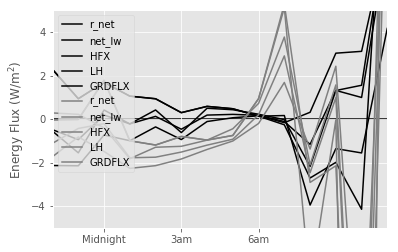

In [315]:
plt.figure()
ax = plt.subplot(1,1,1)
(urban_dryDF - rural_dryDF).plot(color = 'k', ax = ax, label = 'net_lw dry')
(urban_wetDF - rural_wetDF).plot(color = 'grey', ax = ax, label = 'net_lw wet')
plt.xlim([22, 35])
plt.ylim([-5,5])
plt.axhline(0, zorder =0, color = 'k')
plt.legend(loc =2)
plt.ylabel('Energy Flux (W/m$^2$)')
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])

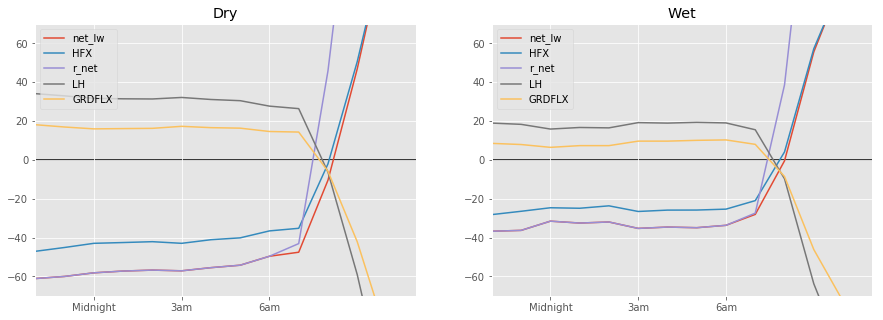

In [341]:
plt.figure(figsize = [15,5])
ax = plt.subplot(1,2,1)
urban_dryDF[['net_lw', 'HFX', 'r_net']].plot(ax = ax)
urban_dryDF[['LH', 'GRDFLX']].multiply(-1).plot(ax = ax)
plt.xlim([22, 35])
plt.ylim([-70,70])
plt.axhline(0, zorder =0, color = 'k')
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])
plt.legend(loc =2)
ax.set_title('Dry')

ax = plt.subplot(1,2,2)
urban_wetDF[['net_lw', 'HFX', 'r_net']].plot(ax = ax)
urban_wetDF[['LH', 'GRDFLX']].multiply(-1).plot(ax = ax)
plt.xlim([22, 35])
plt.ylim([-70,70])
plt.axhline(0, zorder =0, color = 'k')
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])
plt.legend(loc =2)
ax.set_title('Wet')

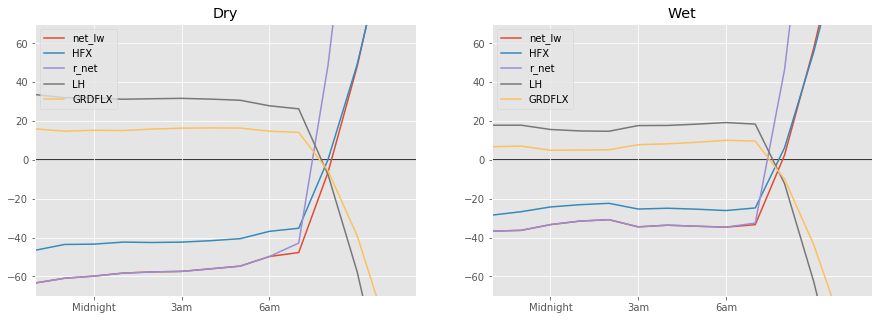

In [342]:
plt.figure(figsize = [15,5])
ax = plt.subplot(1,2,1)
rural_dryDF[['net_lw', 'HFX', 'r_net']].plot(ax = ax)
rural_dryDF[['LH', 'GRDFLX']].multiply(-1).plot(ax = ax)
plt.xlim([22, 35])
plt.ylim([-70,70])
plt.axhline(0, zorder =0, color = 'k')
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])
plt.legend(loc =2)
ax.set_title('Dry')

ax = plt.subplot(1,2,2)
rural_wetDF[['net_lw', 'HFX', 'r_net']].plot(ax = ax)
rural_wetDF[['LH', 'GRDFLX']].multiply(-1).plot(ax = ax)
plt.xlim([22, 35])
plt.ylim([-70,70])
plt.axhline(0, zorder =0, color = 'k')
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])
plt.legend(loc =2)
ax.set_title('Wet')

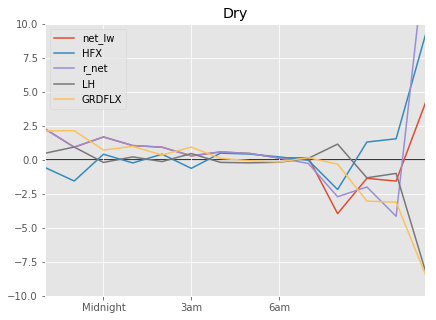

In [346]:
plt.figure(figsize = [15,5])
ax = plt.subplot(1,2,1)
(urban_dryDF[['net_lw', 'HFX', 'r_net']] - rural_dryDF[['net_lw', 'HFX', 'r_net']]).plot(ax = ax, color = ['k', 'blue', 'brown'])
(urban_dryDF[['LH', 'GRDFLX']] -rural_dryDF[['LH', 'GRDFLX']]).multiply(-1).plot(color = ['green', 'grey'], ax = ax)

(urban_wetDF[['net_lw', 'HFX', 'r_net']] - rural_wetDF[['net_lw', 'HFX', 'r_net']]).plot(ax = ax, color = ['k', 'blue', 'brown'])
(urban_wetDF[['LH', 'GRDFLX']] -rural_wetDF[['LH', 'GRDFLX']]).multiply(-1).plot(ax = ax)
plt.xlim([22, 35])
plt.ylim([-10,10])
plt.axhline(0, zorder =0, color = 'k')
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])
plt.legend(loc =2)
ax.set_title('Dry')

([<matplotlib.axis.XTick at 0x12fe4c050>,
 <a list of 3 Text xticklabel objects>)

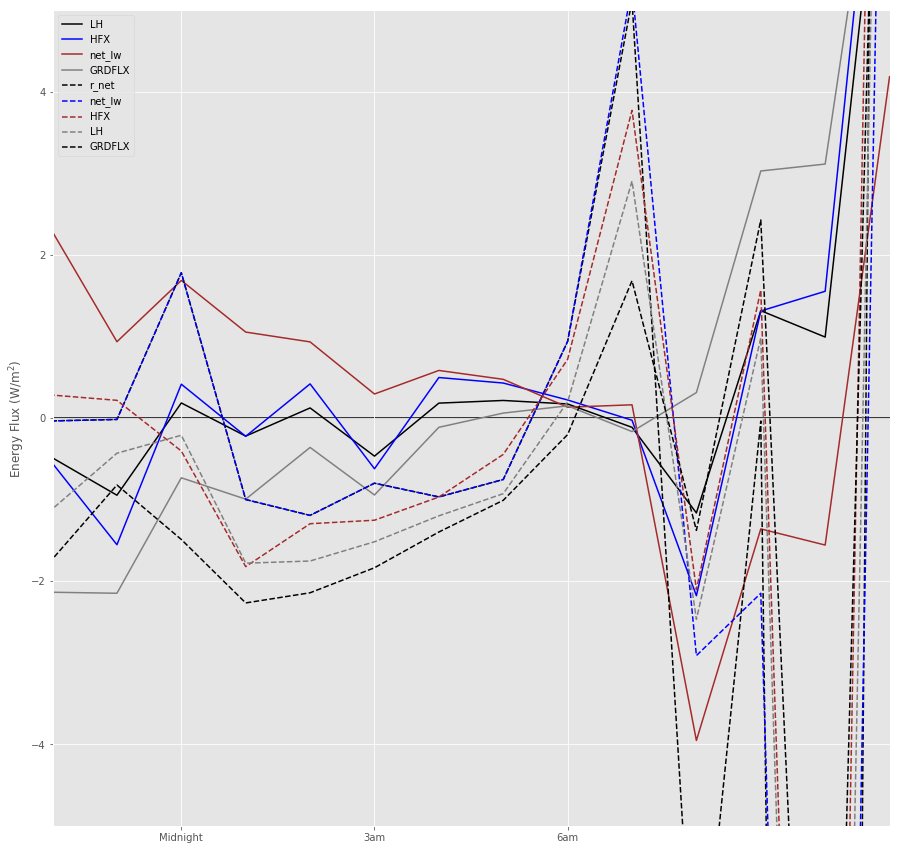

In [347]:
plt.figure(figsize = [15,15])

ax = plt.subplot(1,1,1)
(urban_dryDF - rural_dryDF)[['LH', 'HFX', 'net_lw', 'GRDFLX']].plot(color = ['k', 'blue', 'brown', 'gray'], ax = ax)
(urban_wetDF - rural_wetDF).plot(color = ['k', 'blue', 'brown', 'gray'], linestyle = '--', ax = ax, label = 'net_lw wet')
plt.xlim([22, 35])
plt.ylim([-5,5])
plt.axhline(0, zorder =0, color = 'k')
plt.ylabel('Energy Flux (W/m$^2$)')
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])

Ttest_indResult(statistic=2.6394243633509826, pvalue=0.024758421224921435)

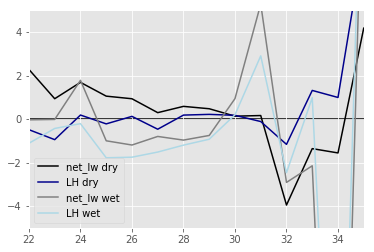

In [310]:
plt.figure()
ax = plt.subplot(1,1,1)
(urban_dryDF - rural_dryDF)[['net_lw']].plot(color = 'k', ax = ax, label = 'net_lw dry')
(urban_dryDF - rural_dryDF)[['LH']].plot(color = 'darkblue', ax = ax, label = 'LH dry')
(urban_wetDF - rural_wetDF)[['net_lw']].plot(color = 'grey', ax = ax, label = 'net_lw wet')
(urban_wetDF - rural_wetDF)[['LH']].plot(color = 'lightblue', ax = ax, label = 'LH wet')
plt.axhline(0, zorder =0, color = 'k')
plt.legend(['net_lw dry', 'LH dry', 'net_lw wet', 'LH wet'])
plt.xlim([22, 35])
plt.ylim([-5,5])
# plt.ylabel('Energy Flux (W/m$^2$)')
# plt.xticks([24,27,30], ['Midnight', '3am', '6am'])
# plt.title('Urban-rural net_lw radiation differences, all days')

scipy.stats.ttest_ind((urban_dryDF - rural_dryDF)['net_lw'].loc[24:29], 
                      (urban_wetDF - rural_wetDF)['net_lw'].loc[24:29])

In [287]:
scipy.stats.ttest_ind((urban_dryDF - rural_dryDF)['net_lw'].loc[23:30], 
                      (urban_wetDF - rural_wetDF)['net_lw'].loc[23:30])

Ttest_indResult(statistic=2.4156156883695576, pvalue=0.029958717788684319)

Ttest_indResult(statistic=0.22586425963033999, pvalue=0.82585637467685746)

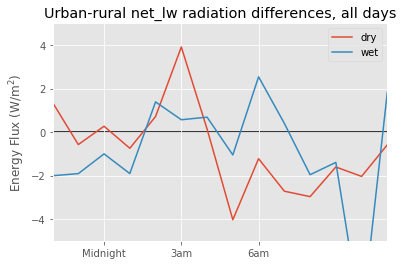

In [274]:
(urban_dryDF - rural_dryDF)['net_lw'].plot(label = 'dry')
(urban_wetDF - rural_wetDF)['net_lw'].plot(label = 'wet')
plt.axhline(0, zorder =0, color = 'k')
plt.legend()
plt.xlim([22, 35])
plt.ylim([-5,5])
plt.ylabel('Energy Flux (W/m$^2$)')
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])
plt.title('Urban-rural net_lw radiation differences, all days')

scipy.stats.ttest_ind((urban_dryDF - rural_dryDF)['net_lw'].loc[24:29], 
                      (urban_wetDF - rural_wetDF)['net_lw'].loc[24:29])

In [255]:
((urban_dryDF - rural_dryDF)['net_lw']- (urban_wetDF - rural_wetDF)['net_lw']).loc[24:29].mean(), ((urban_dryDF - rural_dryDF)['net_lw']- (urban_wetDF - rural_wetDF)['net_lw']).loc[24:29].sum()

(1.6600589224406859, 9.960353534644115)

In [256]:
((urban_dryDF - rural_dryDF)['net_lw']- (urban_wetDF - rural_wetDF)['net_lw']).loc[24:29].max(), ((urban_dryDF - rural_dryDF)['net_lw']- (urban_wetDF - rural_wetDF)['net_lw']).loc[24:29].min()

(3.270171180084688, 0.49316000113237557)

In [169]:
(urban_dryDF - rural_dryDF)['net_lw'].loc[24:29].mean(), (urban_dryDF - rural_dryDF)['net_lw'].loc[24:29].sum()

(0.34295255425031557, 2.0577153255018934)

In [170]:
(urban_wetDF - rural_wetDF)['net_lw'].loc[24:29].mean(), (urban_wetDF - rural_wetDF)['net_lw'].loc[24:29].sum()

(-1.3171063681903703, -7.902638209142221)

When we assess the difference in the surface energy budget on all wet and dry days, we see that there are differences in net radiation (net longwave radiation). These differences are small, but statistically significant (p =0.03). In particular, there is a sign difference: on dry days, urban areas experience larger net longwave radiation than rural areas. During wet days, rural areas experience more longwave radiation. 


We define longwave radiation as longwave down minus longwave up, so a positive net longwave radiation results in more surface energy. 

Furthermore, these differences are consistent with the temperature differences we see

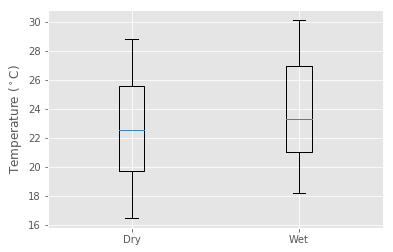

In [188]:
data = [urbanDF['T2'].loc[dry_days], urbanDF['T2'].loc[wet_days]]
handles = plt.boxplot(data)
tick_handles = plt.xticks([1,2], ['Dry', 'Wet'])
plt.ylabel('Temperature ($^\circ$C)')

In [191]:
urbanDF['T2'].loc[dry_days].mean(), urbanDF['T2'].loc[wet_days].mean()

(22.48224440361541, 24.006754927196987)

Temperature differences are approximately on the order of 1.5. Temperature differences can be modelled using 

$$ LW = \sigma T**4 $$
$$ \Delta LW = \sigma T**3 \delta T$$
$$ \Delta LW = 5.67 e^{-8} \cdot 300**3 \cdot 1.5 $$

In [198]:
5.67e-8*300**3*1.5

2.29635

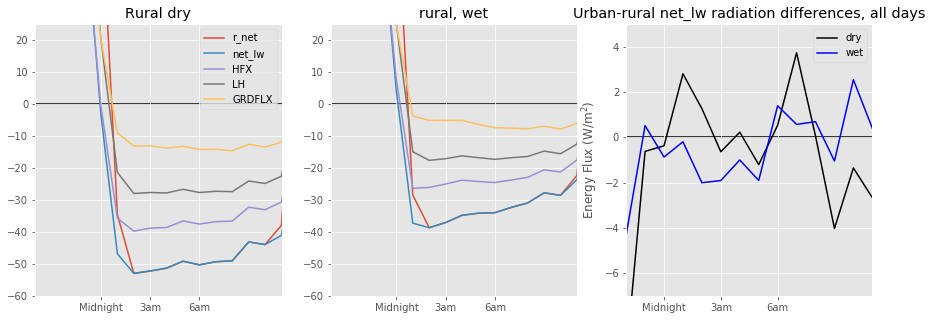

In [264]:
plt.figure(figsize = [15,5])
ax7 = plt.subplot(1,3,1)
(rural_dryDF).plot(ax = ax7, title = 'Rural dry', legend = False)
ax7.set_ylim([-60,25])
ax7.set_xlim([20,35])
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])
plt.axhline(0, zorder =0, color = 'k')
plt.legend()

# plot urban-rural difference, wet 
ax8 = plt.subplot(1,3,2)
(rural_wetDF).plot(ax = ax8, title = 'rural, wet', legend = False)
ax8.set_ylim([-60,25])
ax8.set_xlim([20,35])
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])
#plt.subplots_adjust(wspace=0.5, hspace=0.5);
plt.axhline(0, zorder =0, color = 'k')
ax = plt.subplot(1,3,3)
(urban_dryDF - rural_dryDF)['net_lw'].plot(label = 'dry', color = 'k', ax = ax)
(urban_wetDF - rural_wetDF)['net_lw'].plot(label = 'wet', color = 'blue', ax = ax)
plt.axhline(0, zorder =0, color = 'k')
plt.legend()
plt.xlim([22, 35])
plt.ylim([-7,5])
plt.ylabel('Energy Flux (W/m$^2$)')
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])
plt.title('Urban-rural net_lw radiation differences, all days')

plt.savefig('/Users/ascott47/Downloads/groupmeeting.pdf')

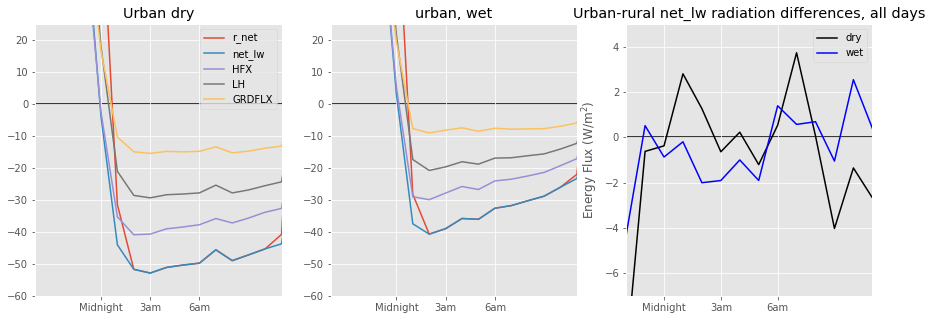

In [260]:
plt.figure(figsize = [15,5])
ax7 = plt.subplot(1,3,1)
(urban_dryDF).plot(ax = ax7, title = 'Urban dry', legend = False)
ax7.set_ylim([-60,25])
ax7.set_xlim([20,35])
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])
plt.axhline(0, zorder =0, color = 'k')
plt.legend()

# plot urban-rural difference, wet 
ax8 = plt.subplot(1,3,2)
(urban_wetDF).plot(ax = ax8, title = 'urban, wet', legend = False)
ax8.set_ylim([-60,25])
ax8.set_xlim([20,35])
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])
#plt.subplots_adjust(wspace=0.5, hspace=0.5);
plt.axhline(0, zorder =0, color = 'k')
ax = plt.subplot(1,3,3)
(urban_dryDF - rural_dryDF)['net_lw'].plot(label = 'dry', color = 'k', ax = ax)
(urban_wetDF - rural_wetDF)['net_lw'].plot(label = 'wet', color = 'blue', ax = ax)
plt.axhline(0, zorder =0, color = 'k')
plt.legend()
plt.xlim([22, 35])
plt.ylim([-7,5])
plt.ylabel('Energy Flux (W/m$^2$)')
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])
plt.title('Urban-rural net_lw radiation differences, all days')

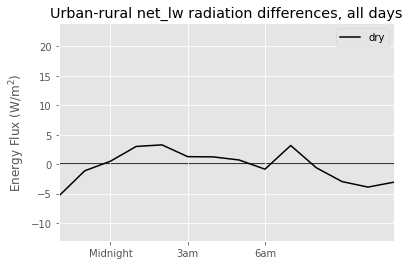

In [263]:
((urban_dryDF -urban_wetDF )['net_lw']-(rural_dryDF - rural_wetDF)['net_lw']).plot(label = 'dry', color = 'k',)
plt.axhline(0, zorder =0, color = 'k')
plt.legend()
plt.xlim([22, 35])
#plt.ylim([-7,5])
plt.ylabel('Energy Flux (W/m$^2$)')
plt.xticks([24,27,30], ['Midnight', '3am', '6am'])
plt.title('Urban-rural net_lw radiation differences, all days')

In [2]:
ls /Users/ascott47/mountpoint/

build/     esmf/      lis/       ncl@       ncl_intel/ wrf/
config/    etc/       local/     ncl.bak/   src/
crtm/      ldt/       lvt/       ncl_gcc/   tmp/


In [3]:
# get points where to read in data 
import time
from netCDF4 import Dataset as nc
import scipy.spatial
from netCDF4 import Dataset
from wrf import getvar
ncfile = Dataset('/Users/ascott47/mountpoint/wrf/run/2way/BEM2D+SST/wrfout_d03_2016-05-26_11:00:00') # 10am UTC is 6am local

t2 = getvar(ncfile, "T2")
df = t2.to_dataframe()

tree = scipy.spatial.KDTree(df[['XLONG', 'XLAT']].values, leafsize = 100)

# urban 
results = tree.query(analysis_points.loc['urban'].values, k = 5, distance_upper_bound=1) # lookup closest points; returns first row as distance and second row as index
urban_location = df.iloc[results[1][0]].name # get the 'name', or coordinate location, of the points

# rural
results = tree.query(analysis_points.loc['rural'].values, k = 5, distance_upper_bound=1) # lookup closest points; returns first row as distance and second row as index
rural_location = df.iloc[results[1][0]].name # get the 'name', or coordinate location, of the points

# Redo urban-rural analysis with different urban rural points

In [4]:
analysis_points = pd.DataFrame([], columns = [u'location:Longitude', u'location:Latitude'], index =['urban', 'rural'])
analysis_points.loc['urban'] = [1,1]
analysis_points.loc['rural'] = [24,25]
analysis_points

,location:Longitude,location:Latitude
urban,1,1
rural,24,25


In [5]:
pts =pd.DataFrame([[85, 140], [87, 109]], columns = [u'west_east', u'north_south'], index =['urban', 'rural'])
pts

,west_east,north_south
urban,85,140
rural,87,109


In [6]:
wrf.ll_to_xy(test_list[-1],analysis_points['location:Latitude'], analysis_points['location:Longitude'])

NameError: name 'test_list' is not defined

BEM2D+SST
BEM2D
No data for BEM2D
BEM+SST
No data for BEM+SST
BEM
No data for BEM


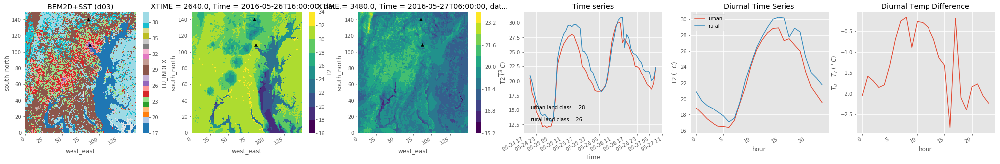

In [93]:
# do the same for 2 way nesting
dirs = os.listdir('/Users/ascott47/mountpoint/wrf/run/2way/')
dom = 'd03'
date = '2016-05-27' 
pts =pd.DataFrame([ [85,87],#west_east
                   [140, 109] ]) # south_north
# rural analysis points; south_north = 140, west_east = 85
# urban analysis points: south_north = 109, west_east = 87])
for exp in dirs: 
    print(exp)
    files = list(np.sort(glob.glob('/Users/ascott47/mountpoint/wrf/run/2way/%s/wrfout_%s*'%(exp,dom))))
    if files:
    #files = list(np.sort(glob.glob(fpath+'%s/d01/wrfout_*'%exp)))
            # open dataset
        test_list = []
        for file in files:
            test_list.append(Dataset(file))
        df = getvar(test_list, varname = "T2", 
                      timeidx = wrf.ALL_TIMES, 
                      method = 'cat'
                      )
        # convert to degrees C
        df = df - 273.15
        # convert to local time
        df['Time'] = df['Time'] - pd.Timedelta('04:00:00')
        # select analysis points
        #points = wrf.ll_to_xy(Dataset(file), analysis_points['location:Latitude'], analysis_points['location:Longitude'])
        #pts = wrf.ll_to_xy(test_list[-1],analysis_points['location:Latitude'], analysis_points['location:Longitude'])
        # points[0] is the lat coordinates
        # points[1] is the lon coordinate
        # urban, rural
        fig, axes = plt.subplots(ncols=6, figsize = [35,5])
        i = 0
        # plot landcover
        lc = getvar(test_list[-1], "LU_INDEX")
        lc.plot(levels = 24, cmap  = cm.tab20, ax = axes[i])
        axes[i].set_title('%s (%s)'%(exp, dom))
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # make map day 
        try: 
            df.sel(Time = date +'T16:00:00').plot(ax = axes[i], levels = 11)
        except: 
            df.sel(Time = '2016-05-26' +'T16:00:00').plot(ax = axes[i], levels = 11)
        #axes[i].set_title('Night (%s 4am)'%date)
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # make map night 
        df.sel(Time = date+'T6:00:00').plot(ax = axes[i], levels = 11)
            
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # plot temp time series
#         urban = df.isel(south_north= points.values[0][0], west_east = points.values[1][0])
#         rural = df.isel(south_north= points.values[0][1], west_east = points.values[1][1])
        urban = df.isel(west_east = pts.values[0], south_north = pts.values[1])[:,0,0]
        rural = df.isel(west_east = pts.values[0], south_north = pts.values[1])[:,1,1]
        urban_lc = lc.isel(west_east = pts.values[0], south_north = pts.values[1])[0,0]
        rural_lc = lc.isel(west_east = pts.values[0], south_north = pts.values[1])[1,1]
        urban.plot(ax = axes[i])
        rural.plot(ax = axes[i])
        axes[i].set_title('Time series')
        axes[i].set_ylabel('T2 ($^\circ C$)')
        axes[i].annotate('urban land class = %i'%urban_lc,( .05,.2), xycoords = 'axes fraction')
        axes[i].annotate('rural land class = %i'%rural_lc,( .05,.1), xycoords = 'axes fraction')
        i = i+1
        # plot diurnal temp cycle
        urban.groupby('Time.hour').mean().plot(ax = axes[i], label = 'urban')
        rural.groupby('Time.hour').mean().plot(ax = axes[i], label = 'rural')
        axes[i].legend()
        axes[i].set_title('Diurnal Time Series')
        axes[i].set_ylabel('T2 ($^\circ C$)')
        i = i+1
        # plot DT in time
        (urban-rural).groupby('Time.hour').mean().plot(ax = axes[i])
        axes[i].set_ylabel('$T_u - T_r$ ($^\circ C$)')
        axes[i].set_title('Diurnal Temp Difference')
        plt.savefig('figures/%s2waynestwrfUHI%s%s2.png'%(exp, dom,date))
    else:  
        print('No data for %s'%exp)

# now look at tr/tu relationship

In [151]:
toc = time.time()
files = list(np.sort(glob.glob(fpath+'%s/%s/wrfout_*'%(exp, dom))))
n = len(files)
temp_u = np.ones(len(files))*np.nan
temp_r = np.ones(len(files))*np.nan

i = 0 
for file in files[0:n]: 
    u = Dataset(file, 'r')
    r = Dataset(file, 'r')
    temp_u[i] = u.variables['T2'][:,pts.values[0][0], pts.values[0][1] ]
    temp_r[i] = r.variables['T2'][:,pts.values[1][0], pts.values[1][1] ]
    u.close()
    r.close()
    print(i)
    i = i+1
print(time.time()-toc)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
27

KeyboardInterrupt: 

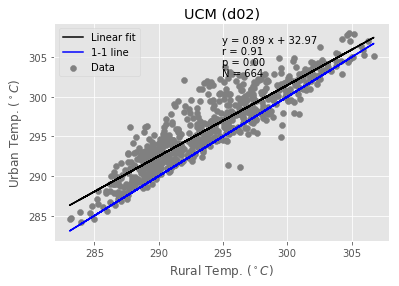

In [167]:
easy_scatter(temp_r, temp_u, '%s (%s)'%(exp, dom), 'Rural Temp. ($^\circ C$)', 'Urban Temp. ($^\circ C$)')
plt.plot(temp_r, temp_r,color= 'blue')
plt.legend([ 'Linear fit', '1-1 line', 'Data',])

# And energy balance

In [42]:
# files = list(np.sort(glob.glob(fpath+'%s/%s/wrfout_*'%(exp, dom))))

# variables = ['T2', 'SWDNB', 'SWUPB', 'LWDNB', 'LWUPB', 'LH', 'HFX', 'GRDFLX']
# # urban_df = np.ones([len(files), len(variables)])
# # rural_df = np.ones([len(files), len(variables)])
# i = 0
# times = []
# for file in files: 
# #     ncfile = Dataset(file, 'r')
# #     variables = ['T2', 'SWDNB', 'SWUPB', 'LWDNB', 'LWUPB', 'LH', 'HFX', 'GRDFLX']
# #     urban_df[i,:] = [ncfile.variables[x][:,pts.values[0][0], pts.values[0][1] ] for x in variables]
# #     rural_df[i,:] = [ncfile.variables[x][:,pts.values[1][0], pts.values[1][1] ] for x in variables]   
# #    ncfile.close()
#     times.append(file[-19:])
#     i = i+1
# urbanDF = pd.DataFrame(urban_df[:i,:], columns=variables, 
#              index = pd.to_datetime(times, format = '%Y-%m-%d_%H:%M:%S') - pd.Timedelta('04:00:00'))
# ruralDF = pd.DataFrame(rural_df[:i,:], columns=variables, 
#              index = pd.to_datetime(times, format = '%Y-%m-%d_%H:%M:%S') - pd.Timedelta('04:00:00'))
# urbanDF.to_csv('urban_%s_%s.csv'%(exp, dom))
# ruralDF.to_csv('rural_%s_%s.csv'%(exp, dom))
exp = 'wrfanalysis'
dom = '3km'
urbanDF = pd.read_csv('urban_%s_%s.csv'%(exp, dom), parse_dates = ['Unnamed: 0']).set_index('Unnamed: 0').resample('H').mean()
ruralDF = pd.read_csv('rural_%s_%s.csv'%(exp, dom), parse_dates = ['Unnamed: 0']).set_index('Unnamed: 0').resample('H').mean()

urbanDF['T2'] = urbanDF['T2'] - 273.15
ruralDF['T2'] = ruralDF['T2'] - 273.15
for df in [urbanDF, ruralDF] : 
    df['net_lw'] = df['LWDNB'] - df['LWUPB']
    df['r_net'] = df['net_lw'] + df['SWDNB'] - df['SWUPB']

In [45]:
urbanDF['T2'] = urbanDF['T2'] - 273.15
ruralDF['T2'] = ruralDF['T2'] - 273.15
for df in [urbanDF, ruralDF] : 
    df['net_lw'] = df['LWDNB'] - df['LWUPB']
    df['r_net'] = df['net_lw'] + df['SWDNB'] - df['SWUPB']

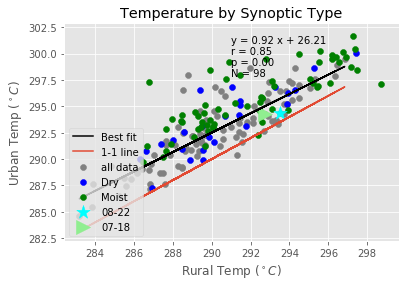

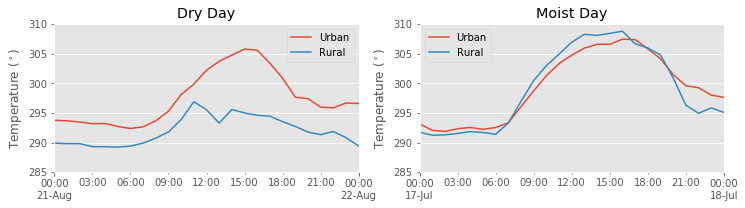

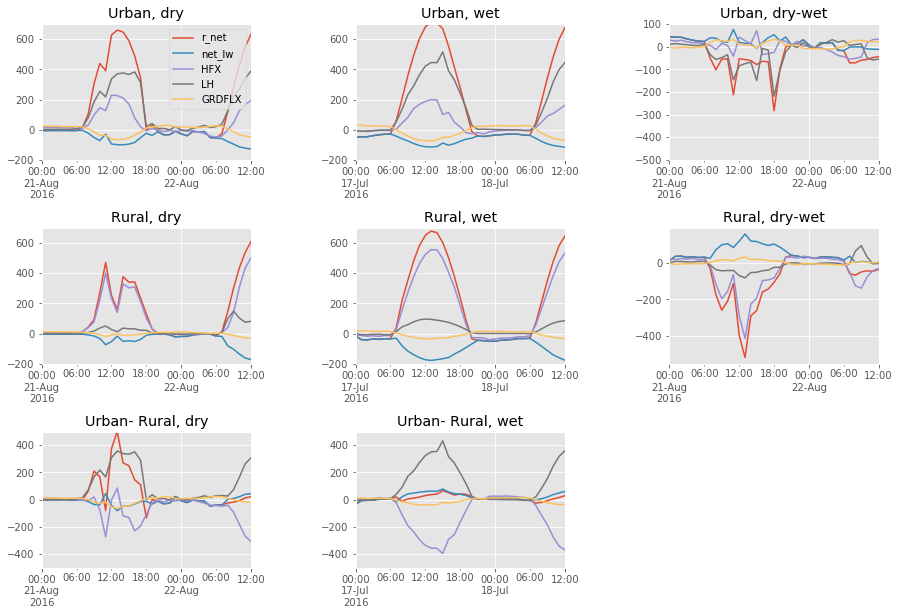

In [308]:


vars = ['r_net', 'net_lw', 'HFX', 'LH', 'GRDFLX']

wet_day = '2016-07-18'
dry_day = '2016-08-22'

###### plot days for analysis
easy_scatter(ruralDF[ruralDF.index.hour ==6 ]['T2'],
             urbanDF[urbanDF.index.hour ==6 ]['T2'], 'Temperature by Synoptic Type')
plt.plot(ruralDF[ruralDF.index.hour ==6 ]['T2'],ruralDF[ruralDF.index.hour ==6 ]['T2'],)
# plot dry
plt.scatter(ruralDF.loc[syn[syn<=3].index]['T2'].dropna(),
           urbanDF.loc[syn[syn<=3].index]['T2'].dropna(), 
            color = 'blue')
#plot moist
plt.scatter(ruralDF.loc[syn[syn>3].index]['T2'].dropna(),
           urbanDF.loc[syn[syn>3].index]['T2'].dropna(), 
            color = 'green')

plt.scatter(ruralDF[ruralDF.index.hour ==6 ][dry_day]['T2'],urbanDF[urbanDF.index.hour ==6 ][dry_day]['T2'], s=200, marker = '*', color = 'cyan')
plt.scatter(ruralDF[ruralDF.index.hour ==6 ][wet_day]['T2'],urbanDF[urbanDF.index.hour ==6 ][wet_day]['T2'], s=200, marker = '>', color = 'lightgreen')
#plt.scatter(tempDF[rural]['2016-08-03 06:00:00'], UHI['2016-08-03'], s=200, marker = 's', color = 'pink')
plt.xlabel('Rural Temp ($^\circ C$)')
plt.ylabel('Urban Temp ($^\circ C$)')

plt.legend(['Best fit', '1-1 line',  'all data', 'Dry', 'Moist', '%s'%dry_day[5:], '%s'%wet_day[5:], 'Aug 3'], loc = 3)

###### plot temperature on those days 
plt.figure(figsize=[12,6])
# plot temperature 
ax = plt.subplot(221)
urbanDF['T2'][pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)].plot(ax = ax)
ruralDF['T2'][pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)].plot(ax = ax)
plt.legend(['Urban', 'Rural'])
plt.title('Dry Day')
plt.ylim([285,310])
plt.ylabel('Temperature ($^\circ$)')

ax2 = plt.subplot(222)
urbanDF['T2'][pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)].plot(ax = ax2)
ruralDF['T2'][pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)].plot(ax = ax2)

plt.legend(['Urban', 'Rural'])
plt.title('Moist Day')
plt.ylim([285,310])
plt.ylabel('Temperature ($^\circ$)')

###### plot energy balance
fig = plt.figure(figsize = [15,10])
# plot Urban, dry day 
#day = '2016-08-22'
ax = plt.subplot(3,3,1)
urbanDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].plot(ax = ax, title = 'Urban, dry')
ax.set_ylim([-200, 700])
# plot urban, wet 
#day = '2016-07-18'
ax2 = plt.subplot(3,3, 2)
urbanDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].plot(ax = ax2, title = 'Urban, wet', legend = False)
ax2.set_ylim([-200, 700])

# plot urban dry- wet
ax3 = plt.subplot(3,3,3)
urbanDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].subtract(urbanDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].values).plot(ax = ax3, title = 'Urban, dry-wet', legend = False)
ax3.set_ylim([-500, 100])

# plot rural, dry day
#day = '2016-08-22'
ax4 = plt.subplot(3,3,4)
ruralDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].plot(ax = ax4, title = 'Rural, dry', legend = False)
ax4.set_ylim([-200, 700])

# plot rural, wet day 
#day = '2016-07-18'
ax5 = plt.subplot(3,3,5)
ruralDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].plot(ax = ax5, title = 'Rural, wet', legend = False)
ax5.set_ylim([-200, 700])

# plot rural dry- wet
ax6 = plt.subplot(3,3,6)
ruralDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].subtract(ruralDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].values).plot(ax = ax6, title = 'Rural, dry-wet', legend = False)
ax3.set_ylim([-500, 100])

# plot urban- rural difference, dry 
ax7 = plt.subplot(3,3,7)
urbanDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].subtract(ruralDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars]).plot(ax = ax7, title = 'Urban- Rural, dry', legend = False)
ax7.set_ylim([-500, 500])

# plot urban-rural difference, wet 
ax8 = plt.subplot(3,3,8)
urbanDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].subtract(ruralDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars]).plot(ax = ax8, title = 'Urban- Rural, wet', legend = False)
ax8.set_ylim([-500, 500])

plt.subplots_adjust(wspace=0.5, hspace=0.5);


########plot day night temp distribution 
for day, name in zip([wet_day, dry_day], ['Wet', 'Dry']) : 
    fig, ax = plt.subplots(ncols = 2, figsize = [15,5])
    t1 = xr.open_dataset(fpath+'%s/%s/wrfout_d01_%s_10:00:00'%(exp, dom, day))
    (t1.T2-273.15).plot(ax=ax[0])
    ax[0].set_title(name+ " " +ax[0].get_title()[7:])

    t2 = xr.open_dataset(fpath+'%s/%s/wrfout_d01_%s_20:00:00'%(exp, dom, day))
    (t2.T2-273.15).plot(ax=ax[1])
    ax[1].set_title(name+ " "+ ax[1].get_title()[7:])

In [14]:
# classify dry days and wet days and do again 
file = '/Users/ascott47/blausteinmount/heat/data/synopticclassification/' + 'BWI'+ '.dbdmt'
synopticDF =  pd.read_table(file, sep = ' ', header =  None, parse_dates = [1])
synopticDF.columns = ['id','date', 'ssc']
synopticDF = synopticDF.set_index(synopticDF['date'])
synopticDF['ssc'].loc[synopticDF['ssc']> 60] =6.5
syn = synopticDF['ssc']['2016-06-01': '2016-09-15'].resample('D').mean()#[pd.PeriodIndex(UHI.index, freq = 'D')[0]:pd.PeriodIndex(UHI.index, freq = 'D')[-1]]

# pick some additional dates to do this on

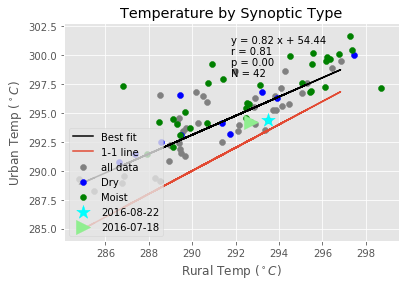

In [246]:
easy_scatter(ruralDF[ruralDF.index.hour ==6 ]['T2'],
             urbanDF[urbanDF.index.hour ==6 ]['T2'], 'Temperature by Synoptic Type')
plt.plot(ruralDF[ruralDF.index.hour ==6 ]['T2'],ruralDF[ruralDF.index.hour ==6 ]['T2'],)
# plot dry
plt.scatter(ruralDF.loc[syn[syn<=3].index]['T2'].dropna(),
           urbanDF.loc[syn[syn<=3].index]['T2'].dropna(), 
            color = 'blue')
#plot moist
plt.scatter(ruralDF.loc[syn[syn>3].index]['T2'].dropna(),
           urbanDF.loc[syn[syn>3].index]['T2'].dropna(), 
            color = 'green')

plt.scatter(ruralDF[ruralDF.index.hour ==6 ][dry_day]['T2'],urbanDF[urbanDF.index.hour ==6 ][dry_day]['T2'], s=200, marker = '*', color = 'cyan')
plt.scatter(ruralDF[ruralDF.index.hour ==6 ][wet_day]['T2'],urbanDF[urbanDF.index.hour ==6 ][wet_day]['T2'], s=200, marker = '>', color = 'lightgreen')
#plt.scatter(tempDF[rural]['2016-08-03 06:00:00'], UHI['2016-08-03'], s=200, marker = 's', color = 'pink')
plt.xlabel('Rural Temp ($^\circ C$)')
plt.ylabel('Urban Temp ($^\circ C$)')

plt.legend(['Best fit', '1-1 line',  'all data', 'Dry', 'Moist', '%s'%dry_day[5:], '%s'%wet_day[5:], 'Aug 3'], loc = 3)

In [419]:
dry_days = (ruralDF.loc[syn[syn<=3].index]['T2']-273.15).dropna().sort_values(ascending = True).index[0:3]
wet_days = (ruralDF.loc[syn[syn>3].index]['T2']-273.15).dropna().sort_values(ascending = False).index[0:3]

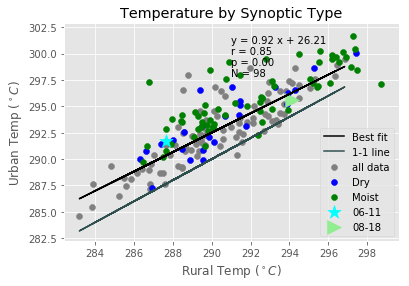

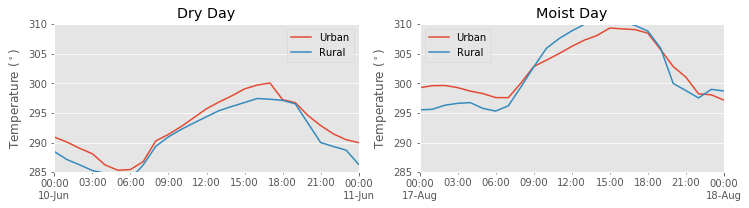

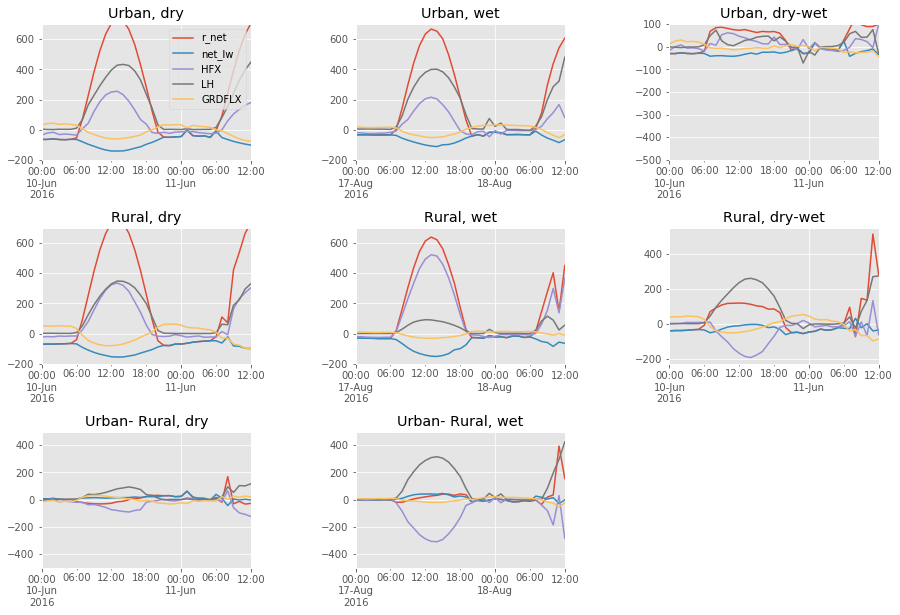

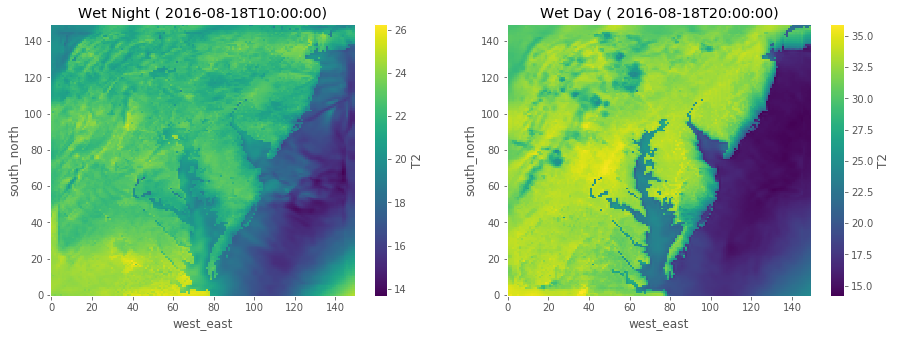

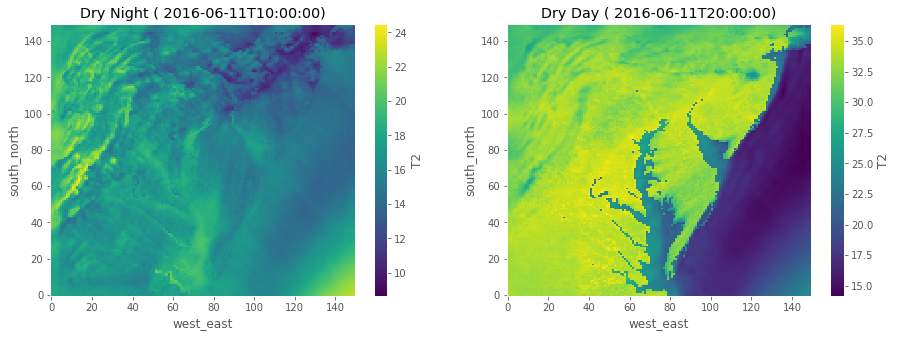

...

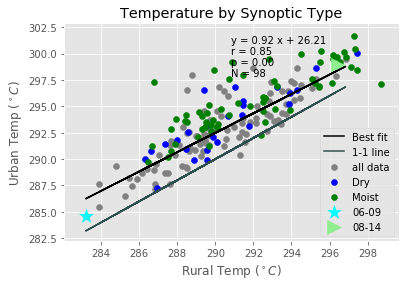

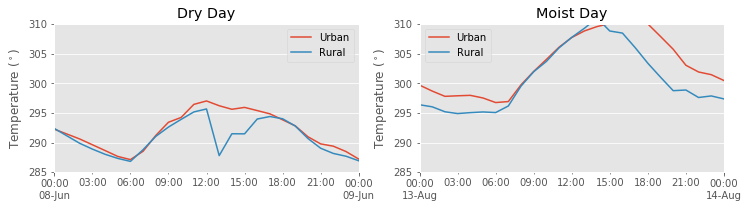

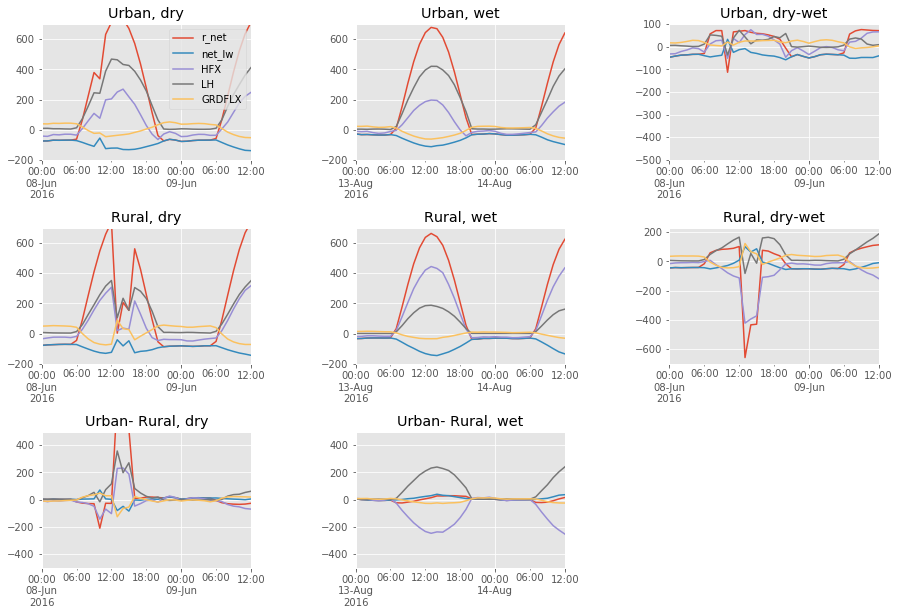

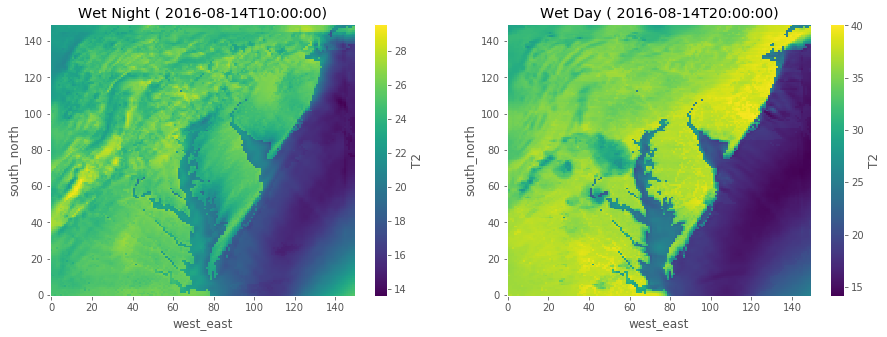

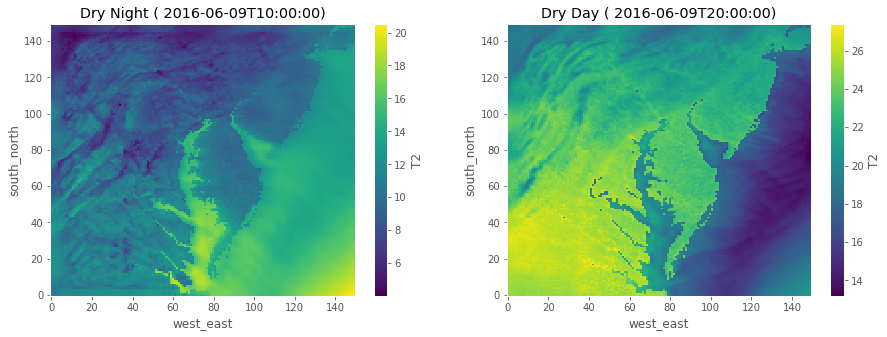

In [420]:
for dry_day, wet_day in zip(dry_days, wet_days): 
    ###### plot days for analysis
    plt.figure()
    easy_scatter(ruralDF[ruralDF.index.hour ==6 ]['T2'],
                 urbanDF[urbanDF.index.hour ==6 ]['T2'], 'Temperature by Synoptic Type')
    plt.plot(ruralDF[ruralDF.index.hour ==6 ]['T2'],
             ruralDF[ruralDF.index.hour ==6 ]['T2'], color = 'darkslategray' )
    plt.scatter(ruralDF.loc[syn[syn<=3].index]['T2'].dropna(), 
                urbanDF.loc[syn[syn<=3].index]['T2'].dropna(),color = 'blue')
    plt.scatter(ruralDF.loc[syn[syn>3].index]['T2'].dropna(), 
                urbanDF.loc[syn[syn>3].index]['T2'].dropna(), color = 'green')
    # plot dry
    plt.scatter(ruralDF.loc[dry_day + pd.Timedelta('06:00:00'), 'T2'],
                urbanDF.loc[dry_day + pd.Timedelta('06:00:00'), 'T2'], s=200, 
                marker = '*', color = 'cyan', zorder =2 )
    #plot moist
    plt.scatter(ruralDF.loc[wet_day + pd.Timedelta('06:00:00'), 'T2'],
                urbanDF.loc[wet_day + pd.Timedelta('06:00:00'), 'T2'],
                s=200, marker = '>', color = 'lightgreen', zorder =2)
    plt.xlabel('Rural Temp ($^\circ C$)')
    plt.ylabel('Urban Temp ($^\circ C$)')
    plt.legend(['Best fit', '1-1 line',  'all data', 'Dry', 'Moist', '%s'%str(dry_day)[5:10], '%s'%str(wet_day)[5:10], 'Aug 3'], loc = 4)
    
    ###### plot temperature on those days 
    plt.figure(figsize=[12,6])
    # plot temperature 
    ax = plt.subplot(221)
    urbanDF['T2'][pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day) + pd.Timedelta('24:00:00')].plot(ax = ax)
    ruralDF['T2'][pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('24:00:00')].plot(ax = ax)
    plt.legend(['Urban', 'Rural'])
    plt.title('Dry Day')
    plt.ylim([280,315])
    plt.ylabel('Temperature ($^\circ$)')

    ax2 = plt.subplot(222)
    urbanDF['T2'][pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('24:00:00')].plot(ax = ax2)
    ruralDF['T2'][pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('24:00:00')].plot(ax = ax2)

    plt.legend(['Urban', 'Rural'])
    plt.title('Moist Day')
    plt.ylim([280,315])
    plt.ylabel('Temperature ($^\circ$)')

    ###### plot energy balance
    fig = plt.figure(figsize = [15,10])
    # plot Urban, dry day 
    #day = '2016-08-22'
    ax = plt.subplot(3,3,1)
    urbanDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].plot(ax = ax, title = 'Urban, dry')
    ax.set_ylim([-200, 700])
    # plot urban, wet 
    #day = '2016-07-18'
    ax2 = plt.subplot(3,3, 2)
    urbanDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].plot(ax = ax2, title = 'Urban, wet', legend = False)
    ax2.set_ylim([-200, 700])

    # plot urban dry- wet
    ax3 = plt.subplot(3,3,3)
    urbanDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].subtract(urbanDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].values).plot(ax = ax3, title = 'Urban, dry-wet', legend = False)
    ax3.set_ylim([-500, 100])

    # plot rural, dry day
    #day = '2016-08-22'
    ax4 = plt.subplot(3,3,4)
    ruralDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].plot(ax = ax4, title = 'Rural, dry', legend = False)
    ax4.set_ylim([-200, 700])

    # plot rural, wet day 
    #day = '2016-07-18'
    ax5 = plt.subplot(3,3,5)
    ruralDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].plot(ax = ax5, title = 'Rural, wet', legend = False)
    ax5.set_ylim([-200, 700])

    # plot rural dry- wet
    ax6 = plt.subplot(3,3,6)
    ruralDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].subtract(ruralDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].values).plot(ax = ax6, title = 'Rural, dry-wet', legend = False)
    ax3.set_ylim([-500, 100])

    # plot urban- rural difference, dry 
    ax7 = plt.subplot(3,3,7)
    urbanDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].subtract(ruralDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars]).plot(ax = ax7, title = 'Urban- Rural, dry', legend = False)
    ax7.set_ylim([-500, 500])

    # plot urban-rural difference, wet 
    ax8 = plt.subplot(3,3,8)
    urbanDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].subtract(ruralDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars]).plot(ax = ax8, title = 'Urban- Rural, wet', legend = False)
    ax8.set_ylim([-500, 500])

    plt.subplots_adjust(wspace=0.5, hspace=0.5);


    ########plot day night temp distribution 
    for day, name in zip([wet_day, dry_day], ['Wet', 'Dry']) : 
        fig, ax = plt.subplots(ncols = 2, figsize = [15,5])
        t1 = xr.open_dataset(fpath+'%s/%s/wrfout_d01_%s_10:00:00'%(exp, dom, str(day)[0:10]))
        (t1.T2-273.15).plot(ax=ax[0])
        ax[0].set_title(name+ " Night (" +ax[0].get_title()[7:]+")")

        t2 = xr.open_dataset(fpath+'%s/%s/wrfout_d01_%s_20:00:00'%(exp, dom, str(day)[0:10]))
        (t2.T2-273.15).plot(ax=ax[1])
        ax[1].set_title(name+ " Day ("+ ax[1].get_title()[7:]+")")

In [111]:
dry_day

Timestamp('2016-06-19 00:00:00')

In [110]:
urbanDF['T2'][dry_day ]

18.771783447000018

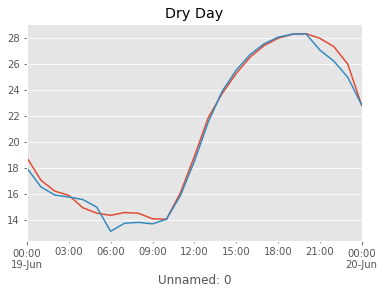

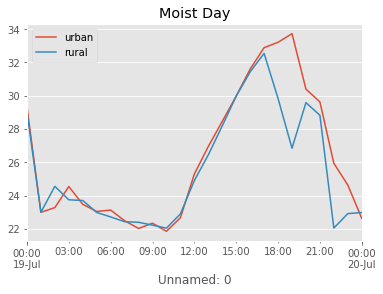

In [115]:
plt.figure()
urbanDF['T2'][pd.to_datetime(dry_day):  pd.to_datetime(dry_day) + pd.Timedelta('24:00:00')].plot(label = 'urban')
ruralDF['T2'][pd.to_datetime(dry_day):  pd.to_datetime(dry_day) + pd.Timedelta('24:00:00')].plot(label = 'rural')
plt.title('Dry Day')
plt.figure()
urbanDF['T2'][pd.to_datetime(wet_day):  pd.to_datetime(wet_day) + pd.Timedelta('24:00:00')].plot(label = 'urban')
ruralDF['T2'][pd.to_datetime(wet_day):  pd.to_datetime(wet_day) + pd.Timedelta('24:00:00')].plot(label = 'rural')
plt.title('Moist Day')
plt.legend()

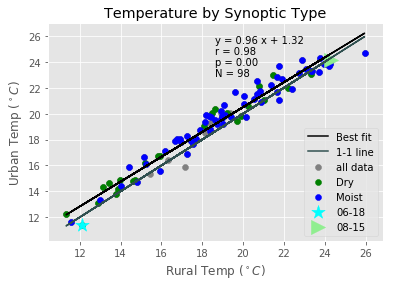

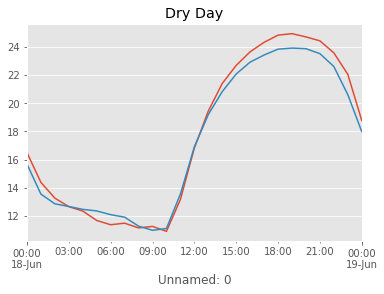

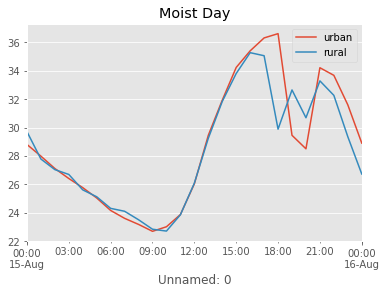

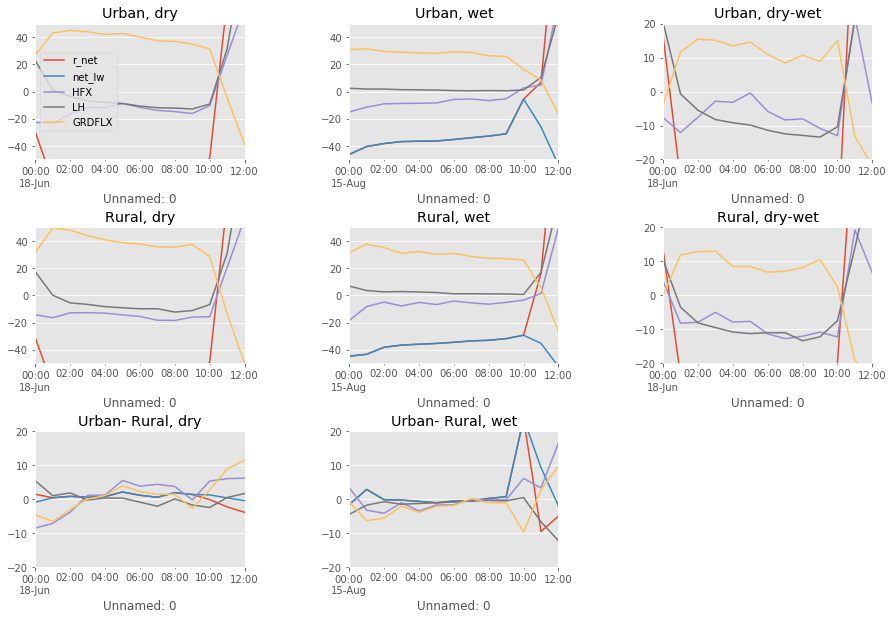

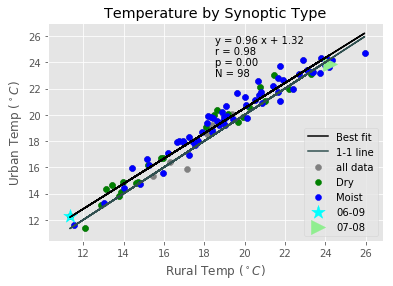

...

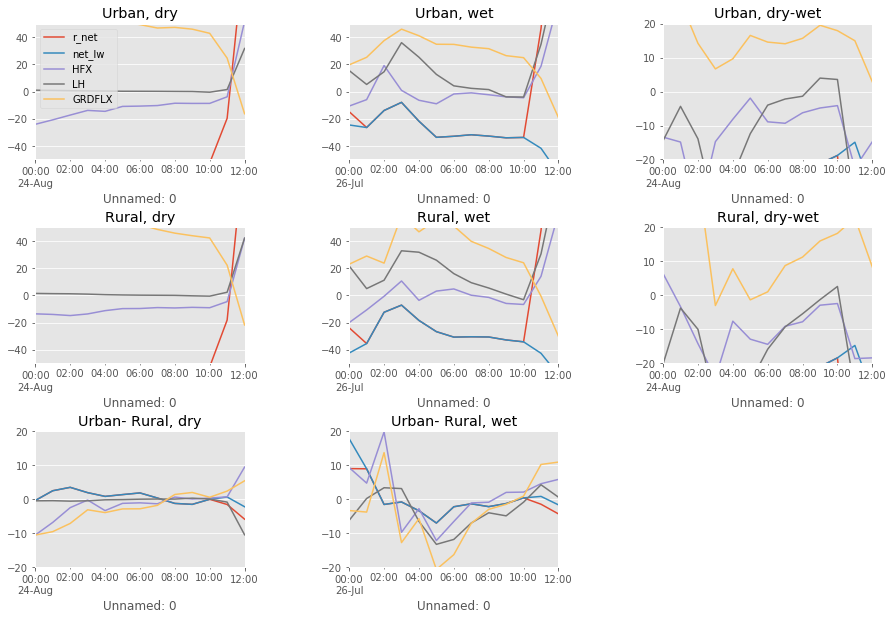

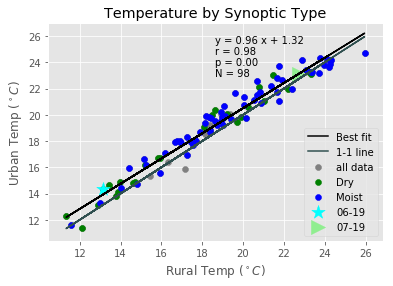

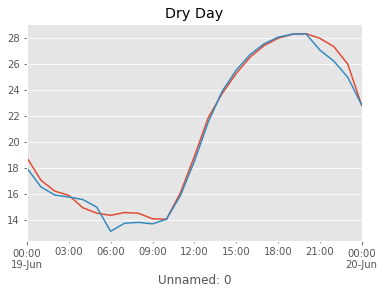

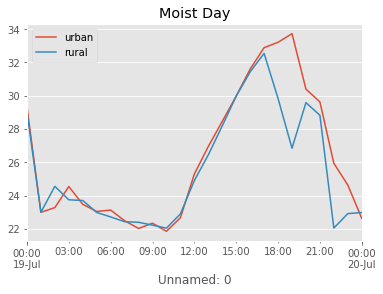

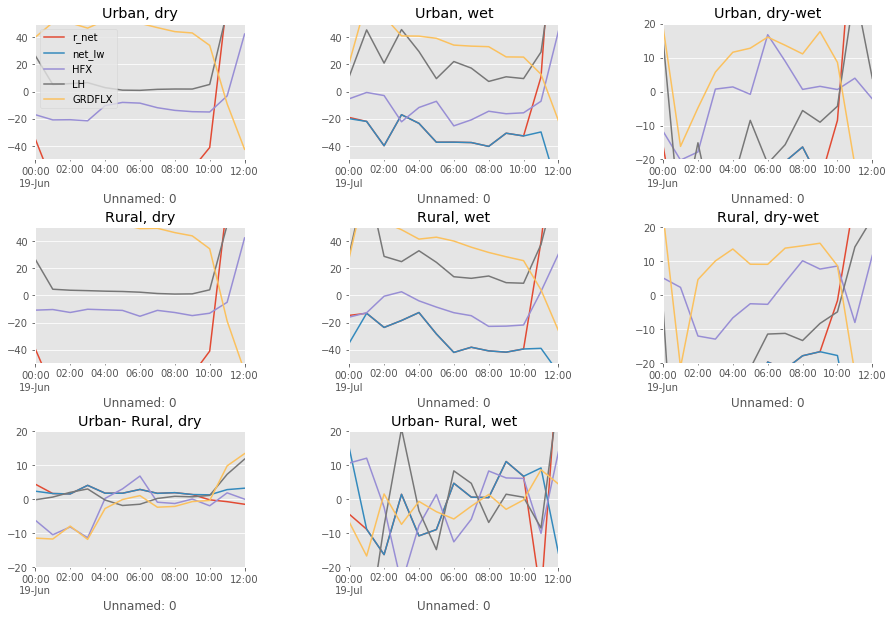

In [118]:
dry_days = (ruralDF.loc[syn[syn<=3].index]['T2']).dropna().sort_values(ascending = True).index#[0:3]
wet_days = (ruralDF.loc[syn[syn>3].index]['T2']).dropna().sort_values(ascending = False).index#[0:3]

for dry_day, wet_day in zip(dry_days[0:5], wet_days[0:5]): 
    ###### plot days for analysis
    plt.figure()
    easy_scatter(ruralDF[ruralDF.index.hour ==6 ]['T2'],
                 urbanDF[urbanDF.index.hour ==6 ]['T2'], 'Temperature by Synoptic Type')
    plt.plot(ruralDF[ruralDF.index.hour ==6 ]['T2'],
             ruralDF[ruralDF.index.hour ==6 ]['T2'], color = 'darkslategray' )

    plt.scatter(ruralDF['T2'].loc[dry_days+ pd.Timedelta('06:00:00')], 
               urbanDF['T2'].loc[dry_days+ pd.Timedelta('06:00:00')], color = 'green')
    
    plt.scatter(ruralDF['T2'].loc[wet_days+ pd.Timedelta('06:00:00')], 
               urbanDF['T2'].loc[wet_days+ pd.Timedelta('06:00:00')], color = 'blue')
    #     easy_scatter(ruralDF[ruralDF.index.hour ==6 ]['T2'],
#                  urbanDF[urbanDF.index.hour ==6 ]['T2'], 'Temperature by Synoptic Type')
#     plt.plot(ruralDF[ruralDF.index.hour ==6 ]['T2'],
#              ruralDF[ruralDF.index.hour ==6 ]['T2'], color = 'darkslategray' )
#     plt.scatter(ruralDF.loc[syn[syn<=3].index]['T2'].dropna(), 
#                 urbanDF.loc[syn[syn<=3].index]['T2'].dropna(),color = 'blue')
#     plt.scatter(ruralDF.loc[syn[syn>3].index]['T2'].dropna(), 
#                 urbanDF.loc[syn[syn>3].index]['T2'].dropna(), color = 'green')
    # plot dry
    plt.scatter(ruralDF.loc[dry_day + pd.Timedelta('06:00:00'), 'T2'],
                urbanDF.loc[dry_day + pd.Timedelta('06:00:00'), 'T2'], s=200, 
                marker = '*', color = 'cyan', zorder =2 )
    #plot moist
    plt.scatter(ruralDF.loc[wet_day + pd.Timedelta('06:00:00'), 'T2'],
                urbanDF.loc[wet_day + pd.Timedelta('06:00:00'), 'T2'],
                s=200, marker = '>', color = 'lightgreen', zorder =2)
    
#     plt.scatter(ruralDF.loc[wet_day + pd.Timedelta('06:00:00'), 'T2'],
#             urbanDF.loc[wet_day + pd.Timedelta('06:00:00'), 'T2'],
#             marker = 'o',s = 10, color = 'cyan',zorder =3)
    plt.xlabel('Rural Temp ($^\circ C$)')
    plt.ylabel('Urban Temp ($^\circ C$)')
    plt.legend(['Best fit', '1-1 line',  'all data', 'Dry', 'Moist', '%s'%str(dry_day)[5:10], '%s'%str(wet_day)[5:10], 'Aug 3'], loc = 4)
    
    ###### plot temperature on those days 
    plt.figure()
    urbanDF['T2'][pd.to_datetime(dry_day) :pd.to_datetime(dry_day) + pd.Timedelta('24:00:00')].plot(label = 'urban')
    ruralDF['T2'][pd.to_datetime(dry_day) :pd.to_datetime(dry_day)+ pd.Timedelta('24:00:00')].plot(label = 'rural')
    plt.title('Dry Day')
    plt.figure()
    urbanDF['T2'][pd.to_datetime(wet_day):pd.to_datetime(wet_day)+ pd.Timedelta('24:00:00')].plot(label = 'urban')
    ruralDF['T2'][pd.to_datetime(wet_day):pd.to_datetime(wet_day)+ pd.Timedelta('24:00:00')].plot(label = 'rural')
    plt.title('Moist Day')
    plt.legend()
    ###### plot energy balance
    fig = plt.figure(figsize = [15,10])
    # plot Urban, dry day 
    #day = '2016-08-22'
    ax = plt.subplot(3,3,1)
    urbanDF[pd.to_datetime(dry_day) :pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][varss].plot(ax = ax, title = 'Urban, dry')
    ax.set_ylim([-50, 50])
    # plot urban, wet 
    #day = '2016-07-18'
    ax2 = plt.subplot(3,3, 2)
    urbanDF[pd.to_datetime(wet_day):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][varss].plot(ax = ax2, title = 'Urban, wet', legend = False)
    ax2.set_ylim([-50, 50])

    # plot urban dry- wet
    ax3 = plt.subplot(3,3,3)
    urbanDF[pd.to_datetime(dry_day):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][varss].subtract(urbanDF[pd.to_datetime(wet_day) :pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][varss].values).plot(ax = ax3, title = 'Urban, dry-wet', legend = False)
    ax3.set_ylim([-20, 20])

    # plot rural, dry day
    #day = '2016-08-22'
    ax4 = plt.subplot(3,3,4)
    ruralDF[pd.to_datetime(dry_day):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][varss].plot(ax = ax4, title = 'Rural, dry', legend = False)
    ax4.set_ylim([-50, 50])

    # plot rural, wet day 
    #day = '2016-07-18'
    ax5 = plt.subplot(3,3,5)
    ruralDF[pd.to_datetime(wet_day):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][varss].plot(ax = ax5, title = 'Rural, wet', legend = False)
    ax5.set_ylim([-50, 50])

    # plot rural dry- wet
    ax6 = plt.subplot(3,3,6)
    ruralDF[pd.to_datetime(dry_day):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][varss].subtract(ruralDF[pd.to_datetime(wet_day):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][varss].values).plot(ax = ax6, title = 'Rural, dry-wet', legend = False)
    ax6.set_ylim([-20, 20])

    # plot urban- rural difference, dry 
    ax7 = plt.subplot(3,3,7)
    urbanDF[pd.to_datetime(dry_day):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][varss].subtract(ruralDF[pd.to_datetime(dry_day) :pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][varss]).plot(ax = ax7, title = 'Urban- Rural, dry', legend = False)
    ax7.set_ylim([-20, 20])

    # plot urban-rural difference, wet 
    ax8 = plt.subplot(3,3,8)
    urbanDF[pd.to_datetime(wet_day) :pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][varss].subtract(ruralDF[pd.to_datetime(wet_day) :pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][varss]).plot(ax = ax8, title = 'Urban- Rural, wet', legend = False)
    ax8.set_ylim([-20, 20])

    plt.subplots_adjust(wspace=0.5, hspace=0.5);

# Average all wet and dry days

In [17]:
ruralDF.head()

,Unnamed: 0,T2,SWDNB,SWUPB,LWDNB,LWUPB,LH,HFX,GRDFLX,net_lw,r_net
0,2016-05-25 00:00:00,-253.025800,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,2016-05-25 01:00:00,-254.363629,0.0,0.0,326.559082,393.973572,3.142483,-24.822891,44.989090,-67.414490,-67.414490
2,2016-05-25 02:00:00,-255.344647,0.0,0.0,323.420685,391.159760,3.315093,-30.255770,40.344185,-67.739075,-67.739075
3,2016-05-25 03:00:00,-255.913647,0.0,0.0,321.871124,389.955597,4.472304,-37.642155,34.411198,-68.084473,-68.084473
4,2016-05-25 04:00:00,-256.671552,0.0,0.0,319.826050,386.813263,4.197139,-36.294792,34.152973,-66.987213,-66.987213


In [46]:
dry_days = (ruralDF.loc[syn[syn<=3].index]['T2']).dropna().sort_values(ascending = True).index#[0:3]
wet_days = (ruralDF.loc[syn[syn>3].index]['T2']).dropna().sort_values(ascending = False).index#[0:3]

skipping 2016-08-30 00:00:00


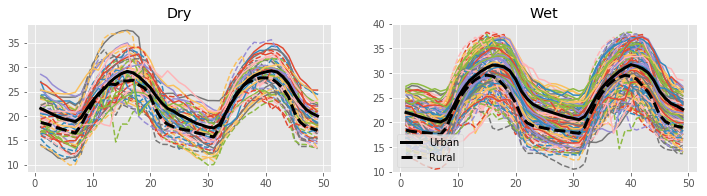

In [519]:
plt.figure(figsize=[12,6])
# plot temperature 
ax = plt.subplot(221)
arr = []
arr_r = []
ind = np.linspace(1,49, num=49)
for day in dry_days: 
    try: 
        ax.plot(ind, 
               urbanDF['T2'][pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day) + pd.Timedelta('24:00:00')].values, label = '%s'%str(day)[0:10])
        ax.plot(ind, 
               ruralDF['T2'][pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day) + pd.Timedelta('24:00:00')].values,  '--', label = '%s'%str(day)[0:10])
        arr.append(urbanDF['T2'][pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day) + pd.Timedelta('24:00:00')].values)
        arr_r.append(ruralDF['T2'][pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day) + pd.Timedelta('24:00:00')].values)

    except ValueError: 
        print('skipping %s'%day)
ax.plot(ind,np.mean(arr, axis =0), 'k', linewidth =3, label = 'Urban' )
ax.plot(ind,np.mean(arr_r, axis =0), '--k',linewidth =3, label = 'Rural')
ax.set_title('Dry')
ax2.set_ylim([10,40])

ax2 = plt.subplot(222)
arr = []
arr_r = []
for day in wet_days: 
    try: 
        ax2.plot(ind, 
               urbanDF['T2'][pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day) + pd.Timedelta('24:00:00')].values)#, label = '%s'%str(day)[0:10])
        ax2.plot(ind, 
               ruralDF['T2'][pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day) + pd.Timedelta('24:00:00')].values,  '--')#, label = '%s'%str(day)[0:10])
        arr.append(urbanDF['T2'][pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day) + pd.Timedelta('24:00:00')].values)
        arr_r.append(ruralDF['T2'][pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day) + pd.Timedelta('24:00:00')].values)

    except ValueError: 
        print('skipping %s'%day)
    
ax2.plot(ind,np.mean(arr, axis =0), 'k', linewidth =3, label = 'Urban' )
ax2.plot(ind,np.mean(arr_r, axis =0), '--k',linewidth =3, label = 'Rural')
ax2.set_title('Wet')
ax2.set_ylim([10,40])
ax2.legend(loc = 3)

In [590]:
len(wet_days)

65

In [591]:
len(dry_days)

26

In [128]:
# compute energy balance averages for wet,dry, urban, rural
ind = np.linspace(1,49, num=49)
varss = ['r_net', 'net_lw', 'HFX', 'LH', 'GRDFLX']
X = 15
urban_dryDF = pd.DataFrame(columns=varss, index = ind)
rural_dryDF = pd.DataFrame(columns=varss, index = ind)
arr = []
arr2 = []
for var in varss:
    for day in dry_days[0:X] : 
        data = urbanDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        data2 = ruralDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        if data.shape == ind.shape : 
            arr.append(data)
            arr2.append(data2)
    urban_dryDF.loc[:,var] = np.mean(arr, axis =0)
    rural_dryDF.loc[:,var] = np.mean(arr2, axis =0)

urban_wetDF = pd.DataFrame(columns=varss, index = ind)
rural_wetDF = pd.DataFrame(columns=varss, index = ind)

arr = []
arr2 = [] # for rural data
for var in varss:
    for day in wet_days[0:X] : 
        data = urbanDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        data2 = ruralDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        if data.shape == ind.shape : 
            arr.append(data)
            arr2.append(data2)
    urban_wetDF.loc[:,var] = np.mean(arr, axis =0)
    rural_wetDF.loc[:,var] = np.mean(arr2, axis =0)

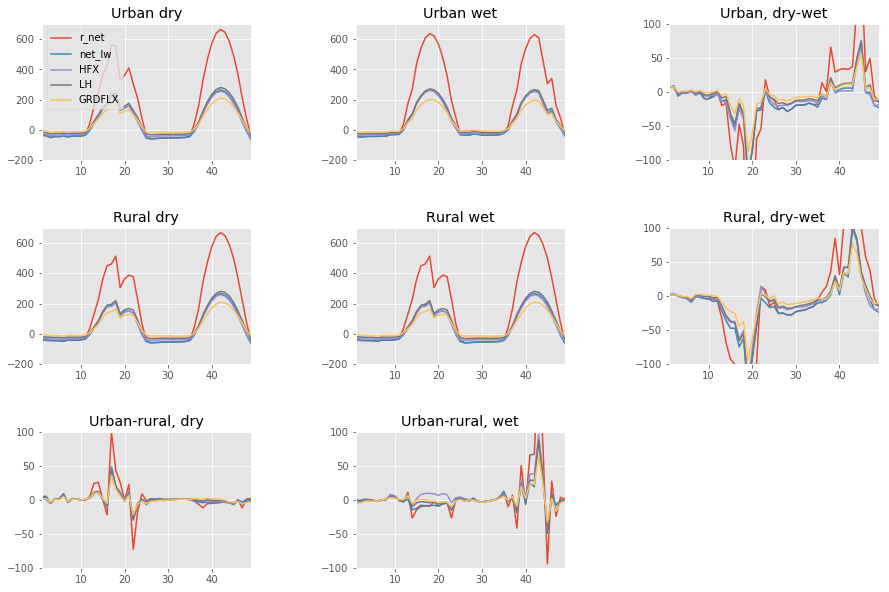

In [70]:
###### plot energy balance
fig = plt.figure(figsize = [15,10])
# plot Urban, dry day 
ax = plt.subplot(3,3,1)
ax.set_ylim([-200, 700])
urban_dryDF.plot(ax = ax, title= 'Urban dry')

# plot urban, wet 
ax2 = plt.subplot(3,3, 2)
ax2.set_ylim([-200, 700])
urban_wetDF.plot(ax = ax2, title= 'Urban wet', legend = False)

# plot urban dry- wet
ax3 = plt.subplot(3,3,3)
ax3.set_ylim([-100, 100])
(urban_dryDF - urban_wetDF).plot(ax = ax3, title = 'Urban, dry-wet', legend = False)

# plot rural, dry day
ax4 = plt.subplot(3,3,4)
ax4.set_ylim([-200, 700])
rural_dryDF.plot(ax = ax4, title= 'Rural dry', legend = False)

# plot rural, wet 
ax5= plt.subplot(3,3, 5)
ax5.set_ylim([-200, 700])
rural_dryDF.plot(ax = ax5, title= 'Rural wet', legend = False)

# plot rural dry- wet
ax6 = plt.subplot(3,3,6)
ax6.set_ylim([-100, 100])
(rural_dryDF - rural_wetDF).plot(ax = ax6, title = 'Rural, dry-wet', legend = False)

# plot urban- rural difference, dry 
ax7 = plt.subplot(3,3,7)
ax7.set_ylim([-100, 100])
(urban_dryDF - rural_dryDF).plot(ax = ax7, title = 'Urban-rural, dry', legend = False)
# plot urban-rural difference, wet 
ax8 = plt.subplot(3,3,8)
ax8.set_ylim([-100, 100])
(urban_wetDF - rural_wetDF).plot(ax = ax8, title = 'Urban-rural, wet', legend = False)

plt.subplots_adjust(wspace=0.5, hspace=0.5);

Doesn't seem to be the differences we observed in the individual days, so see if only looking at a fixed number of days fixes this

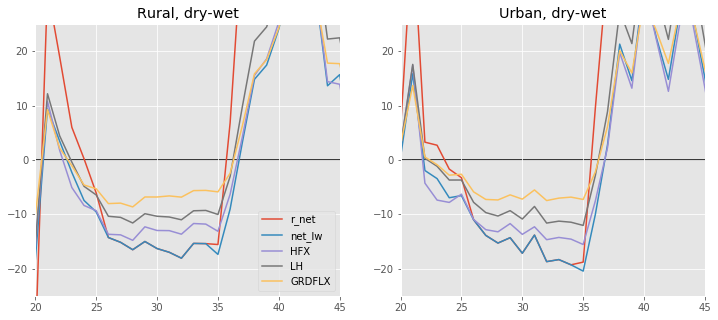

In [65]:
fig = plt.figure(figsize = [12,5])
ax = plt.subplot(1,2,1)

# plot Urban, dry day 
(rural_dryDF - rural_wetDF).plot(ax = plt.subplot(1,2,1), title = 'Rural, dry-wet', legend = False)
ax.set_xlim([20,45])
ax.set_ylim([-25,25])
ax.axhline(0, color ='k',zorder = 0)
ax.legend()
ax2 = plt.subplot(1,2,2)
(urban_dryDF - urban_wetDF).plot(ax = ax2, title = 'Urban, dry-wet', legend = False)
ax2.set_xlim([20,45])
ax2.set_ylim([-25,25])
ax2.axhline(0, color ='k',zorder = 0)
#plt.legend()

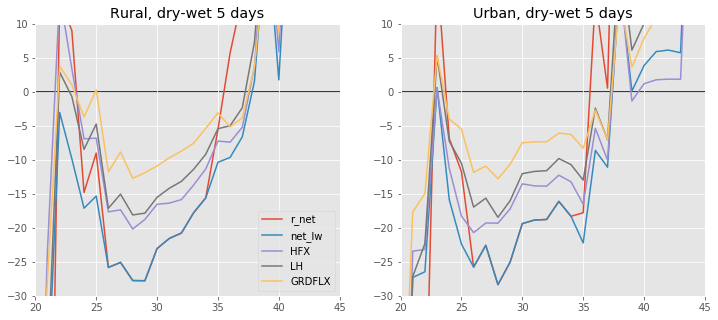

In [71]:
# 
fig = plt.figure(figsize = [12,5])
ax = plt.subplot(1,2,1)

# plot Urban, dry day 
(rural_dryDF - rural_wetDF).plot(ax = plt.subplot(1,2,1), title = 'Rural, dry-wet %s days'%X, legend = False)
ax.set_xlim([20,45])
ax.set_ylim([-30,10])
ax.axhline(0, color ='k',zorder = 0)
ax.legend()
ax2 = plt.subplot(1,2,2)
(urban_dryDF - urban_wetDF).plot(ax = ax2, title = 'Urban, dry-wet %s days'%X, legend = False)
ax2.set_xlim([20,45])
ax2.set_ylim([-30,10])
ax2.axhline(0, color ='k',zorder = 0)
#plt.legend()

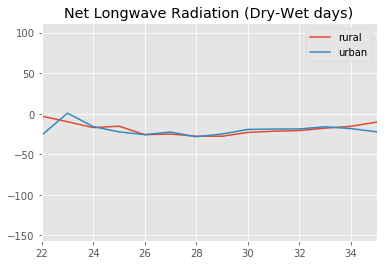

In [80]:
(rural_dryDF - rural_wetDF)['net_lw'].plot(label = 'rural')
(urban_dryDF - urban_wetDF)['net_lw'].plot(label = 'urban')
plt.legend()
plt.xlim([22, 35])
plt.title('Net Longwave Radiation (Dry-Wet days)')

In [81]:
scipy.stats.ttest_ind((rural_dryDF - rural_wetDF)['net_lw'], (urban_dryDF - urban_wetDF)['net_lw'])

Ttest_indResult(statistic=-0.051079681377509886, pvalue=0.95936815915041884)

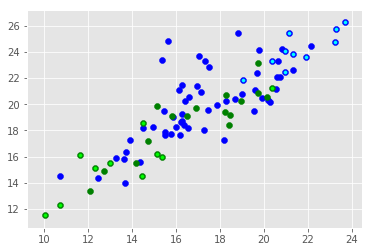

In [667]:
# wet_days = ruralDF[ruralDF.index.hour ==6 ].loc[syn[syn>3].index]['T2'].sort_values(ascending = False).index 
# dry_days = ruralDF[ruralDF.index.hour ==6 ].loc[syn[syn<=3].index]['T2'].sort_values(ascending = True).index 

plt.scatter(ruralDF['T2'].loc[wet_days+ pd.Timedelta('06:00:00')], 
           urbanDF['T2'].loc[wet_days+ pd.Timedelta('06:00:00')], color = 'blue')
plt.scatter(ruralDF['T2'].loc[dry_days+ pd.Timedelta('06:00:00')], 
           urbanDF['T2'].loc[dry_days+ pd.Timedelta('06:00:00')], color = 'green')
for wet_day in wet_days[0:10]:
    plt.scatter(ruralDF.loc[wet_day + pd.Timedelta('06:00:00'), 'T2'],
            urbanDF.loc[wet_day + pd.Timedelta('06:00:00'), 'T2'],
            marker = 'o',s = 10, color = 'cyan',zorder =3)
    
for dry_day in dry_days[0:10]: 
    plt.scatter(ruralDF.loc[dry_day + pd.Timedelta('06:00:00'), 'T2'],
            urbanDF.loc[dry_day + pd.Timedelta('06:00:00'), 'T2'],
            marker = 'o',s = 10, color = 'lime',zorder =3)
plt.xlabel('Rural Temp ($^\circ C$)')
plt.ylabel('Urban Temp ($^\circ C$)')
plt.legend(['Best fit', '1-1 line',  'all data', 'Dry', 'Moist', '%s'%str(dry_day)[5:10], '%s'%str(wet_day)[5:10], 'Aug 3'], loc = 4)


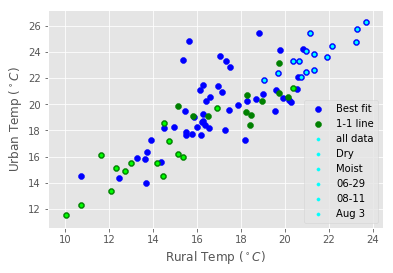

In [699]:
# compute energy balance averages for wet,dry, urban, rural
# look at same number of wet and dry days
# wet_days = ruralDF[ruralDF.index.hour ==6 ].loc[syn[syn>3].index]['T2'].sort_values(ascending = False).index 
# dry_days = ruralDF[ruralDF.index.hour ==6 ].loc[syn[syn<=3].index]['T2'].sort_values(ascending = True).index 
X = 15 
urban_dryDF = pd.DataFrame(columns=vars, index = ind)
rural_dryDF = pd.DataFrame(columns=vars, index = ind)
arr = []
arr2 = []
for var in vars:
    for day in dry_days[0:X] : 
        data = urbanDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        data2 = ruralDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        if data.shape == ind.shape : 
            arr.append(data)
            arr2.append(data2)
    urban_dryDF.loc[:,var] = np.mean(arr, axis =0)
    rural_dryDF.loc[:,var] = np.mean(arr2, axis =0)

urban_wetDF = pd.DataFrame(columns=vars, index = ind)
rural_wetDF = pd.DataFrame(columns=vars, index = ind)

arr = []
arr2 = [] # for rural data
for var in vars:
    for day in wet_days[0:X]  : 
        data = urbanDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        data2 = ruralDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        if data.shape == ind.shape : 
            arr.append(data)
            arr2.append(data2)
    urban_wetDF.loc[:,var] = np.mean(arr, axis =0)
    rural_wetDF.loc[:,var] = np.mean(arr2, axis =0)
    

plt.scatter(ruralDF['T2'].loc[wet_days+ pd.Timedelta('06:00:00')], 
           urbanDF['T2'].loc[wet_days+ pd.Timedelta('06:00:00')], color = 'blue')
plt.scatter(ruralDF['T2'].loc[dry_days+ pd.Timedelta('06:00:00')], 
           urbanDF['T2'].loc[dry_days+ pd.Timedelta('06:00:00')], color = 'green')
for wet_day in wet_days[0:X]:
    plt.scatter(ruralDF.loc[wet_day + pd.Timedelta('06:00:00'), 'T2'],
            urbanDF.loc[wet_day + pd.Timedelta('06:00:00'), 'T2'],
            marker = 'o',s = 10, color = 'cyan',zorder =3)
    
for dry_day in dry_days[0:X]: 
    plt.scatter(ruralDF.loc[dry_day + pd.Timedelta('06:00:00'), 'T2'],
            urbanDF.loc[dry_day + pd.Timedelta('06:00:00'), 'T2'],
            marker = 'o',s = 10, color = 'lime',zorder =3)
plt.xlabel('Rural Temp ($^\circ C$)')
plt.ylabel('Urban Temp ($^\circ C$)')
plt.legend(['Best fit', '1-1 line',  'all data', 'Dry', 'Moist', '%s'%str(dry_day)[5:10], '%s'%str(wet_day)[5:10], 'Aug 3'], loc = 4)


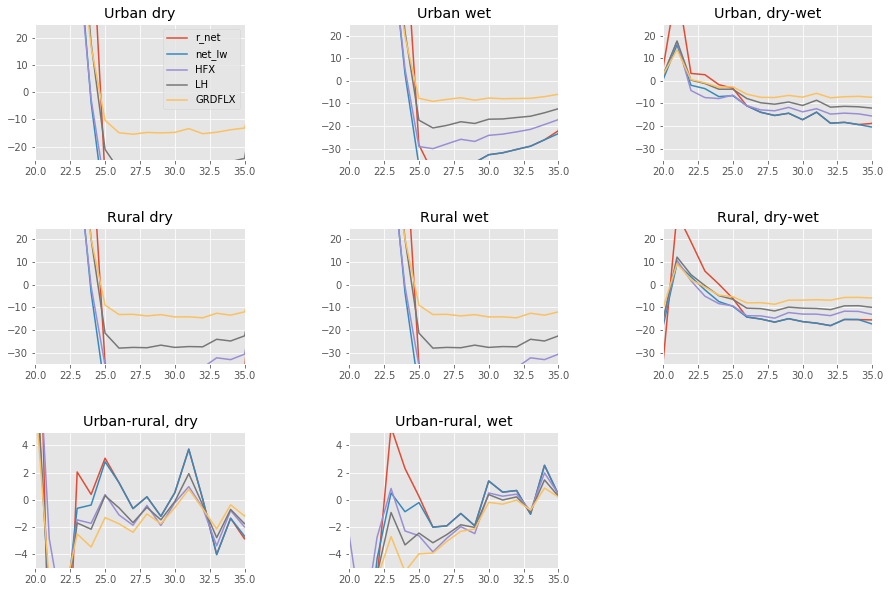

In [155]:
###### plot energy balance
###### only looking at same number of wet and dry days
# compute energy balance averages for wet,dry, urban, rural
ind = np.linspace(1,49, num=49)
varss = ['r_net', 'net_lw', 'HFX', 'LH', 'GRDFLX']
X = 15
urban_dryDF = pd.DataFrame(columns=varss, index = ind)
rural_dryDF = pd.DataFrame(columns=varss, index = ind)
arr = []
arr2 = []
for var in varss:
    for day in dry_days:#[0:X] : 
        data = urbanDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        data2 = ruralDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        if data.shape == ind.shape : 
            arr.append(data)
            arr2.append(data2)
    urban_dryDF.loc[:,var] = np.mean(arr, axis =0)
    rural_dryDF.loc[:,var] = np.mean(arr2, axis =0)

urban_wetDF = pd.DataFrame(columns=varss, index = ind)
rural_wetDF = pd.DataFrame(columns=varss, index = ind)

arr = []
arr2 = [] # for rural data
for var in varss:
    for day in wet_days:#[0:X] : 
        data = urbanDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        data2 = ruralDF[pd.to_datetime(day) - pd.Timedelta('24:00:00'):pd.to_datetime(day)+ pd.Timedelta('24:00:00')][var].values
        if data.shape == ind.shape : 
            arr.append(data)
            arr2.append(data2)
    urban_wetDF.loc[:,var] = np.mean(arr, axis =0)
    rural_wetDF.loc[:,var] = np.mean(arr2, axis =0)
    
fig = plt.figure(figsize = [15,10])
ind = np.linspace(1,49, num=49)

# plot Urban, dry day 
ax = plt.subplot(3,3,1)
urban_dryDF.plot(ax = ax, title= 'Urban dry')
ax.set_ylim([-25,25])
ax.set_xlim([20,35])

# plot urban, wet 
ax2 = plt.subplot(3,3, 2)
urban_wetDF.plot(ax = ax2, title= 'Urban wet', legend = False)
ax2.set_ylim([-35,25])
ax2.set_xlim([20,35])
# plot urban dry- wet
ax3 = plt.subplot(3,3,3)
(urban_dryDF - urban_wetDF).plot(ax = ax3, title = 'Urban, dry-wet', legend = False)
ax3.set_ylim([-35,25])
ax3.set_xlim([20,35])

# plot rural, dry day
ax4 = plt.subplot(3,3,4)
rural_dryDF.plot(ax = ax4, title= 'Rural dry', legend = False)
ax4.set_ylim([-35,25])
ax4.set_xlim([20,35])

# plot rural, wet 
ax5= plt.subplot(3,3, 5)
rural_dryDF.plot(ax = ax5, title= 'Rural wet', legend = False)
ax5.set_ylim([-35,25])
ax5.set_xlim([20,35])

# plot rural dry- wet
ax6 = plt.subplot(3,3,6)
(rural_dryDF - rural_wetDF).plot(ax = ax6, title = 'Rural, dry-wet', legend = False)
ax6.set_ylim([-35,25])
ax6.set_xlim([20,35])

# plot urban- rural difference, dry 
ax7 = plt.subplot(3,3,7)
(urban_dryDF - rural_dryDF).plot(ax = ax7, title = 'Urban-rural, dry', legend = False)
ax7.set_ylim([-5,5])
ax7.set_xlim([20,35])

# plot urban-rural difference, wet 
ax8 = plt.subplot(3,3,8)
(urban_wetDF - rural_wetDF).plot(ax = ax8, title = 'Urban-rural, wet', legend = False)
ax8.set_ylim([-5,5])
ax8.set_xlim([20,35])
plt.subplots_adjust(wspace=0.5, hspace=0.5);

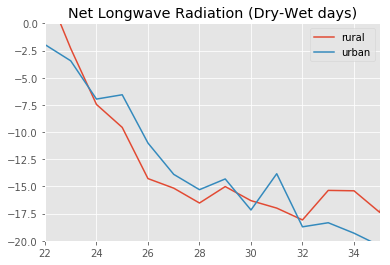

In [156]:
(rural_dryDF - rural_wetDF)['net_lw'].plot(label = 'rural')
(urban_dryDF - urban_wetDF)['net_lw'].plot(label = 'urban')
plt.legend()
plt.xlim([22, 35])
plt.ylim([-20,0])
plt.title('Net Longwave Radiation (Dry-Wet days)')

In [162]:
scipy.stats.ttest_ind((rural_dryDF - rural_wetDF)['net_lw'].loc[24:29],
                      (urban_dryDF - urban_wetDF)['net_lw'].loc[24:29])

Ttest_indResult(statistic=-0.77317300566512237, pvalue=0.45730668979485589)

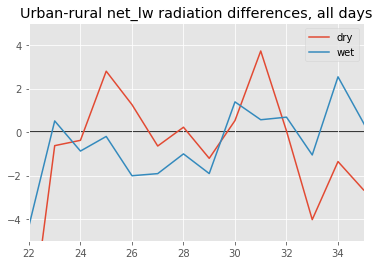

In [158]:
(urban_dryDF - rural_dryDF)['net_lw'].plot(label = 'dry')
(urban_wetDF - rural_wetDF)['net_lw'].plot(label = 'wet')
plt.axhline(0, zorder =0, color = 'k')
plt.legend()
plt.xlim([22, 35])
plt.ylim([-5,5])
plt.title('Urban-rural net_lw radiation differences, all days')

scipy.stats.ttest_ind((urban_dryDF - rural_dryDF)['net_lw'].loc[24:29], 
                      (urban_wetDF - rural_wetDF)['net_lw'].loc[24:29])

In [161]:
scipy.stats.ttest_ind((urban_dryDF - rural_dryDF)['net_lw'].loc[24:29], 
                      (urban_wetDF - rural_wetDF)['net_lw'].loc[24:29])

Ttest_indResult(statistic=2.4734317936325252, pvalue=0.032910911392958889)

In [ ]:
#for dry_day, wet_day in zip(dry_days, wet_days): 
    ###### plot days for analysis
plt.figure()
easy_scatter(ruralDF[ruralDF.index.hour ==6 ]['T2'],
             urbanDF[urbanDF.index.hour ==6 ]['T2'], 'Temperature by Synoptic Type')
plt.plot(ruralDF[ruralDF.index.hour ==6 ]['T2'],
         ruralDF[ruralDF.index.hour ==6 ]['T2'], color = 'darkslategray' )
plt.scatter(ruralDF.loc[syn[syn<=3].index]['T2'].dropna(), 
            urbanDF.loc[syn[syn<=3].index]['T2'].dropna(),color = 'blue')
plt.scatter(ruralDF.loc[syn[syn>3].index]['T2'].dropna(), 
            urbanDF.loc[syn[syn>3].index]['T2'].dropna(), color = 'green')
# plot dry
plt.xlabel('Rural Temp ($^\circ C$)')
plt.ylabel('Urban Temp ($^\circ C$)')
plt.legend(['Best fit', '1-1 line',  'all data', 'Dry', 'Moist'], loc = 4)

###### plot temperature on those days 
plt.figure(figsize=[12,6])
# plot temperature 
ax = plt.subplot(221)
urbanDF['T2'][pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)].plot(ax = ax)
ruralDF['T2'][pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)].plot(ax = ax)
plt.legend(['Urban', 'Rural'])
plt.title('Dry Day')
plt.ylim([285,310])
plt.ylabel('Temperature ($^\circ$)')

ax2 = plt.subplot(222)
urbanDF['T2'][pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)].plot(ax = ax2)
ruralDF['T2'][pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)].plot(ax = ax2)

plt.legend(['Urban', 'Rural'])
plt.title('Moist Day')
plt.ylim([285,310])
plt.ylabel('Temperature ($^\circ$)')

###### plot energy balance
fig = plt.figure(figsize = [15,10])
# plot Urban, dry day 
#day = '2016-08-22'
ax = plt.subplot(3,3,1)
urbanDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].plot(ax = ax, title = 'Urban, dry')
ax.set_ylim([-200, 700])
# plot urban, wet 
#day = '2016-07-18'
ax2 = plt.subplot(3,3, 2)
urbanDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].plot(ax = ax2, title = 'Urban, wet', legend = False)
ax2.set_ylim([-200, 700])

# plot urban dry- wet
ax3 = plt.subplot(3,3,3)
urbanDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].subtract(urbanDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].values).plot(ax = ax3, title = 'Urban, dry-wet', legend = False)
ax3.set_ylim([-500, 100])

# plot rural, dry day
#day = '2016-08-22'
ax4 = plt.subplot(3,3,4)
ruralDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].plot(ax = ax4, title = 'Rural, dry', legend = False)
ax4.set_ylim([-200, 700])

# plot rural, wet day 
#day = '2016-07-18'
ax5 = plt.subplot(3,3,5)
ruralDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].plot(ax = ax5, title = 'Rural, wet', legend = False)
ax5.set_ylim([-200, 700])

# plot rural dry- wet
ax6 = plt.subplot(3,3,6)
ruralDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].subtract(ruralDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].values).plot(ax = ax6, title = 'Rural, dry-wet', legend = False)
ax3.set_ylim([-500, 100])

# plot urban- rural difference, dry 
ax7 = plt.subplot(3,3,7)
urbanDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars].subtract(ruralDF[pd.to_datetime(dry_day) - pd.Timedelta('24:00:00'):pd.to_datetime(dry_day)+ pd.Timedelta('12:00:00')][vars]).plot(ax = ax7, title = 'Urban- Rural, dry', legend = False)
ax7.set_ylim([-500, 500])

# plot urban-rural difference, wet 
ax8 = plt.subplot(3,3,8)
urbanDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars].subtract(ruralDF[pd.to_datetime(wet_day) - pd.Timedelta('24:00:00'):pd.to_datetime(wet_day)+ pd.Timedelta('12:00:00')][vars]).plot(ax = ax8, title = 'Urban- Rural, wet', legend = False)
ax8.set_ylim([-500, 500])

plt.subplots_adjust(wspace=0.5, hspace=0.5);


########plot day night temp distribution 
for day, name in zip([wet_day, dry_day], ['Wet', 'Dry']) : 
    fig, ax = plt.subplots(ncols = 2, figsize = [15,5])
    t1 = xr.open_dataset(fpath+'%s/%s/wrfout_d01_%s_10:00:00'%(exp, dom, str(day)[0:10]))
    (t1.T2-273.15).plot(ax=ax[0])
    ax[0].set_title(name+ " Night (" +ax[0].get_title()[7:]+")")

    t2 = xr.open_dataset(fpath+'%s/%s/wrfout_d01_%s_20:00:00'%(exp, dom, str(day)[0:10]))
    (t2.T2-273.15).plot(ax=ax[1])
    ax[1].set_title(name+ " Day ("+ ax[1].get_title()[7:]+")")

# temp UHI relationships

UCM2D
BEM2D+SST
No data for BEM2D+SST
BEM2D
No data for BEM2D
UCM
BEM+SST
No data for BEM+SST
BEM
No data for BEM
UCM2D+SST
UCM+SST
No data for UCM+SST


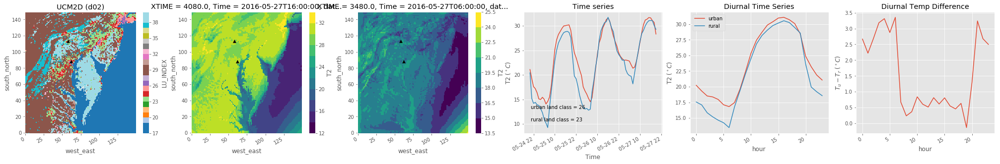

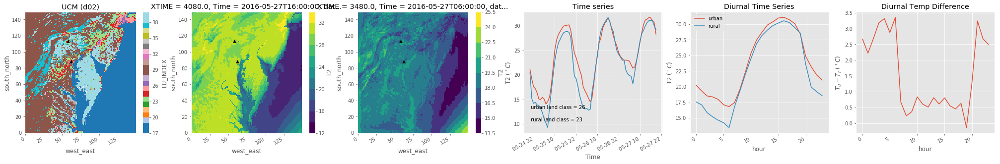

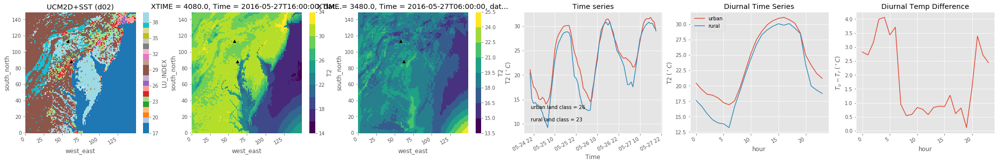

In [114]:
#analysis_points
# west_east
pts =pd.DataFrame([[62, 58], # west_east
                   [88, 113]])
# urban south_north = 88, west_east = 62
# rural south_north = 113, west_east = 58
# loop over experiments and plot UHI
import os 
import wrf
from wrf import ALL_TIMES
fpath = '/Users/ascott47/mountpoint/wrf/out/'
dom = 'd02'
dirs = os.listdir(fpath)
date = '2016-05-27' 
for exp in dirs: 
    print(exp)
    files = list(np.sort(glob.glob(fpath+'%s/%s/wrfout_*'%(exp, dom))))[0:72]#[2150-14-24: 2150-14+120]
    #files = list(np.sort(glob.glob('/Users/ascott47/mountpoint/wrf/run/2way/%s/wrfout_%s*'%(exp,dom))))
    if files:
    #files = list(np.sort(glob.glob(fpath+'%s/d01/wrfout_*'%exp)))
            # open dataset
        test_list = []
        for file in files:
            test_list.append(Dataset(file))
        df = getvar(test_list, varname = "T2", 
                      timeidx = wrf.ALL_TIMES, 
                      method = 'cat'
                      )
        # convert to degrees C
        df = df - 273.15
        # convert to local time
        df['Time'] = df['Time'] - pd.Timedelta('04:00:00')
        # select analysis points
        #pts = wrf.ll_to_xy(test_list[-1],analysis_points['location:Latitude'], analysis_points['location:Longitude'])
        # points[0] is the lat coordinates
        # points[1] is the lon coordinate
        # urban, rural
        fig, axes = plt.subplots(ncols=6, figsize = [35,5])
        i = 0
        # plot landcover
        lc = getvar(test_list[-1], "LU_INDEX")
        lc.plot(levels = 24, cmap  = cm.tab20, ax = axes[i])
        axes[i].set_title('%s (%s)'%(exp, dom))
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # make map day 
        df.sel(Time = date +'T16:00:00').plot(ax = axes[i], levels = 11)
        #axes[i].set_title('Night (%s 4am)'%date)
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # make map night 
        df.sel(Time = date+'T6:00:00').plot(ax = axes[i], levels = 11)
        #axes[i].set_title('Day (%s 4pm)'%date)
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # plot temp time series
#         urban = df.isel(south_north= points.values[0][0], west_east = points.values[1][0])
#         rural = df.isel(south_north= points.values[0][1], west_east = points.values[1][1])
        urban = df.isel(west_east = pts.values[0], south_north = pts.values[1])[:,0,0]
        rural = df.isel(west_east = pts.values[0], south_north = pts.values[1])[:,1,1]
        urban_lc = lc.isel(west_east = pts.values[0], south_north = pts.values[1])[0,0]
        rural_lc = lc.isel(west_east = pts.values[0], south_north = pts.values[1])[1,1]
        urban.plot(ax = axes[i])
        rural.plot(ax = axes[i])
        axes[i].set_title('Time series')
        axes[i].set_ylabel('T2 ($^\circ C$)')
        axes[i].annotate('urban land class = %i'%urban_lc,( .05,.2), xycoords = 'axes fraction')
        axes[i].annotate('rural land class = %i'%rural_lc,( .05,.1), xycoords = 'axes fraction')
        i = i+1
        # plot diurnal temp cycle
        urban.groupby('Time.hour').mean().plot(ax = axes[i], label = 'urban')
        rural.groupby('Time.hour').mean().plot(ax = axes[i], label = 'rural')
        axes[i].legend()
        axes[i].set_title('Diurnal Time Series')
        axes[i].set_ylabel('T2 ($^\circ C$)')
        i = i+1
        # plot DT in time
        (urban-rural).groupby('Time.hour').mean().plot(ax = axes[i])
        axes[i].set_ylabel('$T_u - T_r$ ($^\circ C$)')
        axes[i].set_title('Diurnal Temp Difference')
        plt.savefig('figures/%swrfUHI%s2.png'%(exp, dom))
        
        for ds in test_list: 
            ds.close()
    else:  
        print('No data for %s'%exp)

# repeat for 2-way nesting

In [ ]:
# do the same for 2 way nesting
dirs = os.listdir('/Users/ascott47/mountpoint/wrf/run/2way/')
dom = 'd03'
date = '2016-05-27' 
pts =pd.DataFrame([ [85,87],#west_east
                   [140, 109] ]) # south_north
# rural analysis points; south_north = 140, west_east = 85
# urban analysis points: south_north = 109, west_east = 87])
for exp in dirs: 
    print(exp)
    files = list(np.sort(glob.glob('/Users/ascott47/mountpoint/wrf/run/2way/%s/wrfout_%s*'%(exp,dom))))
    if files:
    #files = list(np.sort(glob.glob(fpath+'%s/d01/wrfout_*'%exp)))
            # open dataset
        test_list = []
        for file in files:
            test_list.append(Dataset(file))
        df = getvar(test_list, varname = "T2", 
                      timeidx = wrf.ALL_TIMES, 
                      method = 'cat'
                      )
        # convert to degrees C
        df = df - 273.15
        # convert to local time
        df['Time'] = df['Time'] - pd.Timedelta('04:00:00')
        # select analysis points
        #points = wrf.ll_to_xy(Dataset(file), analysis_points['location:Latitude'], analysis_points['location:Longitude'])
        #pts = wrf.ll_to_xy(test_list[-1],analysis_points['location:Latitude'], analysis_points['location:Longitude'])
        # points[0] is the lat coordinates
        # points[1] is the lon coordinate
        # urban, rural
        fig, axes = plt.subplots(ncols=6, figsize = [35,5])
        i = 0
        # plot landcover
        lc = getvar(test_list[-1], "LU_INDEX")
        lc.plot(levels = 24, cmap  = cm.tab20, ax = axes[i])
        axes[i].set_title('%s (%s)'%(exp, dom))
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # make map day 
        try: 
            df.sel(Time = date +'T16:00:00').plot(ax = axes[i], levels = 11)
        except: 
            df.sel(Time = '2016-05-26' +'T16:00:00').plot(ax = axes[i], levels = 11)
        #axes[i].set_title('Night (%s 4am)'%date)
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # make map night 
        df.sel(Time = date+'T6:00:00').plot(ax = axes[i], levels = 11)
            
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # plot temp time series
#         urban = df.isel(south_north= points.values[0][0], west_east = points.values[1][0])
#         rural = df.isel(south_north= points.values[0][1], west_east = points.values[1][1])
        urban = df.isel(west_east = pts.values[0], south_north = pts.values[1])[:,0,0]
        rural = df.isel(west_east = pts.values[0], south_north = pts.values[1])[:,1,1]
        urban_lc = lc.isel(west_east = pts.values[0], south_north = pts.values[1])[0,0]
        rural_lc = lc.isel(west_east = pts.values[0], south_north = pts.values[1])[1,1]
        urban.plot(ax = axes[i])
        rural.plot(ax = axes[i])
        axes[i].set_title('Time series')
        axes[i].set_ylabel('T2 ($^\circ C$)')
        axes[i].annotate('urban land class = %i'%urban_lc,( .05,.2), xycoords = 'axes fraction')
        axes[i].annotate('rural land class = %i'%rural_lc,( .05,.1), xycoords = 'axes fraction')
        i = i+1
        # plot diurnal temp cycle
        urban.groupby('Time.hour').mean().plot(ax = axes[i], label = 'urban')
        rural.groupby('Time.hour').mean().plot(ax = axes[i], label = 'rural')
        axes[i].legend()
        axes[i].set_title('Diurnal Time Series')
        axes[i].set_ylabel('T2 ($^\circ C$)')
        i = i+1
        # plot DT in time
        (urban-rural).groupby('Time.hour').mean().plot(ax = axes[i])
        axes[i].set_ylabel('$T_u - T_r$ ($^\circ C$)')
        axes[i].set_title('Diurnal Temp Difference')
        plt.savefig('figures/%s2waynestwrfUHI%s%s2.png'%(exp, dom,date))
    else:  
        print('No data for %s'%exp)

# spot check UHIs

BEM2D+SST
BEM2D
No files for : BEM2D
BEM+SST
No files for : BEM+SST
BEM
No files for : BEM


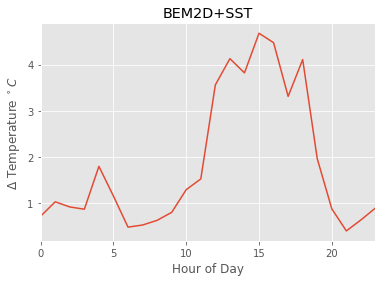

In [65]:
# loop over all 2-way experiments, check UHI
import os 
dirs = os.listdir('/Users/ascott47/mountpoint/wrf/run/2way/')
for exp in dirs: 
    print(exp)
    files = list(np.sort(glob.glob('/Users/ascott47/mountpoint/wrf/run/2way/%s/wrfout_d03*'%exp)))
    urban_temps = np.ones(len(files))
    rural_temps = np.ones(len(files))
    times = []
    i = 0
    toc = time.time()
    if files:
        for file in files: 
            ncfile = nc(file, 'r')
            urban_temps[i] = ncfile.variables['T2'][:,urban_location[1],urban_location[0]]
            rural_temps[i] = ncfile.variables['T2'][:,rural_location[1],rural_location[0]]
            times.append(file[-19:])
            ncfile.close()
            i = i+1

        temp = pd.DataFrame([], index = pd.to_datetime(times, format = '%Y-%m-%d_%H:%M:%S')- pd.Timedelta('04:00:00'))
        temp['urban_wrf'] = urban_temps -273.15
        temp['rural_wrf'] = rural_temps -273.15
        temp['deltat_wrf'] = temp['urban_wrf'] - temp['rural_wrf']
        plt.figure()
        temp['deltat_wrf'].groupby(temp.index.hour).mean().plot(title = '%s'%exp)
        plt.xlabel('Hour of Day')
        plt.ylabel('$\Delta $ Temperature $^\circ C$')
        plt.savefig('figures/diurnal_DT_%s.png'%exp)
    else: 
        print('No files for : %s'%exp)

BEM2D+SST
No files for : BEM2D+SST
BEM2D
No files for : BEM2D
UCM
BEM+SST
No files for : BEM+SST
BEM
No files for : BEM
UCM2D+SST
UCM+SST
No files for : UCM+SST


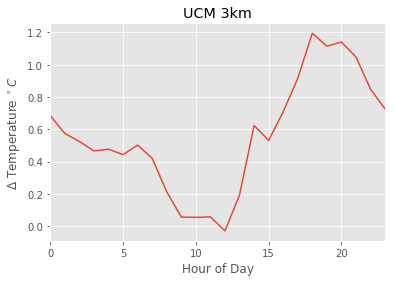

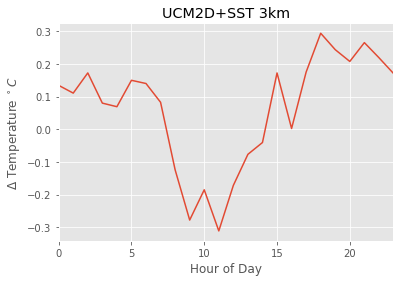

In [78]:
# loop over all 2-way experiments, check UHI
import os 
fpath = '/Users/ascott47/mountpoint/wrf/out/'
dirs = os.listdir(fpath)
for exp in dirs[1:]: 
    print(exp)
    files = list(np.sort(glob.glob(fpath+'%s/d02/wrfout_*'%exp)))
    if files:
        # calculate urban_location, rural_location 
        t2 = getvar(nc(files[0], 'r'), "T2")
        df = t2.to_dataframe()
        tree = scipy.spatial.KDTree(df[['XLONG', 'XLAT']].values, leafsize = 100)
        # urban 
        results = tree.query(analysis_points.loc['urban'].values, k = 5, distance_upper_bound=1) # lookup closest points; returns first row as distance and second row as index
        urban_location = df.iloc[results[1][0]].name # get the 'name', or coordinate location, of the points
        # rural
        results = tree.query(analysis_points.loc['rural'].values, k = 5, distance_upper_bound=1) # lookup closest points; returns first row as distance and second row as index
        rural_location = df.iloc[results[1][0]].name # get the 'name', or coordinate location, of the points

        urban_temps = np.ones(len(files))
        rural_temps = np.ones(len(files))

        times = []
        i = 0
        toc = time.time()
    
        for file in files: 
            ncfile = nc(file, 'r')
            urban_temps[i] = ncfile.variables['T2'][:,urban_location[1],urban_location[0]]
            rural_temps[i] = ncfile.variables['T2'][:,rural_location[1],rural_location[0]]
            times.append(file[-19:])
            ncfile.close()
            i = i+1

        temp = pd.DataFrame([], index = pd.to_datetime(times, format = '%Y-%m-%d_%H:%M:%S')- pd.Timedelta('04:00:00'))
        temp['urban_wrf'] = urban_temps -273.15
        temp['rural_wrf'] = rural_temps -273.15
        temp['deltat_wrf'] = temp['urban_wrf'] - temp['rural_wrf']
        plt.figure()
        temp['deltat_wrf'].groupby(temp.index.hour).mean().plot(title = '%s 3km'%exp)
        plt.xlabel('Hour of Day')
        plt.ylabel('$\Delta $ Temperature $^\circ C$')
        plt.savefig('figures/diurnal_DT_%s_3km.png'%exp)
    else: 
        print('No files for : %s'%exp)

BEM2D+SST
No files for : BEM2D+SST
BEM2D
No files for : BEM2D
UCM
BEM+SST
No files for : BEM+SST
BEM
No files for : BEM
UCM2D+SST
UCM+SST


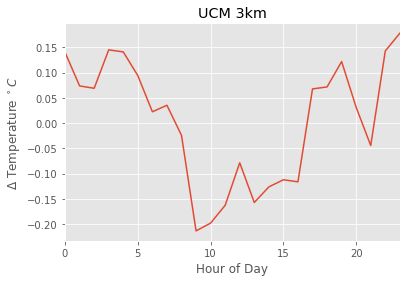

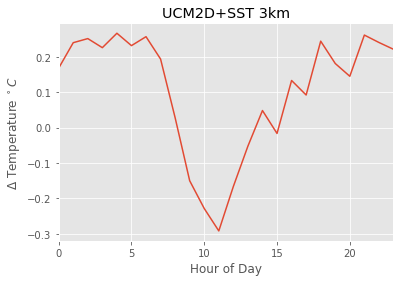

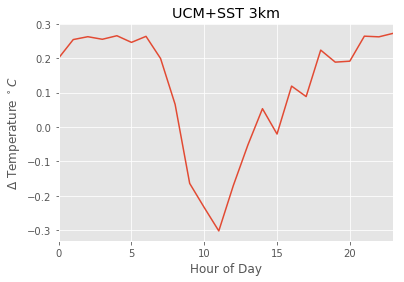

In [79]:
# loop over all 2-way experiments, check UHI
import os 
fpath = '/Users/ascott47/mountpoint/wrf/out/'
dirs = os.listdir(fpath)
res = '5km'
for exp in dirs[1:]: 
    print(exp)
    files = list(np.sort(glob.glob(fpath+'%s/d01/wrfout_*'%exp)))
    if files:
        # calculate urban_location, rural_location 
        t2 = getvar(nc(files[0], 'r'), "T2")
        df = t2.to_dataframe()
        tree = scipy.spatial.KDTree(df[['XLONG', 'XLAT']].values, leafsize = 100)
        # urban 
        results = tree.query(analysis_points.loc['urban'].values, k = 5, distance_upper_bound=1) # lookup closest points; returns first row as distance and second row as index
        urban_location = df.iloc[results[1][0]].name # get the 'name', or coordinate location, of the points
        # rural
        results = tree.query(analysis_points.loc['rural'].values, k = 5, distance_upper_bound=1) # lookup closest points; returns first row as distance and second row as index
        rural_location = df.iloc[results[1][0]].name # get the 'name', or coordinate location, of the points

        urban_temps = np.ones(len(files))
        rural_temps = np.ones(len(files))

        times = []
        i = 0
        toc = time.time()
    
        for file in files: 
            ncfile = nc(file, 'r')
            urban_temps[i] = ncfile.variables['T2'][:,urban_location[1],urban_location[0]]
            rural_temps[i] = ncfile.variables['T2'][:,rural_location[1],rural_location[0]]
            times.append(file[-19:])
            ncfile.close()
            i = i+1

        temp = pd.DataFrame([], index = pd.to_datetime(times, format = '%Y-%m-%d_%H:%M:%S')- pd.Timedelta('04:00:00'))
        temp['urban_wrf'] = urban_temps -273.15
        temp['rural_wrf'] = rural_temps -273.15
        temp['deltat_wrf'] = temp['urban_wrf'] - temp['rural_wrf']
        plt.figure()
        temp['deltat_wrf'].groupby(temp.index.hour).mean().plot(title = '%s 3km'%exp)
        plt.xlabel('Hour of Day')
        plt.ylabel('$\Delta $ Temperature $^\circ C$')
        plt.savefig('figures/diurnal_DT_%s_%s.png'%(exp, res))
    else: 
        print('No files for : %s'%exp)

UCM2D
BEM2D+SST
No data for BEM2D+SST
BEM2D
No data for BEM2D
UCM
BEM+SST
No data for BEM+SST
BEM
No data for BEM
UCM2D+SST
UCM+SST
No data for UCM+SST


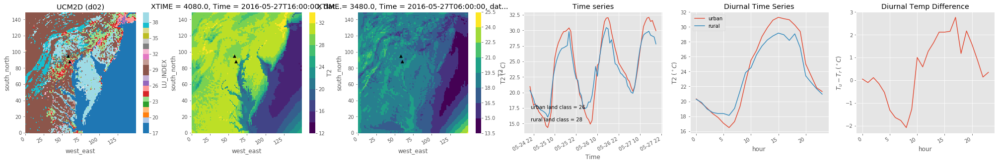

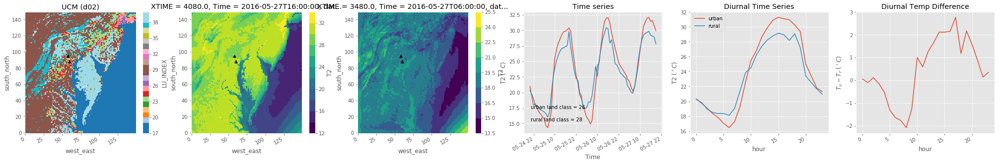

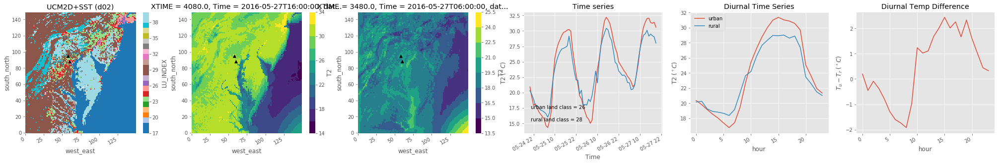

In [46]:
# analysis_points = meta.loc[[urban,rural]][['location:Longitude', 'location:Latitude']]
# analysis_points = meta.loc[[urban,rural]][['location:Longitude', 'location:Latitude']]
# analysis_points.index = ['urban', 'rural']
# #analysis_points

# loop over experiments and plot UHI
import os 
import wrf
from wrf import ALL_TIMES
fpath = '/Users/ascott47/mountpoint/wrf/out/'
dom = 'd02'
dirs = os.listdir(fpath)
date = '2016-05-27' 
for exp in dirs: 
    print(exp)
    files = list(np.sort(glob.glob(fpath+'%s/%s/wrfout_*'%(exp, dom))))[0:72]#[2150-14-24: 2150-14+120]
    #files = list(np.sort(glob.glob('/Users/ascott47/mountpoint/wrf/run/2way/%s/wrfout_%s*'%(exp,dom))))
    if files:
    #files = list(np.sort(glob.glob(fpath+'%s/d01/wrfout_*'%exp)))
            # open dataset
        test_list = []
        for file in files:
            test_list.append(Dataset(file))
        df = getvar(test_list, varname = "T2", 
                      timeidx = wrf.ALL_TIMES, 
                      method = 'cat'
                      )
        # convert to degrees C
        df = df - 273.15
        # convert to local time
        df['Time'] = df['Time'] - pd.Timedelta('04:00:00')
        # select analysis points
        pts = wrf.ll_to_xy(test_list[-1],analysis_points['location:Latitude'], analysis_points['location:Longitude'])
        # points[0] is the lat coordinates
        # points[1] is the lon coordinate
        # urban, rural
        fig, axes = plt.subplots(ncols=6, figsize = [35,5])
        i = 0
        # plot landcover
        lc = getvar(test_list[-1], "LU_INDEX")
        lc.plot(levels = 24, cmap  = cm.tab20, ax = axes[i])
        axes[i].set_title('%s (%s)'%(exp, dom))
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # make map day 
        df.sel(Time = date +'T16:00:00').plot(ax = axes[i], levels = 11)
        #axes[i].set_title('Night (%s 4am)'%date)
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # make map night 
        df.sel(Time = date+'T6:00:00').plot(ax = axes[i], levels = 11)
        #axes[i].set_title('Day (%s 4pm)'%date)
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # plot temp time series
#         urban = df.isel(south_north= points.values[0][0], west_east = points.values[1][0])
#         rural = df.isel(south_north= points.values[0][1], west_east = points.values[1][1])
        urban = df.isel(west_east = pts.values[0], south_north = pts.values[1])[:,0,0]
        rural = df.isel(west_east = pts.values[0], south_north = pts.values[1])[:,1,1]
        urban_lc = lc.isel(west_east = pts.values[0], south_north = pts.values[1])[0,0]
        rural_lc = lc.isel(west_east = pts.values[0], south_north = pts.values[1])[1,1]
        urban.plot(ax = axes[i])
        rural.plot(ax = axes[i])
        axes[i].set_title('Time series')
        axes[i].set_ylabel('T2 ($^\circ C$)')
        axes[i].annotate('urban land class = %i'%urban_lc,( .05,.2), xycoords = 'axes fraction')
        axes[i].annotate('rural land class = %i'%rural_lc,( .05,.1), xycoords = 'axes fraction')
        i = i+1
        # plot diurnal temp cycle
        urban.groupby('Time.hour').mean().plot(ax = axes[i], label = 'urban')
        rural.groupby('Time.hour').mean().plot(ax = axes[i], label = 'rural')
        axes[i].legend()
        axes[i].set_title('Diurnal Time Series')
        axes[i].set_ylabel('T2 ($^\circ C$)')
        i = i+1
        # plot DT in time
        (urban-rural).groupby('Time.hour').mean().plot(ax = axes[i])
        axes[i].set_ylabel('$T_u - T_r$ ($^\circ C$)')
        axes[i].set_title('Diurnal Temp Difference')
        plt.savefig('figures/%swrfUHI%s.png'%(exp, dom))
        
        for ds in test_list: 
            ds.close()
    else:  
        print('No data for %s'%exp)

BEM2D+SST
BEM2D
No data for BEM2D
BEM+SST
No data for BEM+SST
BEM
No data for BEM


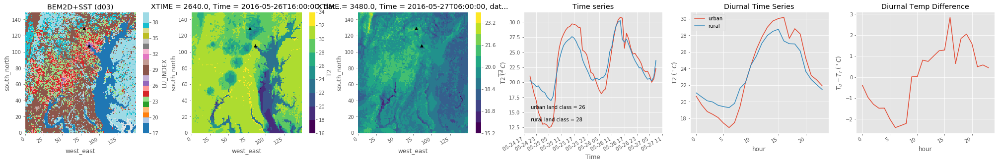

In [49]:
# do the same for 2 way nesting
dirs = os.listdir('/Users/ascott47/mountpoint/wrf/run/2way/')
dom = 'd03'
date = '2016-05-27' 

for exp in dirs: 
    print(exp)
    files = list(np.sort(glob.glob('/Users/ascott47/mountpoint/wrf/run/2way/%s/wrfout_%s*'%(exp,dom))))
    if files:
    #files = list(np.sort(glob.glob(fpath+'%s/d01/wrfout_*'%exp)))
            # open dataset
        test_list = []
        for file in files:
            test_list.append(Dataset(file))
        df = getvar(test_list, varname = "T2", 
                      timeidx = wrf.ALL_TIMES, 
                      method = 'cat'
                      )
        # convert to degrees C
        df = df - 273.15
        # convert to local time
        df['Time'] = df['Time'] - pd.Timedelta('04:00:00')
        # select analysis points
        #points = wrf.ll_to_xy(Dataset(file), analysis_points['location:Latitude'], analysis_points['location:Longitude'])
        pts = wrf.ll_to_xy(test_list[-1],analysis_points['location:Latitude'], analysis_points['location:Longitude'])
        # points[0] is the lat coordinates
        # points[1] is the lon coordinate
        # urban, rural
        fig, axes = plt.subplots(ncols=6, figsize = [35,5])
        i = 0
        # plot landcover
        lc = getvar(test_list[-1], "LU_INDEX")
        lc.plot(levels = 24, cmap  = cm.tab20, ax = axes[i])
        axes[i].set_title('%s (%s)'%(exp, dom))
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # make map day 
        try: 
            df.sel(Time = date +'T16:00:00').plot(ax = axes[i], levels = 11)
        except: 
            df.sel(Time = '2016-05-26' +'T16:00:00').plot(ax = axes[i], levels = 11)
        #axes[i].set_title('Night (%s 4am)'%date)
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # make map night 
        df.sel(Time = date+'T6:00:00').plot(ax = axes[i], levels = 11)
            
        axes[i].scatter(pts.values[0], pts.values[1], marker = '^', color = 'k')
        i = i+1
        # plot temp time series
#         urban = df.isel(south_north= points.values[0][0], west_east = points.values[1][0])
#         rural = df.isel(south_north= points.values[0][1], west_east = points.values[1][1])
        urban = df.isel(west_east = pts.values[0], south_north = pts.values[1])[:,0,0]
        rural = df.isel(west_east = pts.values[0], south_north = pts.values[1])[:,1,1]
        urban_lc = lc.isel(west_east = pts.values[0], south_north = pts.values[1])[0,0]
        rural_lc = lc.isel(west_east = pts.values[0], south_north = pts.values[1])[1,1]
        urban.plot(ax = axes[i])
        rural.plot(ax = axes[i])
        axes[i].set_title('Time series')
        axes[i].set_ylabel('T2 ($^\circ C$)')
        axes[i].annotate('urban land class = %i'%urban_lc,( .05,.2), xycoords = 'axes fraction')
        axes[i].annotate('rural land class = %i'%rural_lc,( .05,.1), xycoords = 'axes fraction')
        i = i+1
        # plot diurnal temp cycle
        urban.groupby('Time.hour').mean().plot(ax = axes[i], label = 'urban')
        rural.groupby('Time.hour').mean().plot(ax = axes[i], label = 'rural')
        axes[i].legend()
        axes[i].set_title('Diurnal Time Series')
        axes[i].set_ylabel('T2 ($^\circ C$)')
        i = i+1
        # plot DT in time
        (urban-rural).groupby('Time.hour').mean().plot(ax = axes[i])
        axes[i].set_ylabel('$T_u - T_r$ ($^\circ C$)')
        axes[i].set_title('Diurnal Temp Difference')
        plt.savefig('figures/%s2waynestwrfUHI%s%s.png'%(exp, dom,date))
    else:  
        print('No data for %s'%exp)

,location:Longitude,location:Latitude
urban,NaN,NaN
rural,NaN,NaN


# BEM 2D + SST

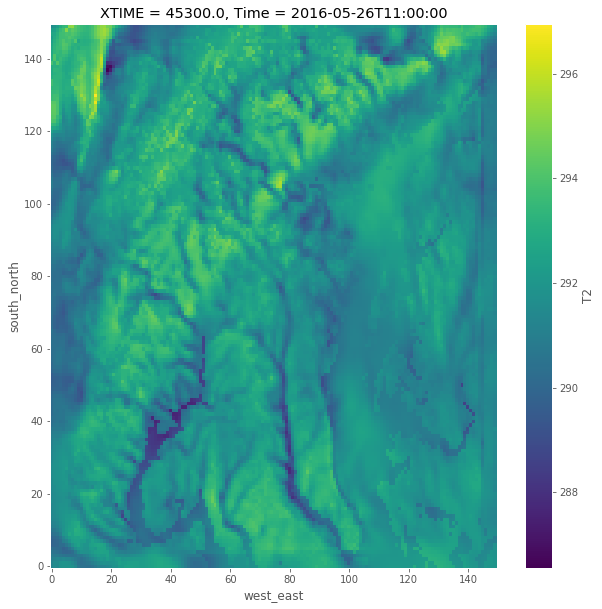

In [31]:
ncfile = Dataset('/Users/ascott47/mountpoint/wrf/run/2way/BEM2D+SST/wrfout_d03_2016-05-26_11:00:00') # 10am UTC is 6am local
sh = getvar(ncfile, "T2")
sh.plot(figsize = [10,10])

In [36]:
# read in files 
files = list(np.sort(glob.glob('/Users/ascott47/mountpoint/wrf/run/2way/BEM2D+SST/wrfout_d03*')))
urban_temps = np.ones(len(files))
rural_temps = np.ones(len(files))

times = []
i = 0
toc = time.time()
for file in files: 
    ncfile = nc(file, 'r')
    urban_temps[i] = ncfile.variables['T2'][:,urban_location[1],urban_location[0]]
    rural_temps[i] = ncfile.variables['T2'][:,rural_location[1],rural_location[0]]

    times.append(file[-19:])
    ncfile.close()
    i = i+1
print time.time() -toc

19.028922081


In [44]:
temp = pd.DataFrame([], index = pd.to_datetime(times, format = '%Y-%m-%d_%H:%M:%S'))
temp['urban_wrf'] = urban_temps -273.15
temp['rural_wrf'] = rural_temps -273.15
# temp['urban_obs'] = tempDF[urban]
# temp['rural_obs'] = tempDF[rural]

temp['deltat_wrf'] = temp['urban_wrf'] - temp['rural_wrf']
#temp['deltat_obs'] = temp['urban_obs'] - temp['rural_obs']
#temp.to_csv('wrfanalysis.csv')
temp.index = temp.index - pd.Timedelta('04:00:00')
temp.head()

,urban_wrf,rural_wrf,deltat_wrf
2016-05-24 20:00:00,23.444635,23.666681,-0.222046
2016-05-24 21:00:00,21.218927,21.047784,0.171143
2016-05-24 22:00:00,20.885797,20.269800,0.615997
2016-05-24 23:00:00,19.643976,19.281366,0.362610
2016-05-25 00:00:00,18.745996,18.690149,0.055847


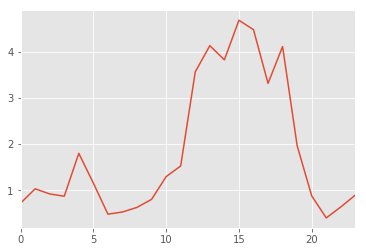

In [45]:
temp['deltat_wrf'].groupby(temp.index.hour).mean().plot()

# UCM 
similar to the old UCM runs but only with NLCD instead of MODIS land use

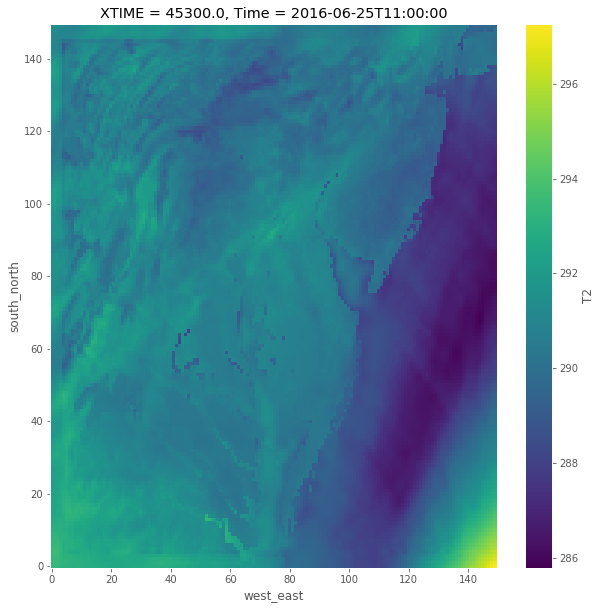

In [26]:
ncfile = Dataset('/Users/ascott47/mountpoint/wrf/out/UCM/d02/wrfout_d01_2016-06-25_11:00:00') # 10am UTC is 6am local
sh = getvar(ncfile, "T2")
sh.plot(figsize = [10,10])

In [15]:
# plot snapshot of nighttime temp

In [ ]:
# plot UHI 
fig,ax = plt.subplots(1,2, sharex=True, figsize = [15,5])
# observations
rur = np.where(selected_locations[:,0] > 125)[0]
urb = np.where(selected_locations[:,0] <= 108)[0]
diurnal_r = np.ones([23, rur.shape[0]])
diurnal_u = np.ones([23, urb.shape[0]])
for i in range(0,23): 
    diurnal_r[i,:] = obs_temp[obs_temp.indexes['time'].hour == i, rur].mean(axis=0)
    diurnal_u[i,:] = obs_temp[obs_temp.indexes['time'].hour == i, urb].mean(axis=0)
handle = ax[0].plot(diurnal_u, label = 'obs')
ax[0].plot(np.nanmean(diurnal_u,axis =1), linewidth = 3, color = 'r')
handle = ax[0].plot(diurnal_r, label = 'obs')
ax[0].plot(np.nanmean(diurnal_r,axis =1), linewidth = 3, color = 'b')
ax[0].set_title('Observations')
ax[0].set_ylim

diurnal_r = np.ones([23, rur.shape[0]])
diurnal_u = np.ones([23, urb.shape[0]])
for i in range(0,23): 
    diurnal_r[i,:] = wrf_temp[wrf_temp.indexes['time'].hour == i, rur].mean(axis=0)
    diurnal_u[i,:] = wrf_temp[wrf_temp.indexes['time'].hour == i, urb].mean(axis=0)
handle = ax[1].plot(diurnal_u, label = 'obs')
ax[1].plot(np.nanmean(diurnal_u,axis =1), linewidth = 3, color = 'r')
handle = ax[1].plot(diurnal_r, label = 'obs')
ax[1].plot(np.nanmean(diurnal_r,axis =1), linewidth = 3, color = 'b')
ax[1].set_title('WRF')

In [ ]:
# map mean differences with wrf
rur = np.where(selected_locations[:,0] > 125)[0]
urb = np.where(selected_locations[:,0] <= 108)[0]

hour = 6
col = (obs_temp[obs_temp.indexes['time'].hour == hour] -wrf_temp[wrf_temp.indexes['time'].hour ==hour]).mean(dim = 'time')
(t2-273.15).plot()
plt.xlim([50,115])
plt.ylim([100,140])
plt.scatter( selected_locations[:,1][urb],selected_locations[:,0][urb], c = col[urb], cmap = cm.RdBu_r, vmin = -4, vmax = 4)
plt.scatter( selected_locations[:,1][rur],selected_locations[:,0][rur], c = col[rur], cmap = cm.RdBu_r, vmin = -4, vmax = 4)

plt.colorbar()
plt.title('Observations -WRF (mean) %s o\'clock'%hour)

In [ ]:
# plot urban and rural temperature time series together, as well as DT
fig,ax = plt.subplots(3,1, sharex=True, figsize = [25,15])
temp[['urban_obs', 'urban_wrf']].plot(ax = ax[0])
temp[['rural_obs', 'rural_wrf']].plot(ax = ax[1])
temp[['deltat_obs', 'deltat_wrf']].plot(ax = ax[2])

plt.title('%s'%exp)

In [ ]:
# how do urban-rural differences increase with heat? 
#urban versus rural temp for obs and wrf
fig,ax = plt.subplots(2,1, sharex=True, figsize = [15,15])
plt.subplot(311)
easy_scatter(temp['rural_obs'][temp.index.hour==6], temp['urban_obs'][temp.index.hour==6], 'Urban vs rural obs', 'rural obs ($^\circ C$)',' urban obs($^\circ C$)' )
plt.plot(temp['rural_obs'][temp.index.hour==6], temp['rural_obs'][temp.index.hour==6])
plt.legend([ 'Linear fit', '1-1 line', 'Data',])

plt.subplot(312)
easy_scatter(temp['rural_wrf'][temp.index.hour==6], temp['urban_wrf'][temp.index.hour==6], 'Urban vs rural WRF', 'rural WRF ($^\circ C$)','urban WRF($^\circ C$)' )
plt.plot(temp['rural_wrf'][temp.index.hour==6], temp['rural_wrf'][temp.index.hour==6])
plt.legend([ 'Linear fit', '1-1 line', 'Data',])

In [16]:
# compute energy budget 
# compute  net_lw
# compute R_net 
# for df in [urbanDF, ruralDF] : 
#     df['net_lw'] = df['LWDNB'] - df['LWUPB']
#     df['r_net'] = df['net_lw'] + df['SWDNB'] - df['SWUPB']
# plot energy balance
import time
#files = list(np.sort(glob.glob('~/mountpoint/wrfout_*')))
files = list(np.sort(glob.glob('/Users/ascott47/mountpoint/wrfout_*')))

variables = ['T2', 'SWDNB', 'SWUPB', 'LWDNB', 'LWUPB', 'LH', 'HFX', 'GRDFLX']
urban_df = np.ones([len(files), len(variables)])
rural_df = np.ones([len(files), len(variables)])

times = []
i = 0
toc = time.time()
for file in files: 
    ncfile = Dataset(file, 'r')
    variables = ['T2', 'SWDNB', 'SWUPB', 'LWDNB', 'LWUPB', 'LH', 'HFX', 'GRDFLX']
    urban_df[i,:] = [ncfile.variables[x][:,urban_location[1],urban_location[0]] for x in variables]
    rural_df[i,:] = [ncfile.variables[x][:,rural_location[1],rural_location[0]] for x in variables]
    
    times.append(file[-19:])
    ncfile.close()
    i = i+1
print time.time() -toc

urbanDF = pd.DataFrame(urban_df, columns=variables, 
             index = pd.to_datetime(times, format = '%Y-%m-%d_%H:%M:%S'))
ruralDF = pd.DataFrame(rural_df, columns=variables, 
             index = pd.to_datetime(times, format = '%Y-%m-%d_%H:%M:%S'))

urbanDF.to_csv('urban_wrfanalysis%s.csv'%exp)
ruralDF.to_csv('rural_wrfanalysis%s.csv'%exp)

vars = ['r_net', 'net_lw', 'HFX', 'LH', 'GRDFLX']


fig = plt.figure(figsize = [15,10])
wet_day = '2016-07-18'
dry_day = '2016-08-22'
# plot Urban, dry day 
#day = '2016-08-22'
ax = plt.subplot(3,3,1)
urbanDF[dry_day][vars].plot(ax = ax, title = 'Urban, dry')

# plot urban, wet 
#day = '2016-07-18'
ax2 = plt.subplot(3,3, 2)
urbanDF[wet_day][vars].plot(ax = ax2, title = 'Urban, wet')

# plot urban dry- wet
ax3 = plt.subplot(3,3,3)
urbanDF[dry_day][vars].subtract(urbanDF[wet_day][vars]).plot(ax = ax3, title = 'Urban, dry-wet')

# plot rural, dry day
#day = '2016-08-22'
ax4 = plt.subplot(3,3,4)
ruralDF[dry_day][vars].plot(ax = ax4, title = 'Rural, dry')

# plot rural, wet day 
day = '2016-07-18'
ax5 = plt.subplot(3,3,5)
ruralDF[day][vars].plot(ax = ax5, title = 'Rural, wet')

# plot rural dry- wet
ax6 = plt.subplot(3,3,6)
ruralDF[dry_day][vars].subtract(ruralDF[wet_day][vars]).plot(ax = ax3, title = 'Rural, dry-wet')

# plot urban- rural difference, dry 
ax7 = plt.subplot(3,3,7)
urbanDF[dry_day][vars].subtract(ruralDF[dry_day][vars]).plot(ax = ax7, title = 'Urban- Rural, dry')

# plot urban-rural difference, wet 
ax8 = plt.subplot(3,3,8)
urbanDF[wet_day][vars].subtract(ruralDF[wet_day][vars]).plot(ax = ax8, title = 'Urban- Rural, wet')



SyntaxError: invalid syntax (<ipython-input-16-73bb00cfa950>, line 42)

In [ ]:
d